In [1]:
rm(list=ls())

In [2]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [3]:
# Distribution of molecular effects. Here we measure how much the resistance changes by single point mutations
# This can come from a toy model or deep mutational scanning experiments

# Fraction of beneficial mutations
f_b=0.10
f_fat=0.7
f_nn=1-(f_b + f_fat)
DME=rep(NA, 5000)

dist_b=rnorm(n = 100, mean = 2, sd = 0.1)
dist_nn=rnorm(n = 100, mean = 1, sd = 0.01)
dist_fat=rnorm(n = 100, mean = 0, sd = 0.1)

# DME components
DME_b=sample(dist_b, f_b*5000, replace = TRUE)
DME_nn=sample(dist_nn, f_nn*5000, replace = TRUE)
DME_fat=sample(dist_fat, f_fat*5000, replace = TRUE)

# DME
DME=c(DME_b, DME_nn, DME_fat)


In [4]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [5]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [6]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [7]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

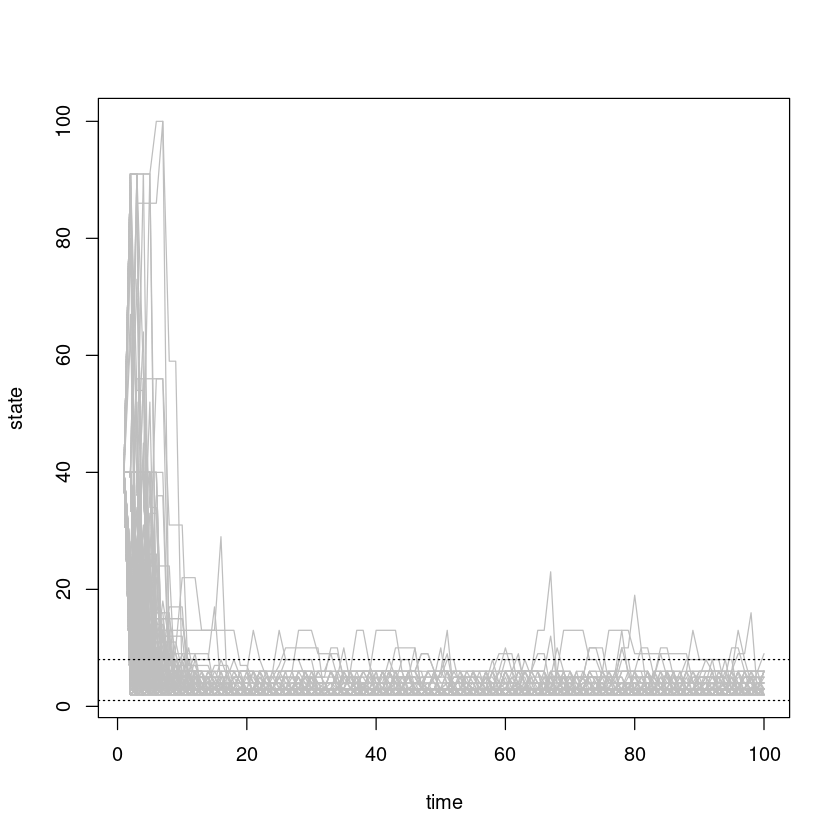

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


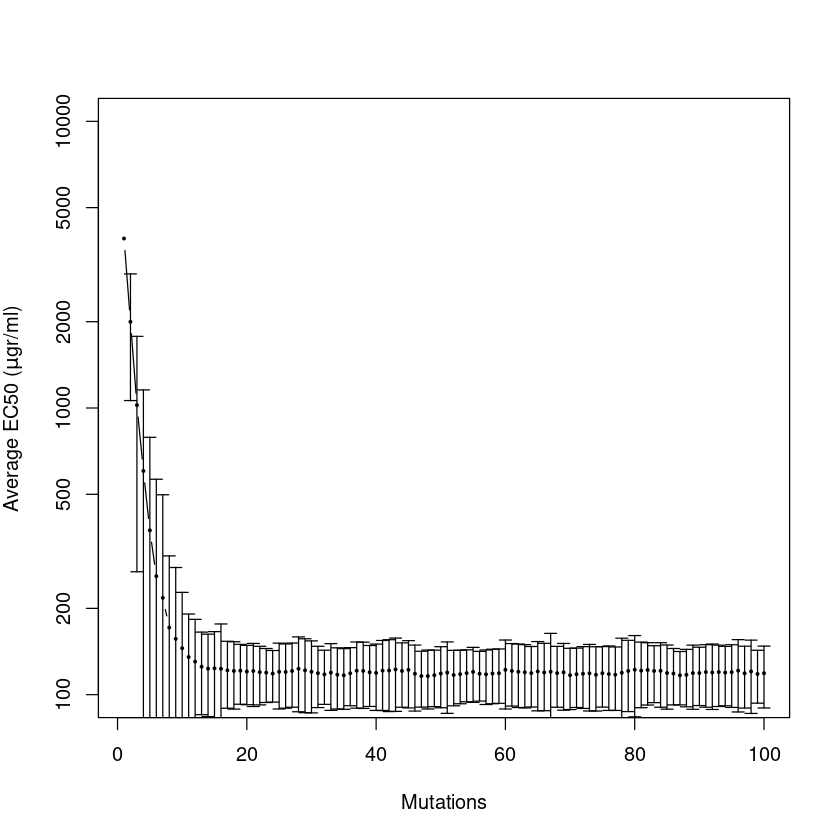

In [8]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1000  
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [9]:
pdf("Hill_n_1.2.pdf")
par(mar=c(5,6,4,2)+0.1)
plot(x, avg, type="b", pch=19, ylim=c(1000, 10000), cex=0.3, cex.lab=1.5, cex.axis=1.5, xlab="Rounds of evolution",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
dev.off()

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


png 
  2

In [ ]:
data=matrix(NA, nrow = 1000, ncol = 2)

resistance=c(R[chain.states[5,]], R[chain.states[100,]])
label=c(rep(5, 1000),rep(100, 1000))

data[,2]=as.factor(data[,2])

In [ ]:
rounds=c(2, 3, 5, 10, 20)

resistance <- vector()
label <- vector()

for (i in 1:length(rounds)){
    
  resistance= c(resistance, R[chain.states[rounds[i],]])  
  label= c(label, rep(rounds[i], 1000)) 
    
    
}

data=cbind(resistance, label)
colnames(data)=c("resistance","round")
data=as.data.frame(data)
data[,2]=as.factor(data[,2])

In [ ]:
pdf("T10_distributions_n_100.pdf")
ggplot(data, aes(x = resistance)) +
  geom_density(aes(fill = round), lwd=1.5, alpha=0.4)+scale_x_log10()+ 
    theme(axis.text=element_text(size=15),
        axis.title=element_text(size=15,face="bold"))+
labs(x = expression(paste("EC50 (", mu,"gr/ml)", sep="")) , y = "Density")+
coord_cartesian(ylim = c(0.0001, 10)) 

dev.off()


### Systematic variation of the Hill Coefficient

In [ ]:
# Levels to vary the Hill coefficient; actual Hill coefficient is half of each level

n_limit=30

Hill_matrix=matrix(NA, nrow = n_limit, ncol = 2)
colnames(Hill_matrix)=c("Average", "SD")


for (n in 1:30){
    

    Hill_coeff=n*0.5
    
  
#################################################################
#### Step 1: Defining the P matrix based on the Hill Coefficient
#################################################################    
    
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^Hill_coeff)
Fitness_mut= 1/(1+(X50/X_mut)^Hill_coeff) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}
    
  
#################################################################
#### Step 2: Performing simulations based on the transition matrix
#################################################################
  

# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1000  
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }

Hill_matrix[n,1]=EC50_avg_1[100]
Hill_matrix[n,2]=EC50_sd_1[100]

message("Level=", as.character(n), "| From", as.character(n_limit))
    
    
}

In [ ]:
pdf("Hill_coefficient_sensitivity.pdf")
par(mar=c(5,6,4,2)+0.1)
X=seq(1,30)*0.5
Y=Hill_matrix[,1]
SD=Hill_matrix[,2]

plot(X,Y, cex.lab=1.5, cex.axis=1.5,type="b", xlab="Hill Coefficient", ylab=expression(paste("EC50 (", mu,"gr/ml)", sep="")),
     ylim=c(10,10000), log="y", lwd=3, pch = 21, cex=2, col = rgb(red = 1, green = 0, blue = 0, alpha = 0.5), bg="GRAY")
arrows(X,  Y -  SD, X,  Y +  SD, code=3, lwd=3, angle = 90, length = 0.1, col="gray")
lines(X,Y, cex.lab=1.5, cex.axis=1.5,type="b", xlab="Hill Coefficient", ylab=expression(paste("EC50 (", mu,"gr/ml)", sep="")),
     ylim=c(10,10000), log="y", lwd=3, pch = 21, cex=2, col = rgb(red = 1, green = 0, blue = 0, alpha = 0.5), bg="GRAY")

abline(h=4000, lty=2)
dev.off()

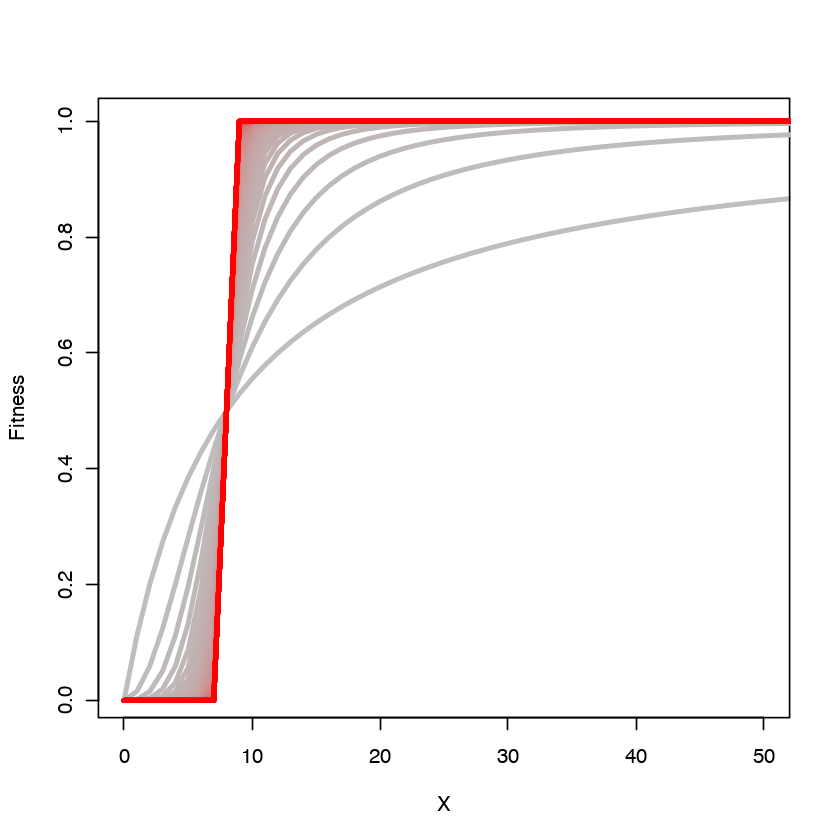

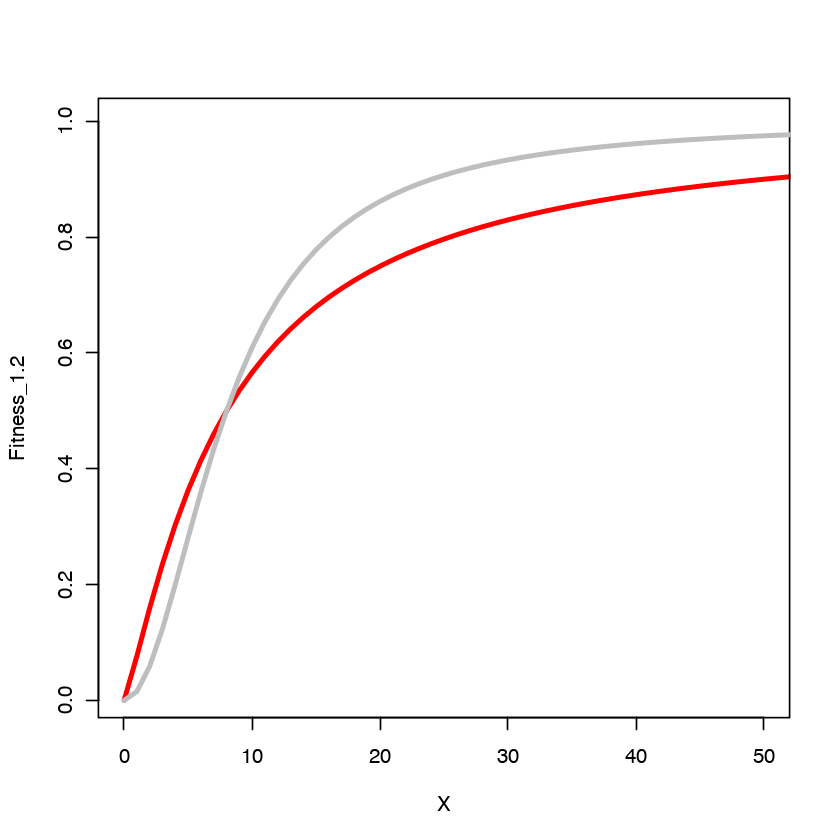

In [33]:
#pdf("Curves_hill_coefficient.pdf")
colfunc <- colorRampPalette(c("gray", "red"))
cols=colfunc(100)

for (n in 1:100){
Hill_coeff=n
AMP=10
X50=0.93*AMP-1.29


X=seq(0.01,1000, 1)
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness=  1/(1+(X50/X)^Hill_coeff)

if (n==1){
    plot(X, Fitness, ylim=c(0.01,1), xlim=c(0,50), type="l", col=cols[n], lwd=3)
    
} else {
    lines(X, Fitness, type="l", col=cols[n], lwd=3)
}


}

#dev.off()



AMP=10
X50=0.93*AMP-1.29

X=seq(0.01,1000, 1)
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_1.2=  1/(1+(X50/X)^1.2)
Fitness_2= 1/(1+(X50/X)^2)

plot(X, Fitness_1.2, ylim=c(0.01,1), xlim=c(0,50), type="l", col="red", lwd=3)
lines(X, Fitness_2, ylim=c(0.01,1), xlim=c(0,50), type="l", col="gray", lwd=3)

### Systematic variation of the % beneficial

In [ ]:
# Levels to vary the Hill coefficient; actual Hill coefficient is half of each level

n_limit=30

benef_matrix=matrix(NA, nrow = n_limit, ncol = 2)
colnames(benef_matrix)=c("Average", "SD")


for (b in 1:30){
    

#################################################################
#### Step 0: Tuning DFE
#################################################################    
 
    
# Distribution of molecular effects. Here we measure how much the resistance changes by single point mutations
# This can come from a toy model or deep mutational scanning experiments

# Fraction of beneficial mutations
f_b=b*0.01
f_fat=0.4
f_nn=1-(f_b + f_fat)
DME=rep(NA, 5000)

dist_b=rnorm(n = 100, mean = 2, sd = 0.1)
dist_nn=rnorm(n = 100, mean = 1, sd = 0.01)
dist_fat=rnorm(n = 100, mean = 0, sd = 0.1)

# DME components
DME_b=sample(dist_b, f_b*5000, replace = TRUE)
DME_nn=sample(dist_nn, f_nn*5000, replace = TRUE)
DME_fat=sample(dist_fat, f_fat*5000, replace = TRUE)

# DME
DME=c(DME_b, DME_nn, DME_fat)
   
    
  
#################################################################
#### Step 1: Defining the P matrix based on the Hill Coefficient
#################################################################    
    
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}
    
  
#################################################################
#### Step 2: Performing simulations based on the transition matrix
#################################################################
  

# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1000  
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }

benef_matrix[b,1]=EC50_avg_1[100]
benef_matrix[b,2]=EC50_sd_1[100]

message("Level=", as.character(b), "| From", as.character(n_limit))
    
    
}

In [ ]:
benef_matrix

In [ ]:
pdf("Beneficial_percentage_sensitivity.pdf")
par(mar=c(5,6,4,2)+0.1)
X=seq(1,30)*0.01
Y=benef_matrix[,1]
SD=benef_matrix[,2]

plot(X,Y, cex.lab=1.5, cex.axis=1.5,type="b", xlab="% beneficial mutations", ylab=expression(paste("Limiting EC50 (", mu,"gr/ml)", sep="")),
     ylim=c(10,4000), lwd=3, pch = 21, cex=2, col = rgb(red = 1, green = 0, blue = 0, alpha = 0.5), bg="GRAY")
arrows(X,  Y -  SD/2, X,  Y +  SD/2, code=3, lwd=3, angle = 90, length = 0.1, col="gray")
lines(X,Y, cex.lab=1.5, cex.axis=1.5,type="b", xlab="Hill Coefficient", ylab=expression(paste("EC50 (", mu,"gr/ml)", sep="")),
     ylim=c(10,10000), Lwd=3, pch = 21, cex=2, col = rgb(red = 1, green = 0, blue = 0, alpha = 0.5), bg="GRAY")

dev.off()

### Trajectories with different %beneficial mutations

In [63]:
rm(list=ls())

In [64]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [74]:
# Distribution of molecular effects. Here we measure how much the resistance changes by single point mutations
# This can come from a toy model or deep mutational scanning experiments

# Fraction of beneficial mutations
f_b=0.05
f_fat=0.7
f_nn=1-(f_b + f_fat)
DME=rep(NA, 5000)

dist_b=rnorm(n = 100, mean = 2, sd = 0.1)
dist_nn=rnorm(n = 100, mean = 1, sd = 0.01)
dist_fat=rnorm(n = 100, mean = 0, sd = 0.1)

# DME components
DME_b=sample(dist_b, f_b*5000, replace = TRUE)
DME_nn=sample(dist_nn, f_nn*5000, replace = TRUE)
DME_fat=sample(dist_fat, f_fat*5000, replace = TRUE)

# DME
DME=c(DME_b, DME_nn, DME_fat)


In [75]:
#DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [76]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [77]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [78]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

In [79]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1000  
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}



EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1




In [80]:
pdf("T10_n_5_benef_0.05_EC50.pdf")
par(mar=c(5,6,4,2)+0.1)
par(mfrow = c(2,1))
plot(x, avg, type="b", pch=19, ylim=c(1, 5000), cex.lab=1.5, cex.axis=1.5, cex=0.3, xlab="Rounds", ylab=expression(paste("EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
dev.off()

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


pdf 
  2

### Fraction of different types of mutations

In [1]:
library("ggplot2")
library("ggnewscale")

In [2]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [3]:
# Distribution of molecular effects. Here we measure how much the resistance changes by single point mutations
# This can come from a toy model or deep mutational scanning experiments

# Fraction of beneficial mutations
f_b=0.10
f_fat=0.7
f_nn=1-(f_b + f_fat)
DME=rep(NA, 5000)

dist_b=rnorm(n = 100, mean = 2, sd = 0.1)
dist_nn=rnorm(n = 100, mean = 1, sd = 0.01)
dist_fat=rnorm(n = 100, mean = 0, sd = 0.1)

# DME components
DME_b=sample(dist_b, f_b*5000, replace = TRUE)
DME_nn=sample(dist_nn, f_nn*5000, replace = TRUE)
DME_fat=sample(dist_fat, f_fat*5000, replace = TRUE)

# DME
DME=c(DME_b, DME_nn, DME_fat)


In [4]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [5]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [6]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [7]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

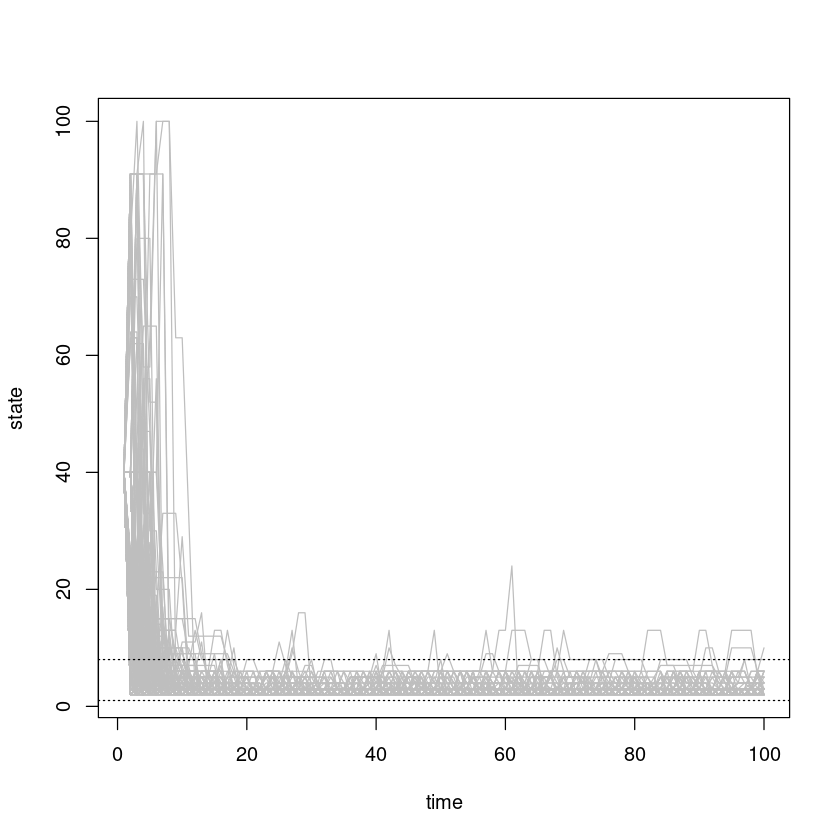

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


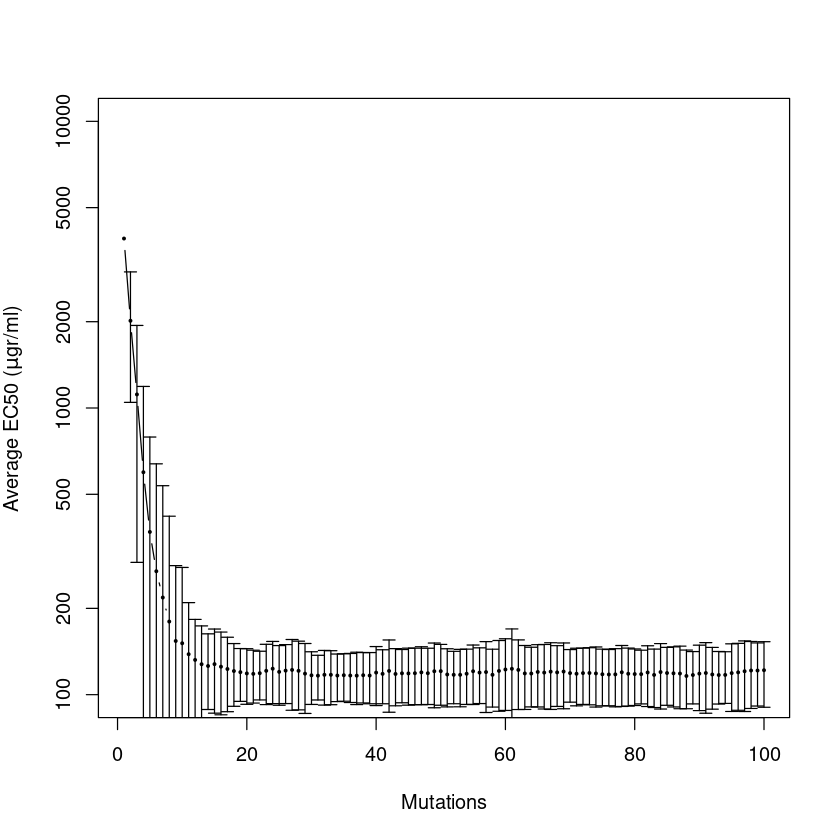

In [8]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1000  
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [9]:
 Ns_calc <- function(R_before, R_after, N){
    
 # The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4



    X_WT=log2(R_before)
    X_mut=log2(R_after)
    
    Fitness_WT=1/(1+(X50/X_WT)^5)
    Fitness_mut=1/(1+(X50/X_mut)^5) 
 
    s=Fitness_mut - Fitness_WT
    return(N*s)
    
    }

In [10]:
Perc_pos=Perc_neg=Perc_neu=rep(NA, num.iterations -1)

for (i in 2:num.iterations){
    
    Spec=Ns_calc(R_before = chain.states[i-1,], R_after = chain.states[i,], N = 1e7)
    
    Perc_pos[i]=length(which(Spec > 1))/length(Spec)
    Perc_neg[i]=length(which(Spec < -1))/length(Spec)
    Perc_neu[i]=length( which((Spec <= 1) & (Spec  >= -1)))/length(Spec)
   
    

  }  

In [17]:
Percentage_matrix=cbind(seq(1,100),Perc_pos, Perc_neg, Perc_neu)
colnames(Percentage_matrix)=c("Generation", "Beneficial", "Deleterious", "Neutral")

write.csv(Percentage_matrix, "./Theory_figures_for_Ayse_SvgFormat/Percentage_PopGen.csv", row.names=FALSE)

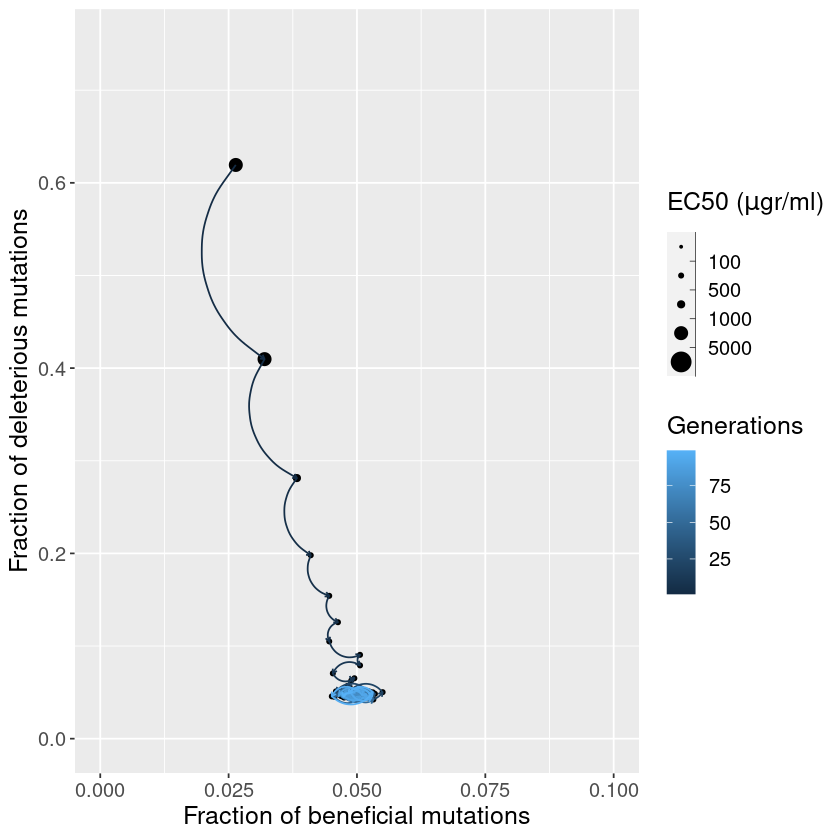

In [48]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neg, col=round(avg));

b <- ggplot(Perc, aes(Perc_pos, Perc_neg))+ geom_point(aes(size=col))+
      xlim(0, 0.1)+ylim(0,0.75)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of beneficial mutations", y = "Fraction of deleterious mutations")+
    theme(text = element_text(size = 15))+
     scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neg[i], y2 = Perc_neg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.10,"cm")),);

}

#pdf("./Theory_figures/Fraction_NEG_vs_POS_mutations.pdf")
print(b)
#dev.off()



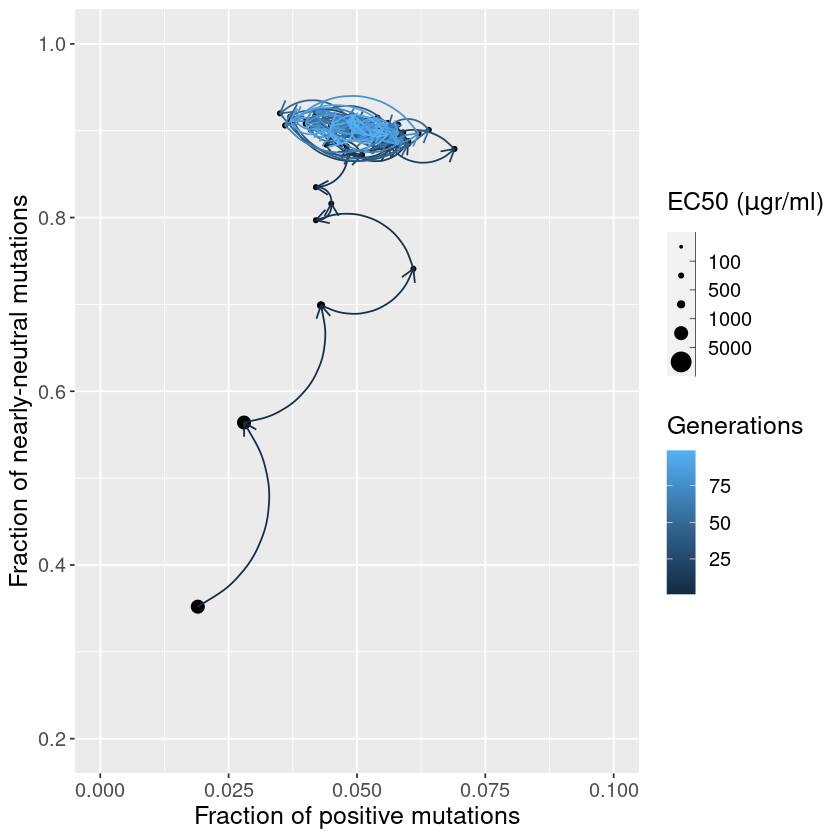

In [14]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neu, col=round(avg));

b <- ggplot(Perc, aes(Perc_pos, Perc_neu))+ geom_point(aes(size=col))+
      xlim(0, 0.1)+ylim(0.2,1)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of positive mutations", y = "Fraction of nearly-neutral mutations")+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neu[i], y2 = Perc_neu[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}

#pdf("./Theory_figures/Fraction_NN_vs_POS_mutations.pdf")
print(b)
#dev.off()



In [74]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neg, col_point=avg);

b <- ggplot(Perc, aes(Perc_pos, Perc_neg))+ geom_point(aes(colour=col_point, size=3))+
      xlim(0, 0.1)+ylim(0,0.75)+
    scale_colour_gradientn(colours = c("yellow", "darkred"))+
    labs( col=expression(paste("EC50 (", mu, "gr/ml)")), x ="Fraction of positive mutations", y = "Fraction of negative mutations")+
    theme(text = element_text(size = 15))

limit=length(Perc_neg)-1;


b <- b + new_scale_colour()  


for (i in 1:limit){

# start a new scale

df <- data.frame(col_curve=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neg[i], y2 = Perc_neg[i+1]);

b <- b + 
    geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col_curve), 
               data = df, arrow = arrow(length=unit(0.20,"cm")))
    
}

b <- b + labs(colour = "Generations")


pdf("./Theory_figures/Fraction_NEG_vs_POS_mutations_two_colors.pdf")
print(b)
dev.off()



png 
  2

In [75]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neu, col_point=avg);

b <- ggplot(Perc, aes(Perc_pos, Perc_neu))+ geom_point(aes(colour=col_point, size=3))+
      xlim(0, 0.1)+ylim(0.2,1)+
    scale_colour_gradientn(colours = c("yellow", "darkred"))+
    labs( col=expression(paste("EC50 (", mu, "gr/ml)")), x ="Fraction of positive mutations", y = "Fraction of negative mutations")+
    theme(text = element_text(size = 15))

limit=length(Perc_neu)-1;


b <- b + new_scale_colour()  


for (i in 1:limit){

# start a new scale

df <- data.frame(col_curve=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neu[i], y2 = Perc_neu[i+1]);

b <- b + 
    geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col_curve), 
               data = df, arrow = arrow(length=unit(0.20,"cm")))
    
}

b <- b + labs(colour = "Generations")


pdf("./Theory_figures/Fraction_NN_vs_POS_mutations_two_colors.pdf")
print(b)
dev.off()



png 
  2

In [88]:
df=cbind(EC50_avg_1, EC50_sd_1)
colnames(df)=c("EC50_average", "EC50_sd")
rownames(df)=paste("Round_",seq(1,100),sep="")
write.csv(df, "Data_Figure_5e.csv")

,EC50_average,EC50_sd
Round_1,3901.0,0.00000
Round_2,2008.0,1854.27866
Round_3,1055.7,1531.04605
Round_4,650.5,1220.99573
Round_5,431.7,989.28570
Round_6,293.4,699.02137
Round_7,221.2,474.52833
Round_8,187.0,407.83616
Round_9,177.6,388.64313
Round_10,153.5,217.44202


## What Nobu wants; different starting points

In [24]:
R=seq(2,10000, 10) ## 250 is the maximum of observed EC50 of variants
States=seq(1, length(R))

In [25]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [26]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [28]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [29]:
# simulate discrete Markov chains according to transition matrix P
run.mc.sim <- function( P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

In [30]:
### Initial_point_1

T10_list_chain_states=list()

initial_EC50=c(20, 100, 500, 1000, 5000)

for (k in 1:5){
init_EC50=initial_EC50[k]



check_init=length(which(R>init_EC50))

if (check_init > 0) {

init_state=which(R>init_EC50)[1]-1

num.chains     <- 1000  ## These are independent variables (cells) that can jump between states
    
num.iterations <- 100
chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


#matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
#abline(h=1, lty=3)
#abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
    
    }



} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }

T10_list_chain_states[[k]]=chain.states
    
   message("Initial_EC50=", as.character(initial_EC50[k])) 
}    

Initial_EC50=20

Initial_EC50=100

Initial_EC50=500

Initial_EC50=1000

Initial_EC50=5000



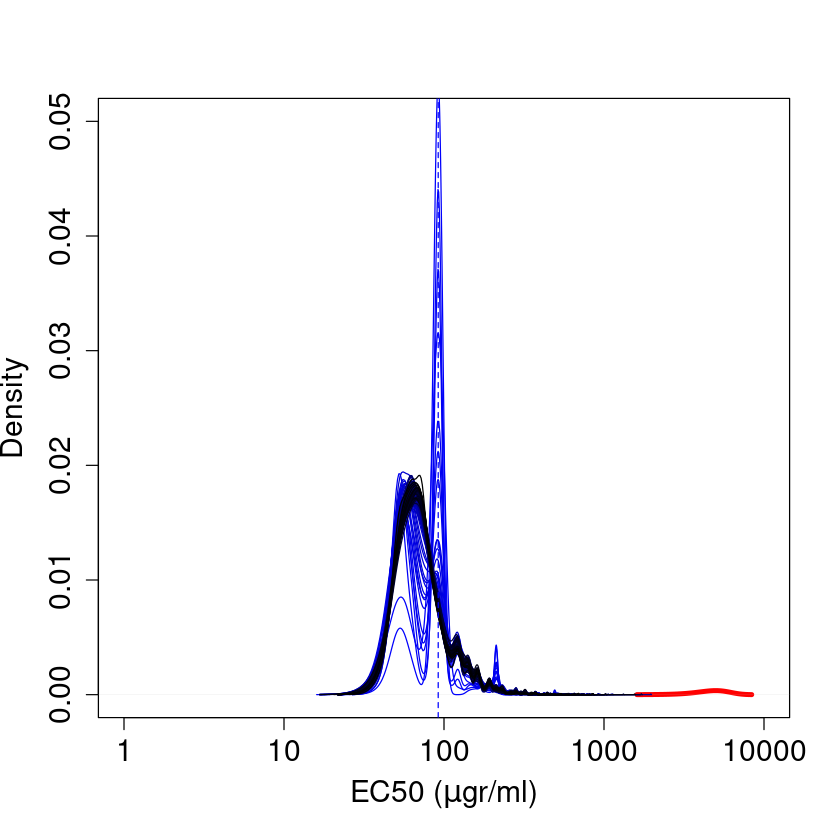

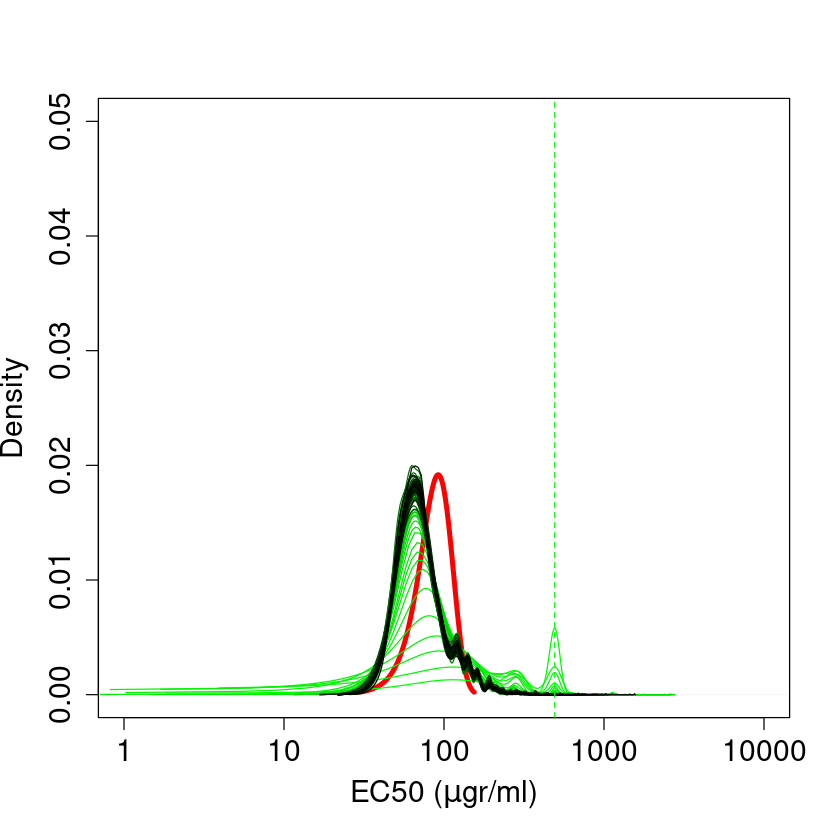

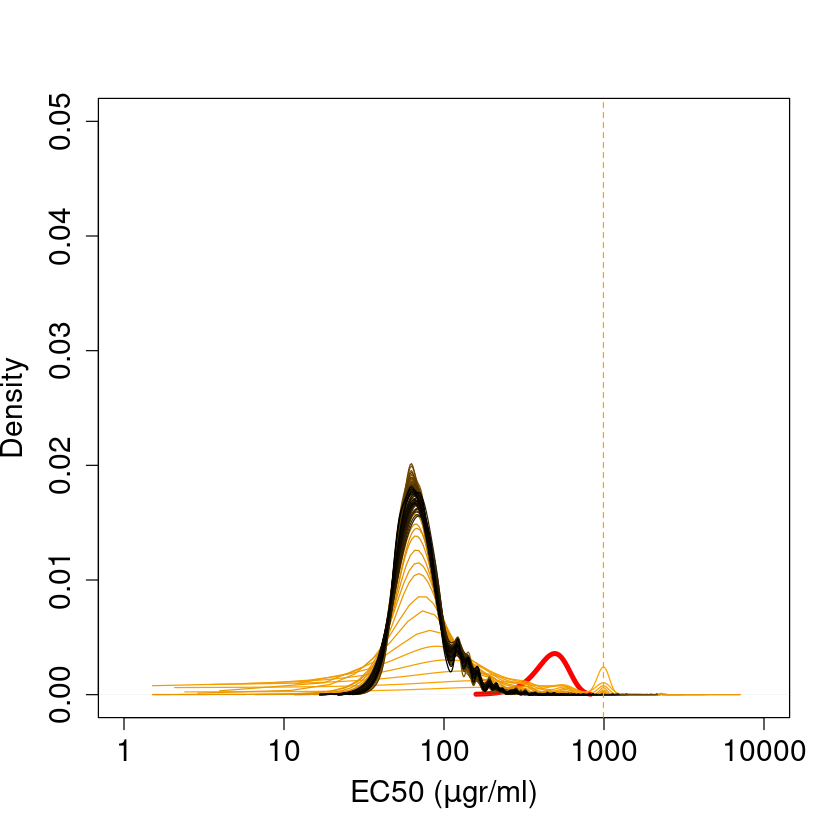

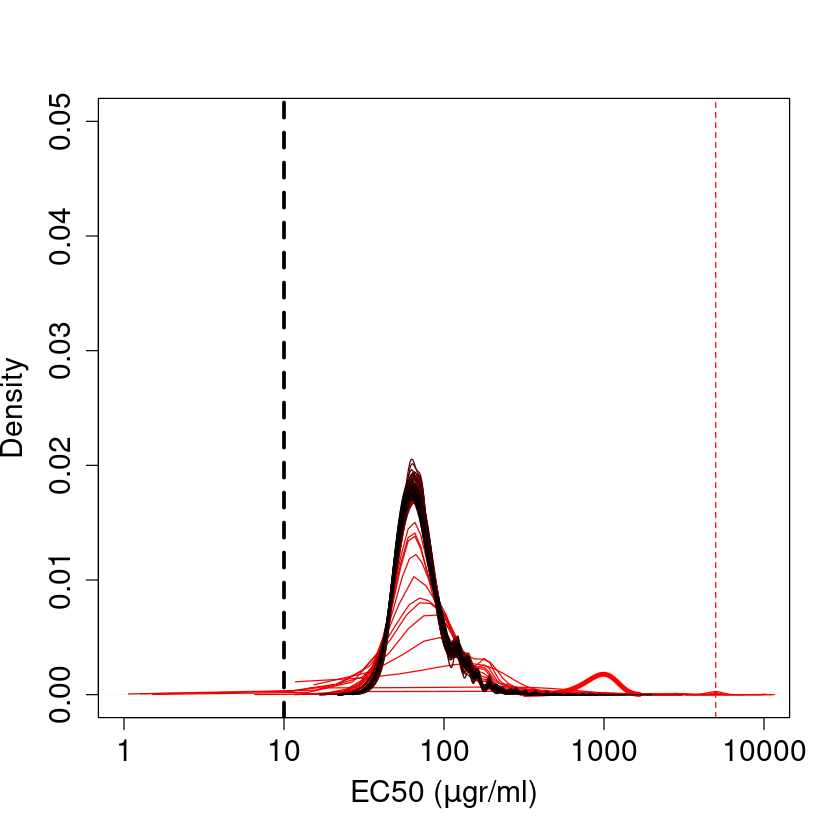

In [38]:
## We'll plot the evolution of distributions here

#pdf("Nobus_plot.pdf")
MAT=T10_list_chain_states[[5]]

colours=c("shit", "blue", "green", "orange", "red") 


for (k in 2:5){

plot(density(R[MAT[1,]]), col="red", cex.lab=1.5, cex.axis=1.5, main="", xlab=expression(paste("EC50 (", mu,"gr/ml)")), log="x", ylim=c(0,0.05), xlim=c(1,10000), lwd=4)

colfunc <- colorRampPalette(c(colours[k], "black"))
cols=colfunc(100)

MAT=T10_list_chain_states[[k]]

initital_EC50=R[MAT[1,1]]

for (i in 2:100){

lines(density(R[MAT[i,]]), col=cols[i])    

}

abline(v=initital_EC50, col=colours[k], lty=2)
    
}

abline(v=10, lty=2, lwd=3)
#dev.off()


In [72]:
## We'll plot the evolution of distributions here

pdf("Nobus_plot_all_in_one.pdf")

#MAT=T10_list_chain_states[[5]]

colours=c("shit", "blue", "green", "orange", "red") 


plot(density(R[MAT[1,]]), col="gray", cex.lab=1.5, cex.axis=1.5, main="", xlab=expression(paste("EC50 (", mu,"gr/ml)")), log="x", ylim=c(0,0.08), xlim=c(1,10000), lwd=4)

for (k in 2:5){

MAT=T10_list_chain_states[[k]]
    
lines(density(R[MAT[1,]]), col=colours[k], cex.lab=1.5, cex.axis=1.5, main="", xlab=expression(paste("EC50 (", mu,"gr/ml)")), log="x", ylim=c(0,0.08), xlim=c(1,10000), lwd=4)

colfunc <- colorRampPalette(c(colours[k], "black"))
cols=colfunc(100)



initital_EC50=R[MAT[1,1]]

for (i in 2:100){

lines(density(R[MAT[i,]]), col=cols[i])    

}

abline(v=initital_EC50, col=colours[k], lty=2, lwd=3)
abline(h=0)

abline(v=10, lty=2, lwd=3)
    
}

dev.off()


png 
  2

In [71]:
## We'll plot the evolution of distributions here

pdf("Nobus_plot_separate.pdf")

#MAT=T10_list_chain_states[[5]]

colours=c("shit", "blue", "green", "orange", "red") 


par(mfrow = c(2,2))
for (k in 2:5){

MAT=T10_list_chain_states[[k]]
plot(density(R[MAT[1,]]), col="gray", cex.lab=1.5, cex.axis=1.5, main="", xlab=expression(paste("EC50 (", mu,"gr/ml)")), log="x", ylim=c(0,0.08), xlim=c(1,10000), lwd=4)
   
lines(density(R[MAT[1,]]), col=colours[k], cex.lab=1.5, cex.axis=1.5, main="", xlab=expression(paste("EC50 (", mu,"gr/ml)")), log="x", ylim=c(0,0.08), xlim=c(1,10000), lwd=4)

colfunc <- colorRampPalette(c(colours[k], "black"))
cols=colfunc(100)



initital_EC50=R[MAT[1,1]]

for (i in 2:100){

lines(density(R[MAT[i,]]), col=cols[i])    

}

abline(v=initital_EC50, col=colours[k], lty=2, lwd=3)
abline(h=0)

abline(v=10, lty=2, lwd=3)
    
}

dev.off()


png 
  2

## Fraction of positiv and negative mutations from resistance perspective

In [19]:
library("ggplot2")
library("ggnewscale")

In [20]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [21]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [22]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [23]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [24]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

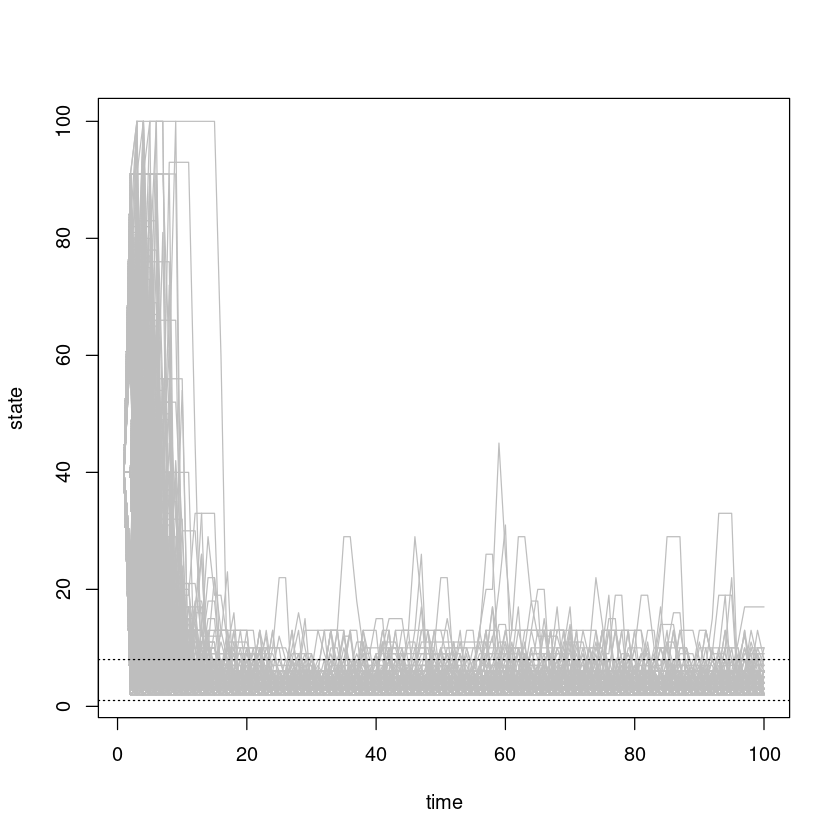

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


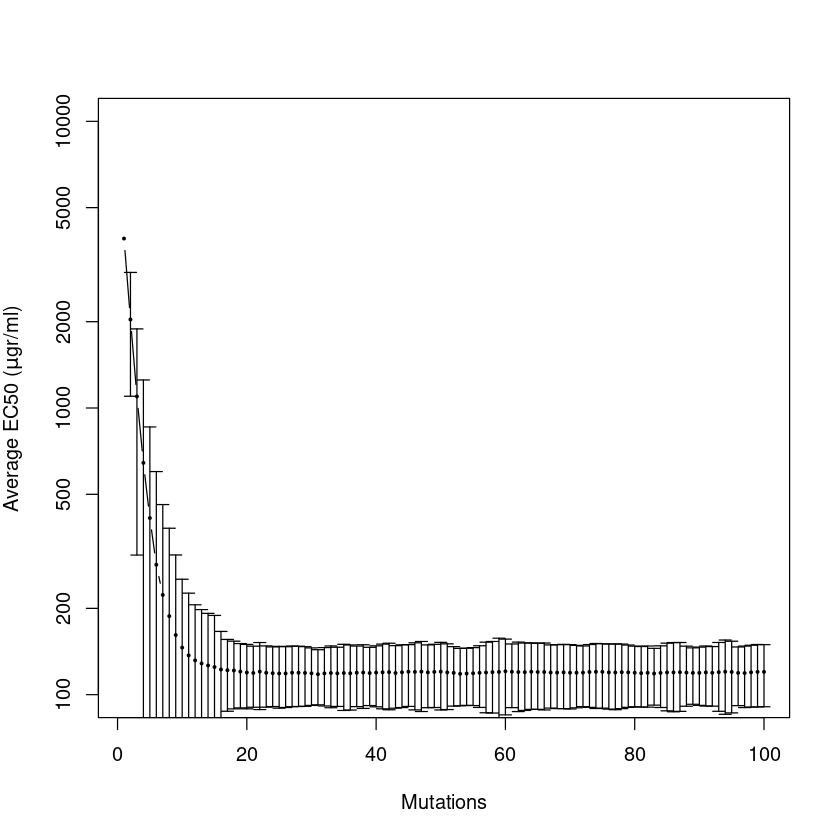

In [25]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [26]:
Ns_calc_EC50 <- function(R_before, R_after, N){
    
    s= R_after -R_before
    return(s)
     
    
    }

In [27]:
Perc_pos=Perc_neg=Perc_neu=rep(NA, num.iterations)

for (i in 1:num.iterations-1){
    
    Spec=Ns_calc_EC50(R_before = chain.states[i,], R_after = chain.states[i+1,], N = 1e7)
    
    Perc_pos[i]=length(which(Spec > 0))/length(Spec)
    Perc_neg[i]=length(which(Spec < 0))/length(Spec)
    Perc_neu[i]=length(which((Spec == 0)))/length(Spec)
   

  }  

In [28]:
Percentage_matrix=cbind(seq(1,100),Perc_pos, Perc_neg, Perc_neu)
colnames(Percentage_matrix)=c("Generation", "Positive", "Negative", "Neutral")

write.csv(Percentage_matrix, "./Theory_figures_for_Ayse_SvgFormat/Percentage_Resistance.csv", row.names=FALSE)

Warning message in file(file, ifelse(append, "a", "w")):
“cannot open file './Theory_figures_for_Ayse_SvgFormat/Percentage_Resistance.csv': No such file or directory”


ERROR: Error in file(file, ifelse(append, "a", "w")): cannot open the connection


In [ ]:
### Fraction of Positive versus Negative mutations

options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neg, col_point=avg);

b <- ggplot(Perc, aes(Perc_pos, Perc_neg))+ geom_point(aes(colour=col_point, size=3))+
      xlim(0, 0.1)+ylim(0,0.75)+
    scale_colour_gradientn(colours = c("yellow", "darkred"))+
    labs( col=expression(paste("EC50 (", mu, "gr/ml)")), x ="Fraction of positive mutations", y = "Fraction of negative mutations")+
    theme(text = element_text(size = 15))

limit=length(Perc_neg)-1;


b <- b + new_scale_colour()  


for (i in 1:limit){

# start a new scale

df <- data.frame(col_curve=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neg[i], y2 = Perc_neg[i+1]);

b <- b + 
    geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col_curve), 
               data = df, arrow = arrow(length=unit(0.20,"cm")))
    
}

b <- b + labs(colour = "Generations")


#pdf("./Theory_figures/Fraction_NEG_vs_POS_resistance_definition.pdf")
print(b)
#dev.off()



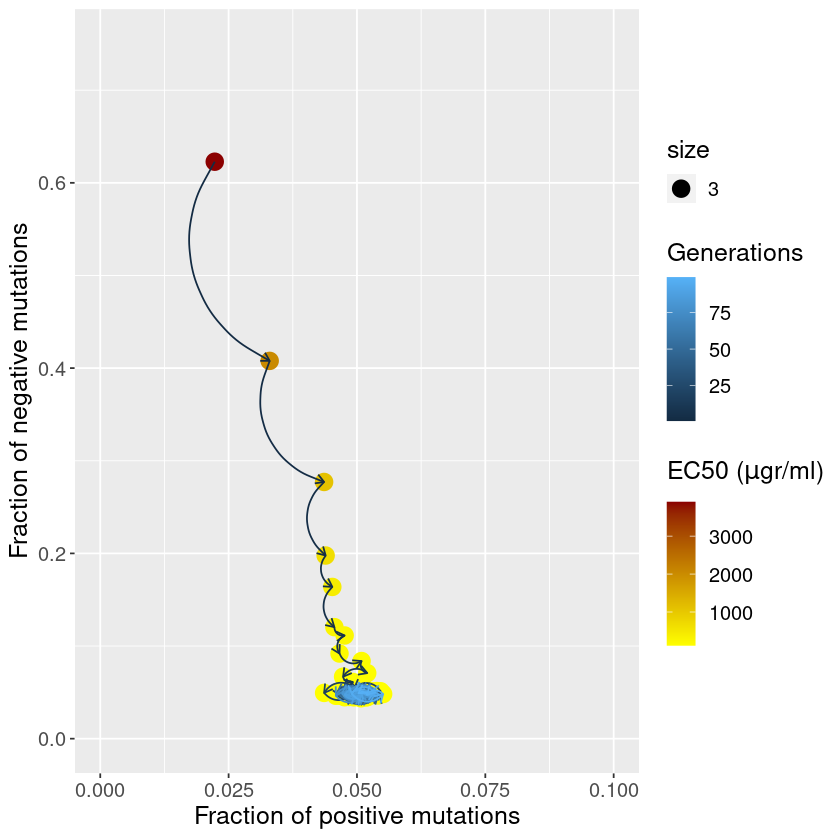

In [29]:
### Fraction of Positive versus Negative mutations

options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neg, col_point=avg);

b <- ggplot(Perc, aes(Perc_pos, Perc_neg))+ geom_point(aes(colour=col_point, size=3))+
      xlim(0, 0.1)+ylim(0,0.75)+
    scale_colour_gradientn(colours = c("yellow", "darkred"))+
    labs( col=expression(paste("EC50 (", mu, "gr/ml)")), x ="Fraction of positive mutations", y = "Fraction of negative mutations")+
    theme(text = element_text(size = 15))

limit=length(Perc_neg)-1;


b <- b + new_scale_colour()  


for (i in 1:limit){

# start a new scale

df <- data.frame(col_curve=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neg[i], y2 = Perc_neg[i+1]);

b <- b + 
    geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col_curve), 
               data = df, arrow = arrow(length=unit(0.20,"cm")))
    
}

b <- b + labs(colour = "Generations")


#pdf("./Theory_figures/Fraction_NEG_vs_POS_resistance_definition.pdf")
print(b)
#dev.off()



In [30]:
options(warn = -1)

Perc <- data.frame(Perc_pos, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_pos, avg))+ geom_point(aes(size=col))+
      xlim(0, 0.1)+ ylim(0,4000)+
      scale_y_log10()+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of positive mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}

pdf("./For_Ayse_SvgFormat/November_4th/point_6_EC50_vs_pos_mutations.pdf")
print(b)
dev.off()



Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



png 
  2

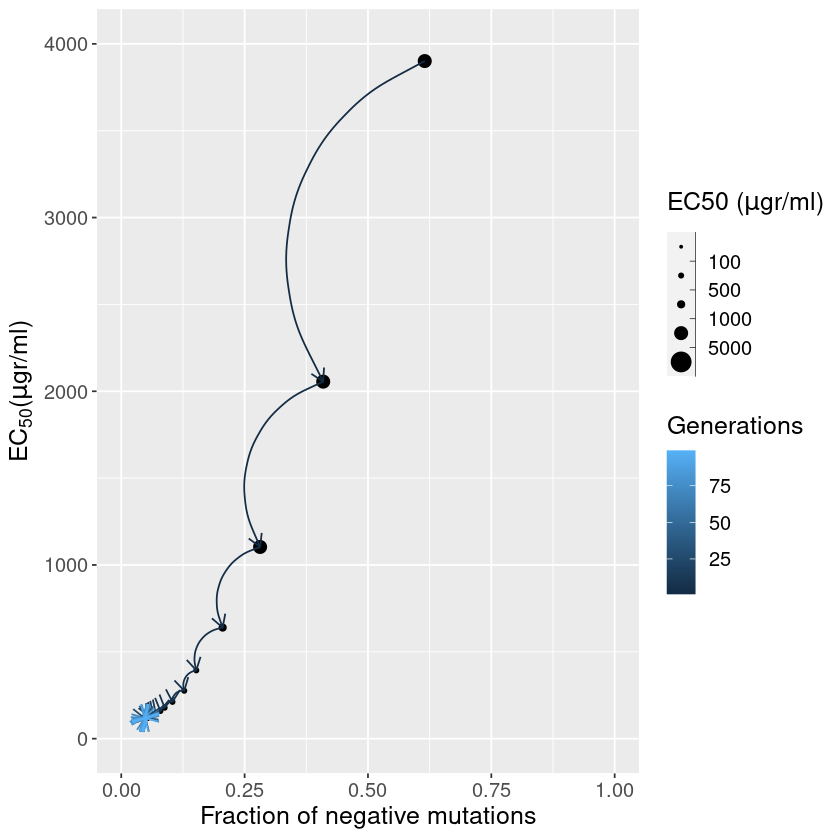

In [144]:
options(warn = -1)

Perc <- data.frame(Perc_neg, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_neg, avg))+ geom_point(aes(size=col))+
      xlim(0, 1)+ ylim(0,4000)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of negative mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_neg[i], x2 = Perc_neg[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}


#pdf("./Theory_figures/EC50_vs_neg_mutations.pdf")
print(b)
#dev.off()



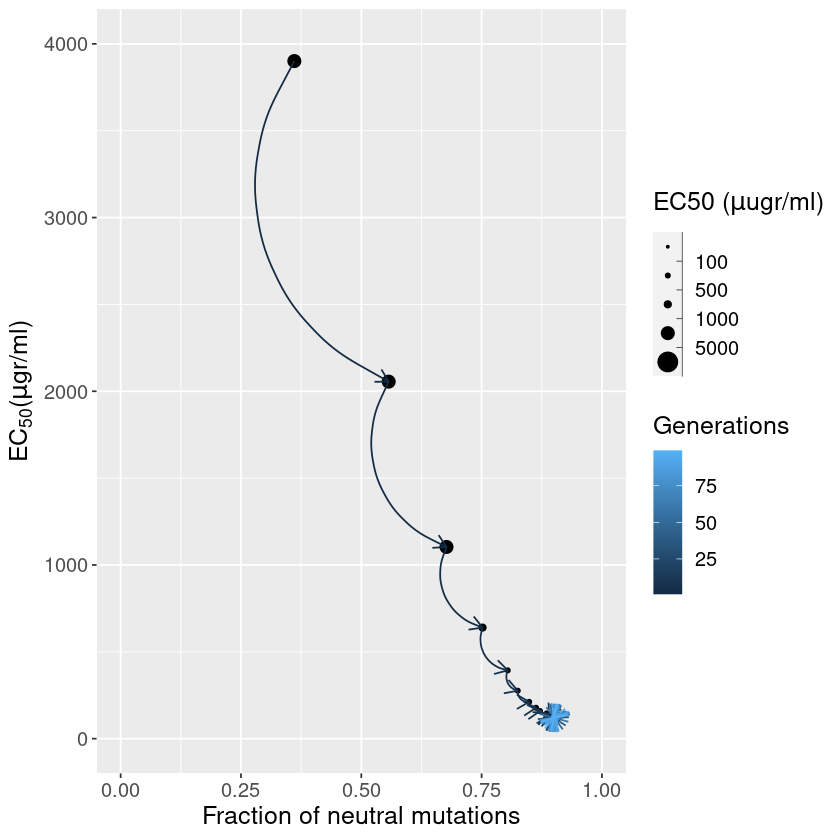

In [145]:
options(warn = -1)

Perc <- data.frame(Perc_neu, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_neu, avg))+ geom_point(aes(size=col))+
      xlim(0, 1)+ ylim(0,4000)+

    labs(size= expression(paste("EC50 (", mu, "ugr/ml)")), 
       col="Generations", x ="Fraction of neutral mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_neu[i], x2 = Perc_neu[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}


#pdf("./Theory_figures/EC50_vs_neutral_mutations.pdf")
print(b)
#dev.off()



##### Show the change in fraction by Pie Charts

In [148]:
library("plotrix")

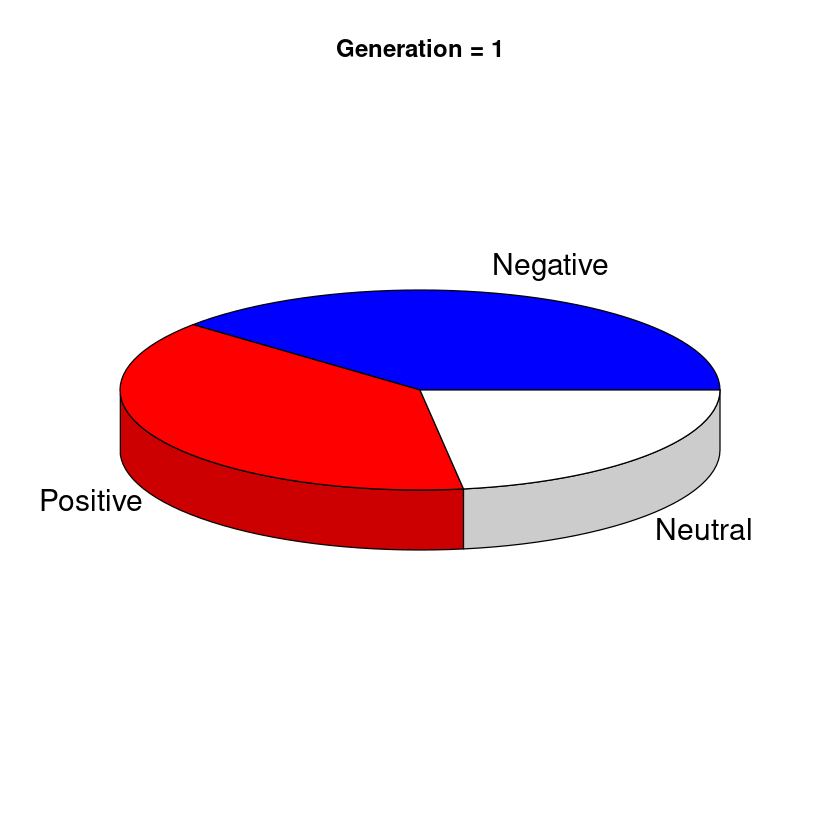

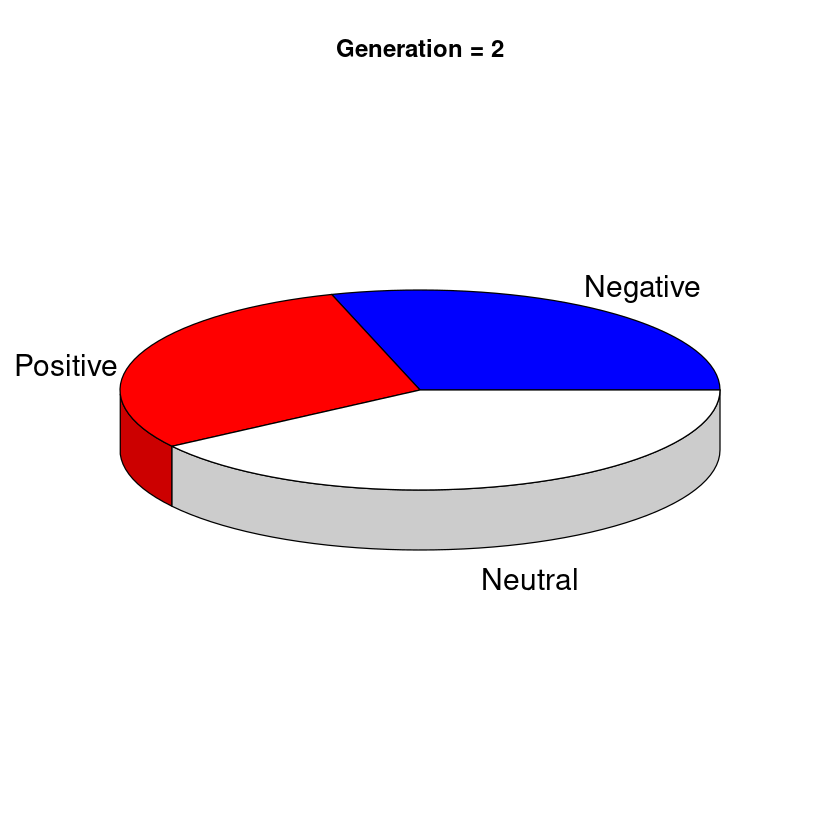

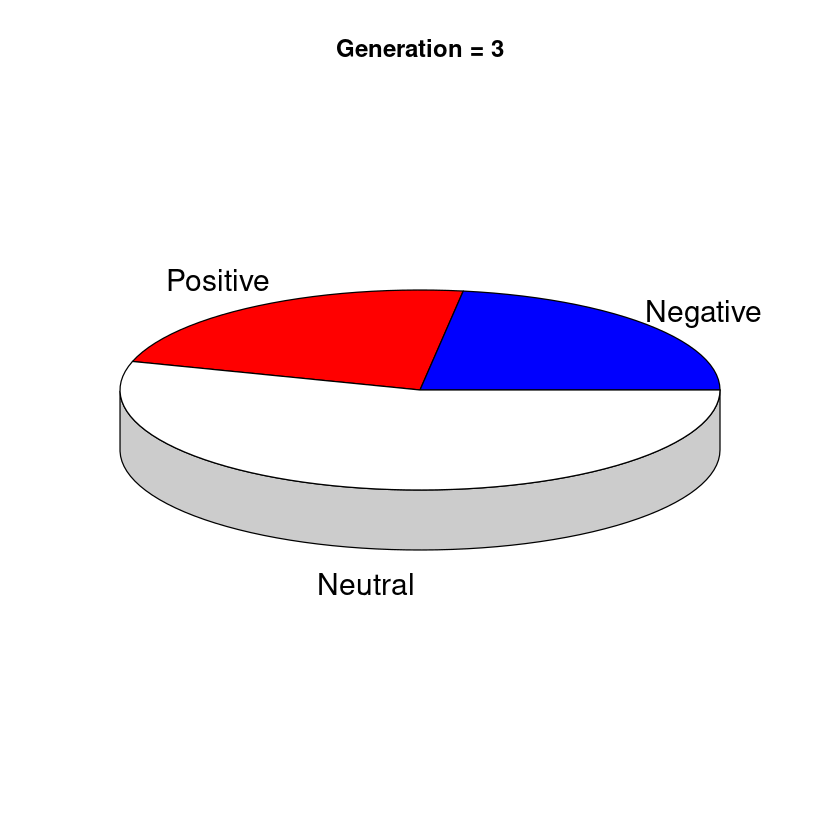

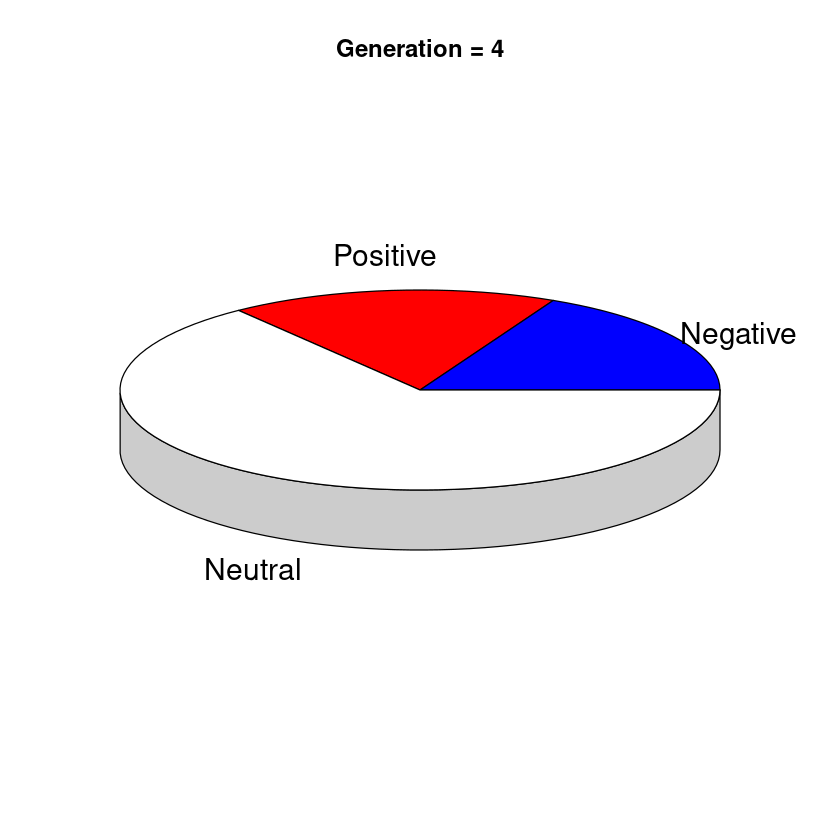

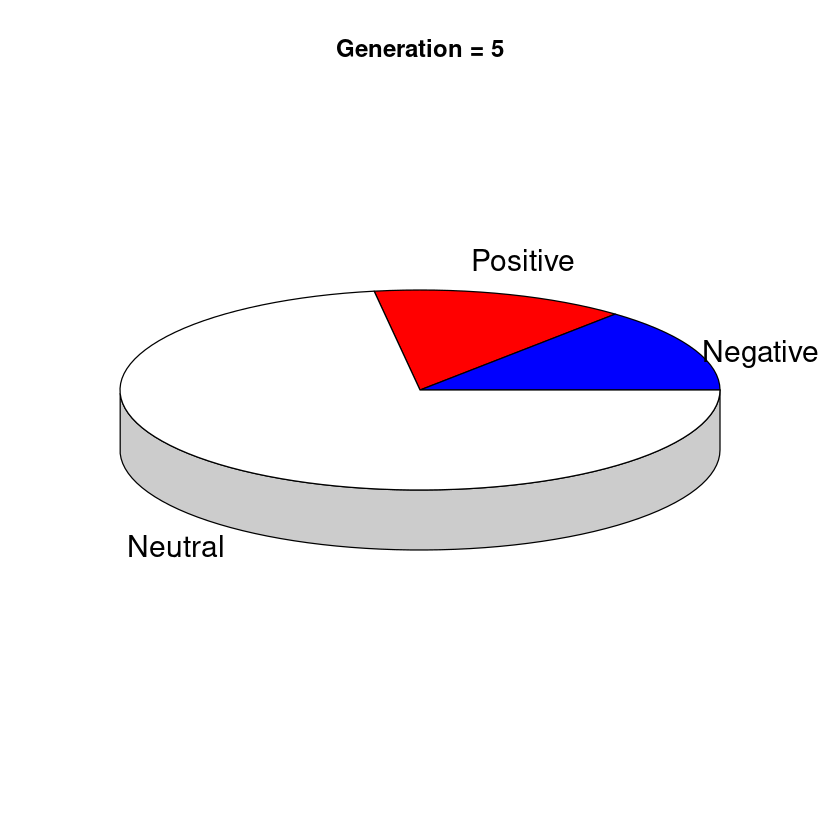

...

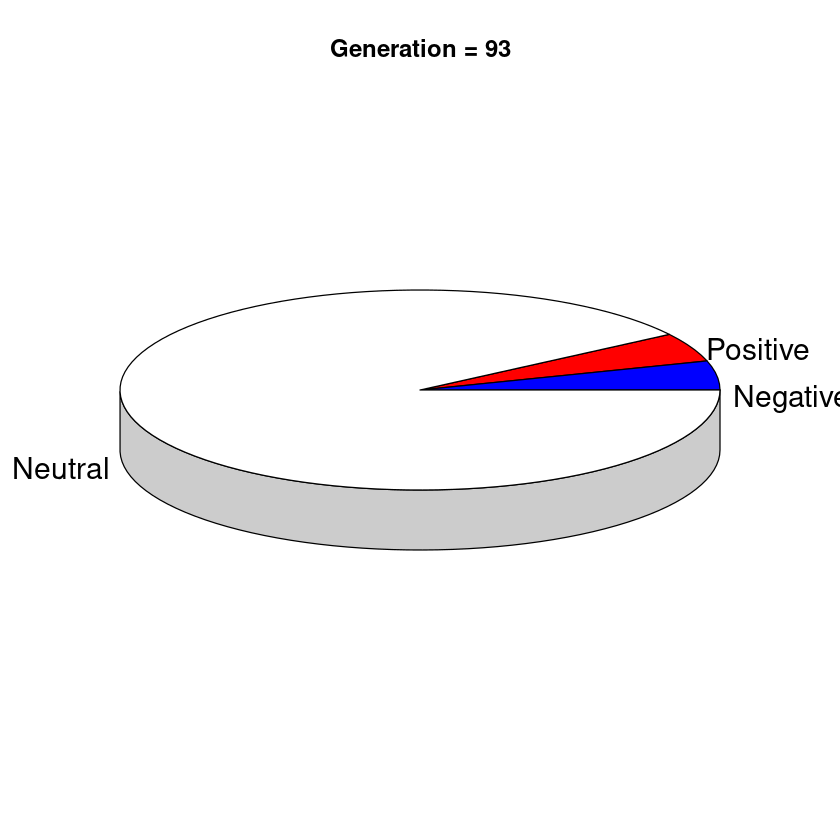

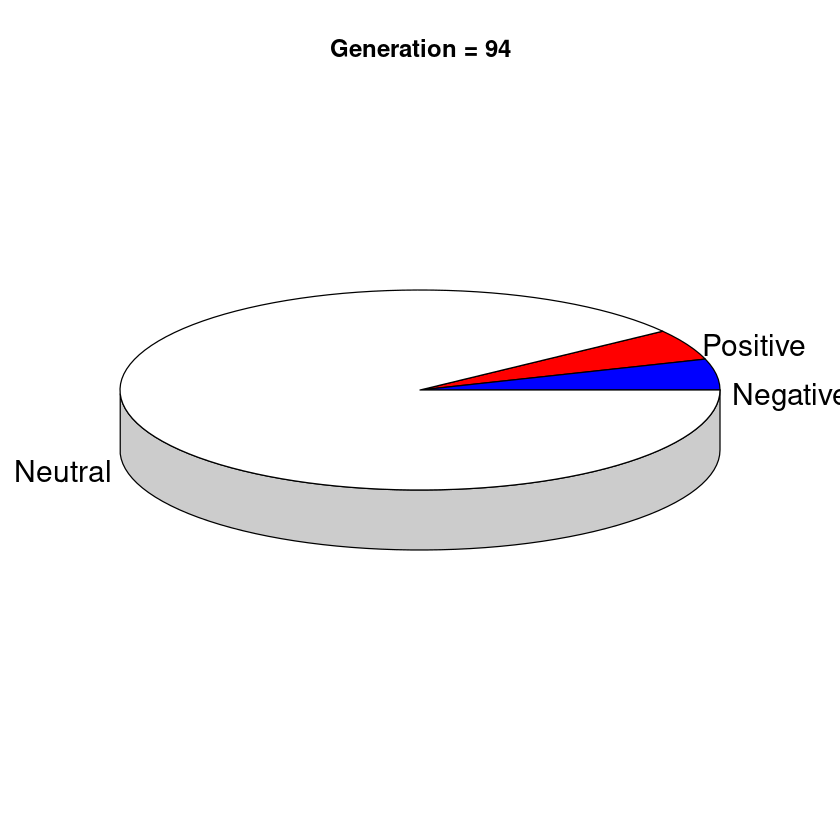

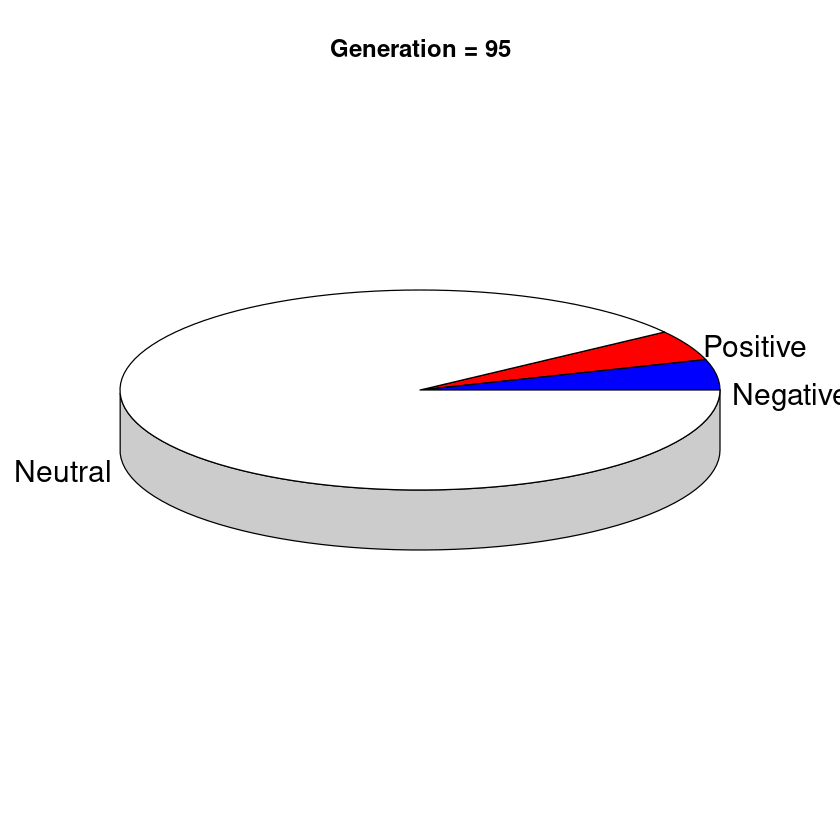

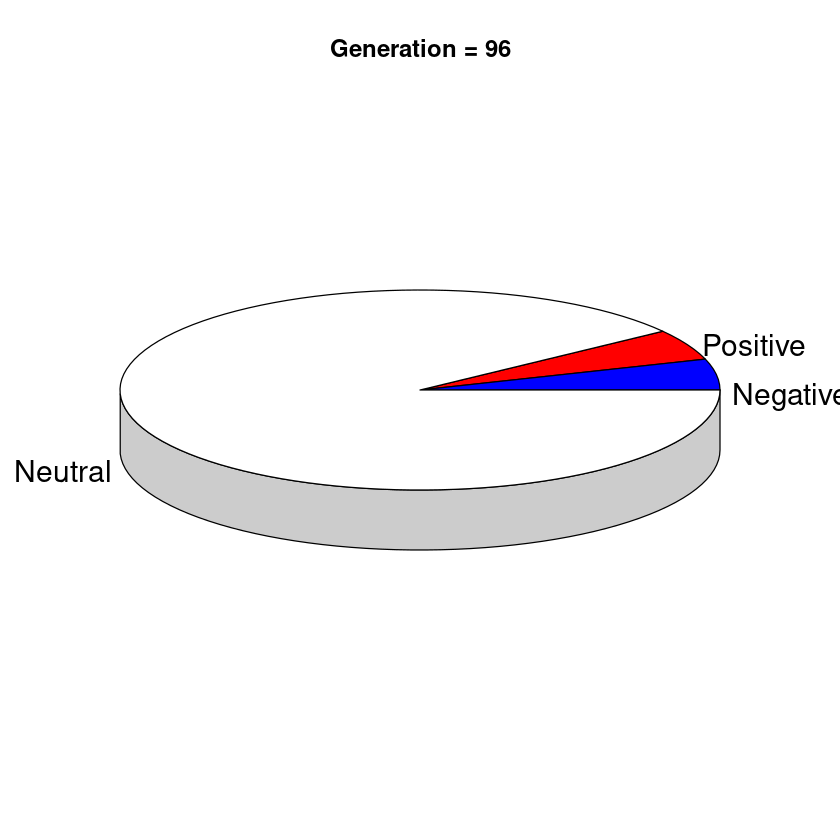

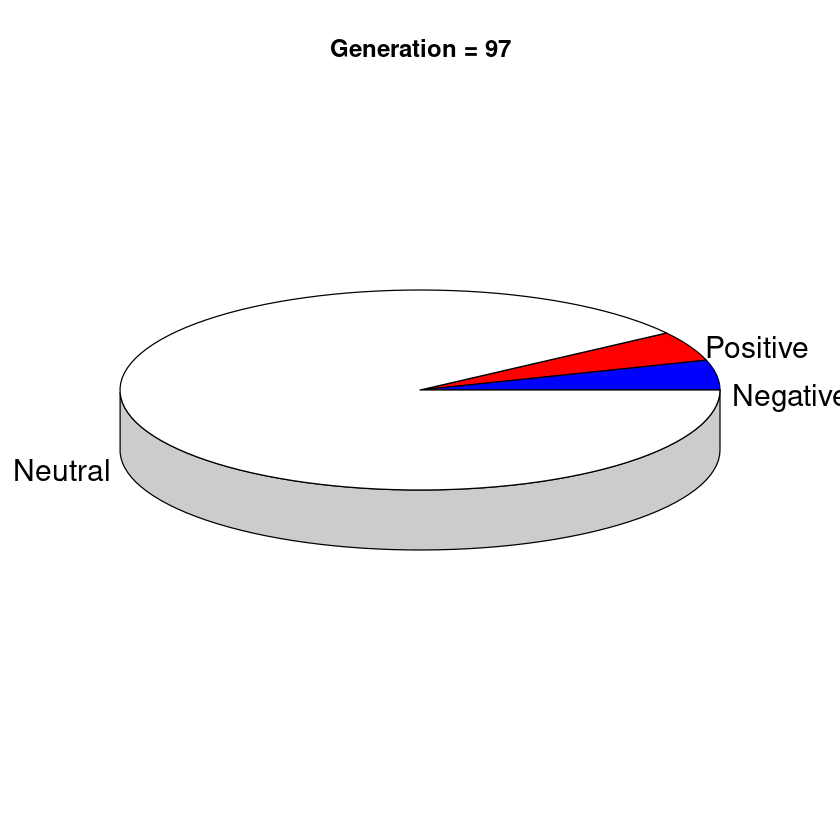

ERROR: Error in if (!is.numeric(x) || any(x < 0)) stop("pie3D: x values must be positive numbers"): missing value where TRUE/FALSE needed


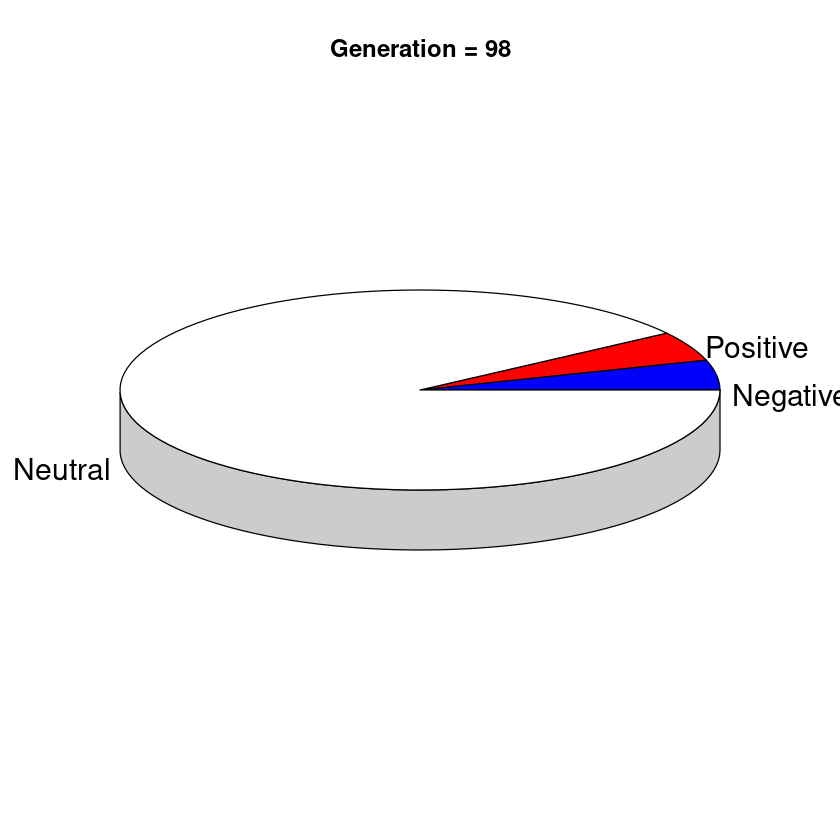

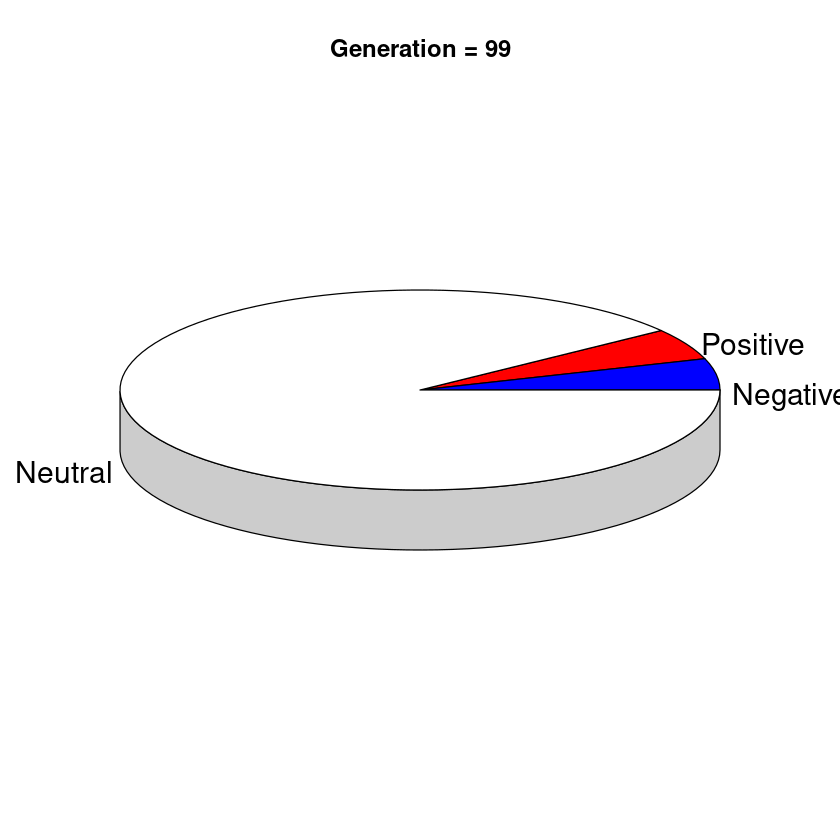

In [149]:
for (i in 1:length(Perc_neg)){
     
    fractions<- c(Perc_neg[i], Perc_neg[i], Perc_neu[i])
    lab <- c("Negative", "Positive", "Neutral")
 
    # Plot the chart.
    pie3D(x = fractions, col = c("blue", "red", "white"), labels = lab, main=paste("Generation =", as.character(i)), cex.lab=1.5 )
      
}

In [144]:
jpeg("./Theory_figures/Fractions_pichart_movie/foo%02d.jpg")
for (i in 1:99) {
    
    fractions<- c(Perc_neg[i], Perc_pos[i], Perc_neu[i])
    lab <- c("Negative", "Positive", "Neutral")
 
    # Plot the chart.
    pie3D(x = fractions, col = c("blue", "red", "white"), labels = lab, , main=paste("Generation =", as.character(i)), cex.lab=1.5)
      
}
dev.off()

png 
  2

In [161]:
setwd("~/Dropbox/Collaborations/Nobu_UBC/")


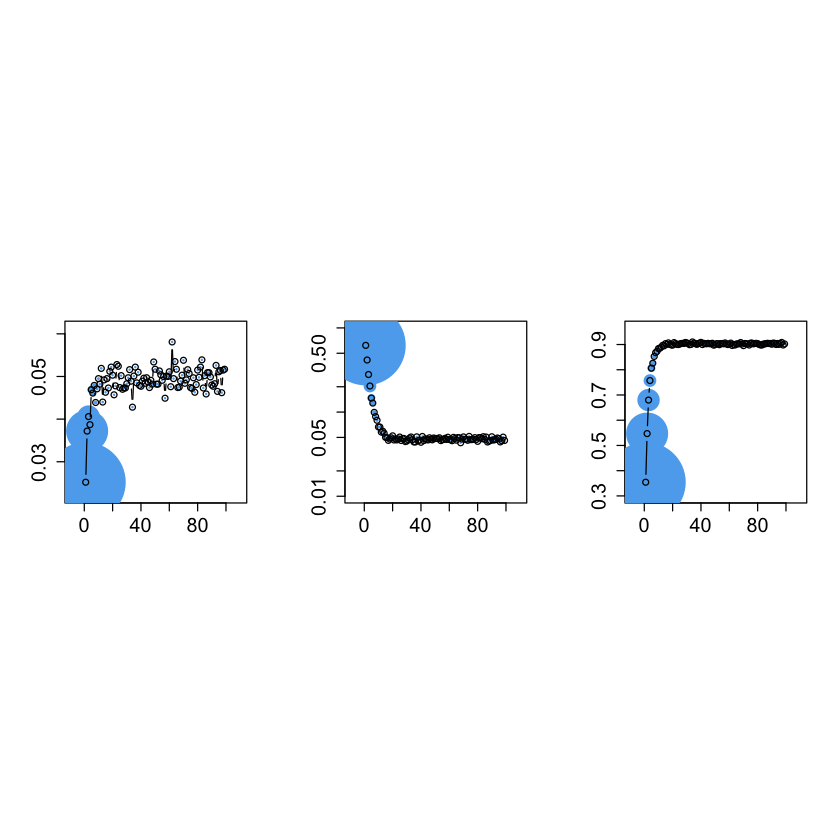

In [117]:
par(mfrow = c(1,3), pty="s")
#pdf("./Theory_figures/Perc_pos_vs_generation.pdf")
### Positive
dfx = data.frame(ev1=1:length(Perc_pos), ev2=Perc_pos, ev3=avg)
with(dfx, symbols(x=ev1, y=ev2, circles=ev3, inches=1/3,
                  ann=F, bg="steelblue2", fg=NULL, cex.axis=1.5, xlab="Generation", ylab="Fraction of positive mutations"))
lines(Perc_pos, type="b")
#dev.off()



#pdf("./Theory_figures/Perc_neg_vs_generation.pdf")
## Negative
dfx = data.frame(ev1=1:length(Perc_neg), ev2=Perc_neg, ev3=avg)
with(dfx, symbols(x=ev1, y=ev2, circles=ev3, inches=1/3,
                  ann=F, bg="steelblue2", fg=NULL, ylim=c(0.01,1), log="y", cex.axis=1.5, xlab="Generation", ylab="Fraction of negative mutations") )
lines(Perc_neg, type="b")
#dev.off()

#pdf("./Theory_figures/Perc_neu_vs_generation.pdf")
## Neutral
dfx = data.frame(ev1=1:length(Perc_neu), ev2=Perc_neu, ev3=avg)
with(dfx, symbols(x=ev1, y=ev2, circles=ev3, inches=1/3,
                  ann=F, bg="steelblue2", fg=NULL, cex.axis=1.5, xlab="Generation", ylab="Fraction of neutral mutations") )
lines(Perc_neu, type="b")
#dev.off()


## Fraction of beneficial and deleterious from fitness perspective 

In [73]:
library("ggplot2")
library("ggnewscale")

In [74]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [75]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [76]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [77]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [78]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

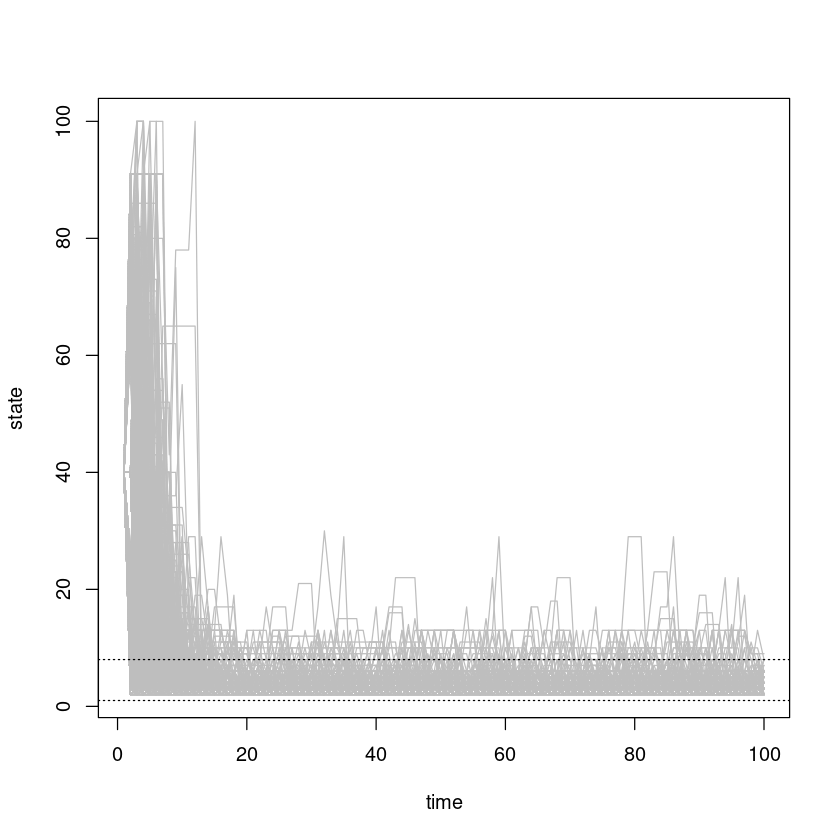

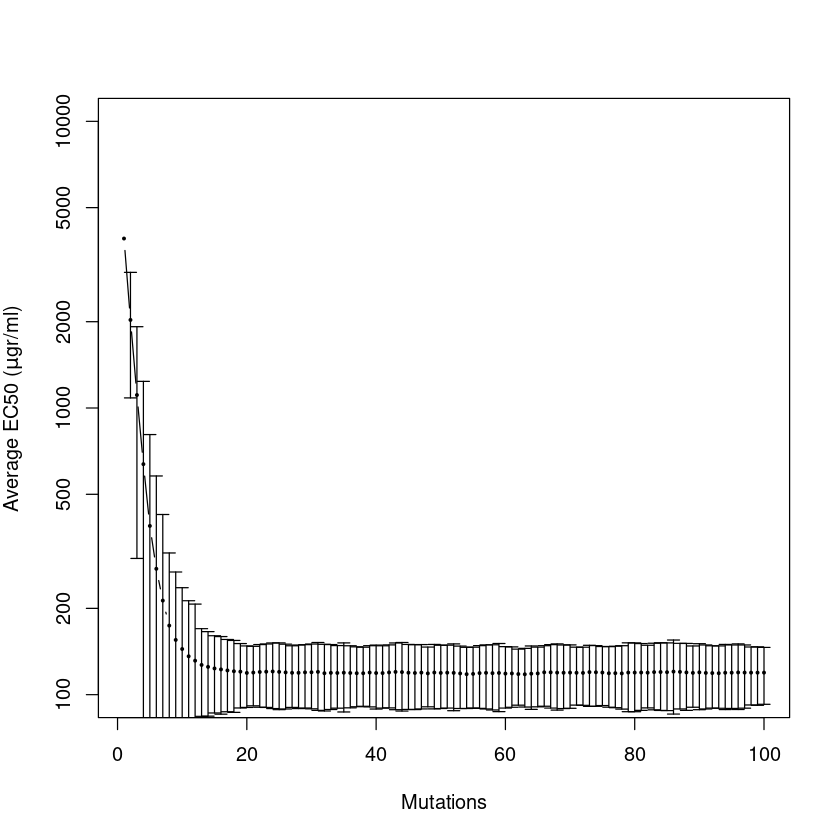

In [79]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [80]:
 Ns_calc_EC50 <- function(R_before, R_after, N){
    
  
     
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4
    
X_WT=R_before # Resistance level of WT
X_mut=R_after   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
  
# Selection coefficient
s= (Fitness_mut - Fitness_WT)/Fitness_WT
    return(N*s)
     
    
    }

In [81]:
Perc_pos=Perc_neg=Perc_neu=rep(NA, num.iterations)

for (i in 1:num.iterations-1){
    
    Spec=Ns_calc_EC50(R_before = chain.states[i,], R_after = chain.states[i+1,], N = 1e7)
    
    Perc_pos[i]=length(which(Spec > 1))/length(Spec)
    Perc_neg[i]=length(which(Spec < -1))/length(Spec)
    Perc_neu[i]=length(which((abs(Spec) <= 1)))/length(Spec)
   

  }  

In [82]:
Percentage_matrix=cbind(seq(1,100),Perc_pos, Perc_neg, Perc_neu)
colnames(Percentage_matrix)=c("Generation", "Beneficial", "Deleterious", "Neutral")

write.csv(Percentage_matrix, "./Theory_figures_for_Ayse_SvgFormat/Percentage_PopGen.csv", row.names=FALSE)

ERROR: Error in file(file, ifelse(append, "a", "w")): cannot open the connection


In [ ]:
library("plotrix")

In [ ]:
for (i in 1:length(Perc_neg)){
     
    fractions<- c(Perc_neg[i], Perc_neg[i], Perc_neu[i])
    lab <- c("Negative", "Positive", "Neutral")
 
    # Plot the chart.
    pie3D(x = fractions, col = c("blue", "red", "white"), labels = lab, main=paste("Generation =", as.character(i)), cex.lab=1.5 )
      
}

In [83]:
options(warn = -1)

Perc <- data.frame(Perc_pos, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_pos, avg))+ geom_point(aes(size=col))+
      xlim(0, 0.1)+ ylim(0,4000)+
  scale_colour_gradientn(colours = c("#1874CD", "darkblue"))+
    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of positive mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}

svg("./For_Ayse_SvgFormat/November_4th/point_6_EC50_vs_pos_mutations.svg")
print(b)
dev.off()



png 
  2

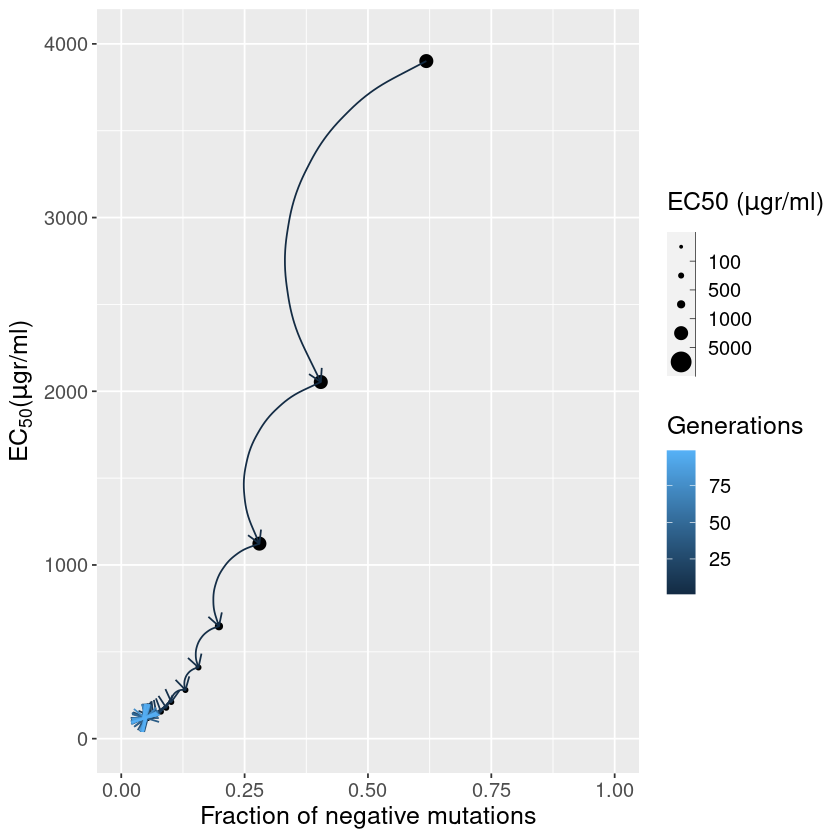

In [131]:
options(warn = -1)

Perc <- data.frame(Perc_neg, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_neg, avg))+ geom_point(aes(size=col))+
      xlim(0, 1)+ ylim(0,4000)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of negative mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_neg[i], x2 = Perc_neg[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}


#pdf("./Theory_figures/EC50_vs_neg_mutations.pdf")
print(b)
#dev.off()



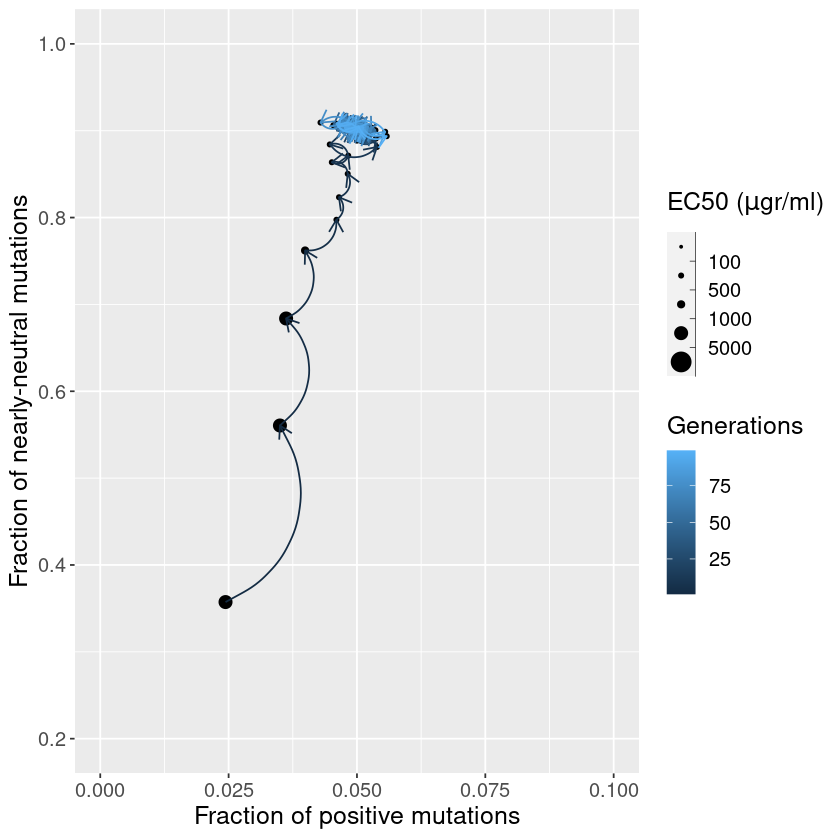

In [132]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neu, col=round(avg));

b <- ggplot(Perc, aes(Perc_pos, Perc_neu))+ geom_point(aes(size=col))+
      xlim(0, 0.1)+ylim(0.2,1)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of positive mutations", y = "Fraction of nearly-neutral mutations")+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neu[i], y2 = Perc_neu[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}

#pdf("./Theory_figures/Fraction_NN_vs_POS_mutations.pdf")
print(b)
#dev.off()



In [105]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neg, col_point=avg);

b <- ggplot(Perc, aes(Perc_pos, Perc_neg))+ geom_point(aes(colour=col_point, size=3))+
      xlim(0, 0.1)+ylim(0,0.75)+
    scale_colour_gradientn(colours = c("yellow", "darkred"))+
    labs( col=expression(paste("EC50 (", mu, "gr/ml)")), x ="Fraction of positive mutations", y = "Fraction of negative mutations")+
    theme(text = element_text(size = 15))

limit=length(Perc_neg)-1;


b <- b + new_scale_colour()  


for (i in 1:limit){

# start a new scale

df <- data.frame(col_curve=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neg[i], y2 = Perc_neg[i+1]);

b <- b + 
    geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col_curve), 
               data = df, arrow = arrow(length=unit(0.20,"cm")))
    
}

b <- b + labs(colour = "Generations")


pdf("./Theory_figures/Fraction_NEG_vs_POS_fitness_perspective.pdf")
print(b)
dev.off()



png 
  2

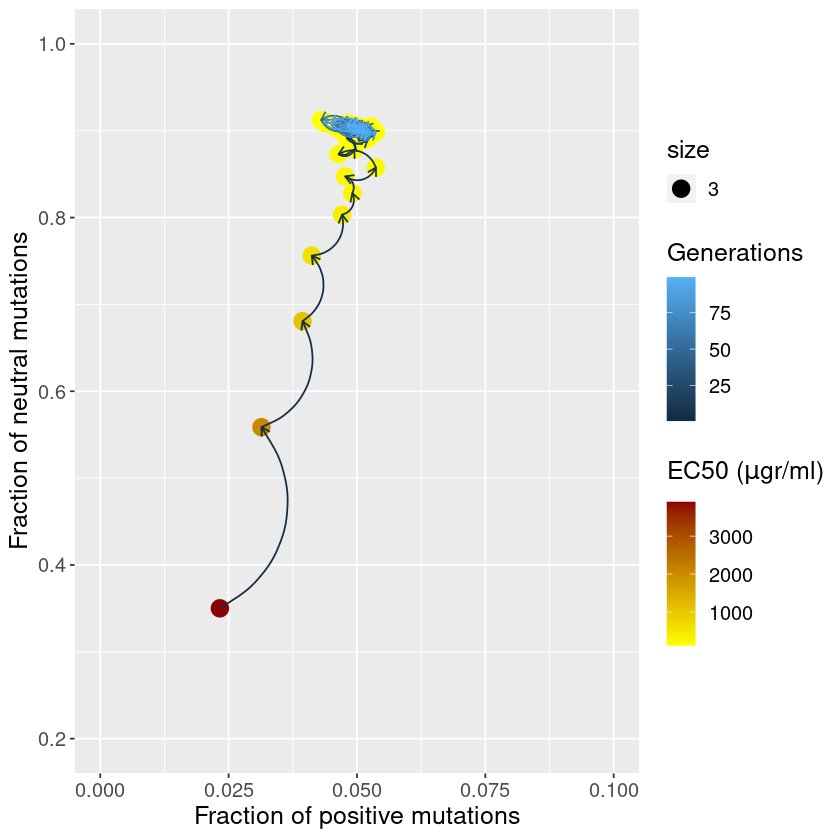

In [107]:
options(warn = -1)

Perc <- data.frame(Perc_pos, Perc_neu, col_point=avg);

b <- ggplot(Perc, aes(Perc_pos, Perc_neu))+ geom_point(aes(colour=col_point, size=3))+
      xlim(0, 0.1)+ylim(0.2,1)+
    scale_colour_gradientn(colours = c("yellow", "darkred"))+
    labs( col=expression(paste("EC50 (", mu, "gr/ml)")), x ="Fraction of positive mutations", y = "Fraction of neutral mutations")+
    theme(text = element_text(size = 15))

limit=length(Perc_neu)-1;


b <- b + new_scale_colour()  


for (i in 1:limit){

# start a new scale

df <- data.frame(col_curve=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = Perc_neu[i], y2 = Perc_neu[i+1]);

b <- b + 
    geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col_curve), 
               data = df, arrow = arrow(length=unit(0.20,"cm")))
    
}

b <- b + labs(colour = "Generations")


#pdf("./Theory_figures/Fraction_NN_vs_POS_mutations_two_colors.pdf")
print(b)
#dev.off()



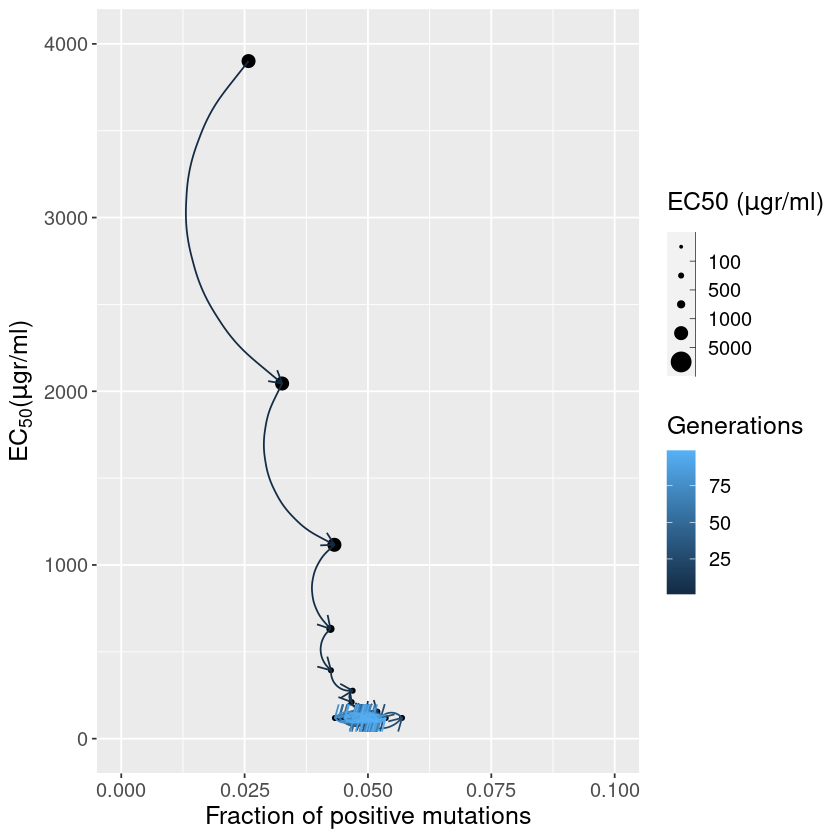

In [16]:
options(warn = -1)

Perc <- data.frame(Perc_pos, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_pos, avg))+ geom_point(aes(size=col))+
      xlim(0, 0.1)+ ylim(0,4000)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of positive mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}

#pdf("./Theory_figures/EC50_vs_pos_mutations.pdf")
print(b)
#dev.off()



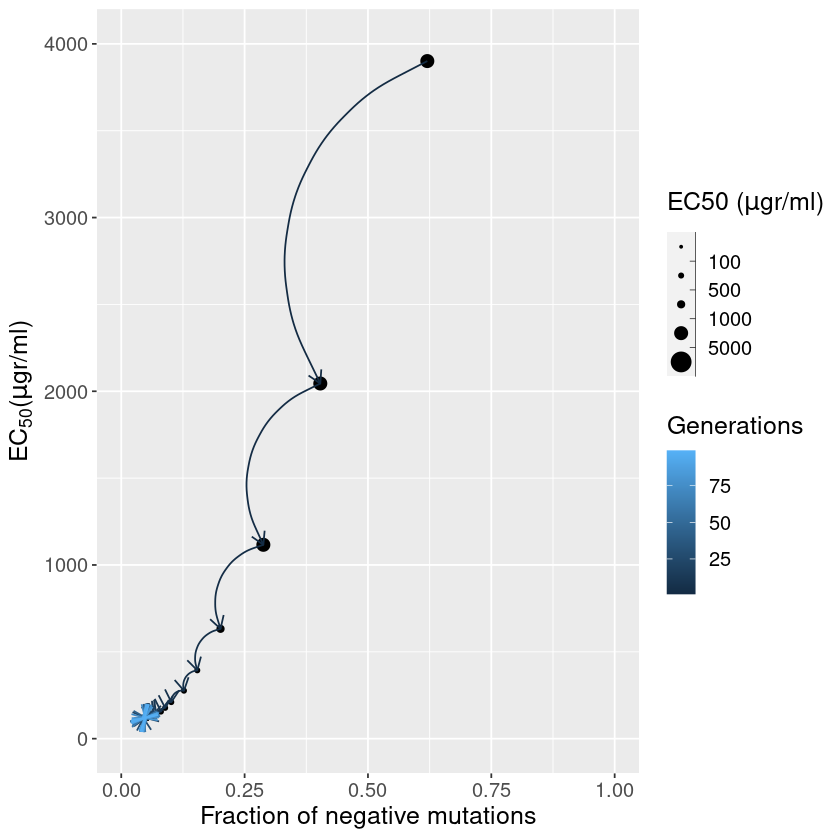

In [13]:
options(warn = -1)

Perc <- data.frame(Perc_neg, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_neg, avg))+ geom_point(aes(size=col))+
      xlim(0, 1)+ ylim(0,4000)+

    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of negative mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_neg[i], x2 = Perc_neg[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}


#pdf("./Theory_figures/EC50_vs_neg_mutations.pdf")
print(b)
#dev.off()



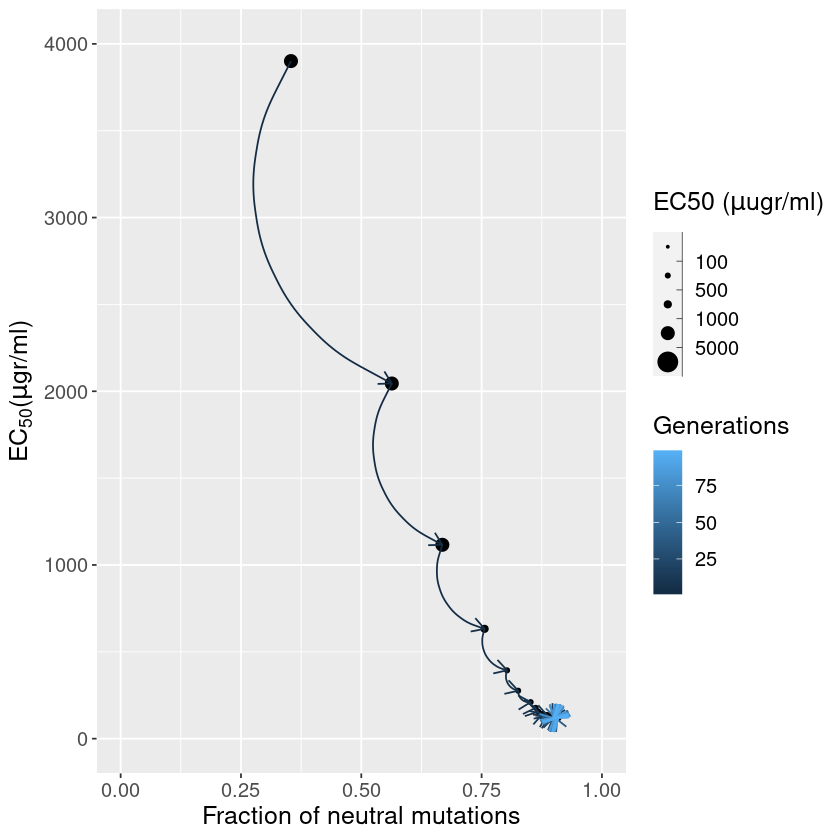

In [14]:
options(warn = -1)

Perc <- data.frame(Perc_neu, avg, col=round(avg));

b <- ggplot(Perc, aes(Perc_neu, avg))+ geom_point(aes(size=col))+
      xlim(0, 1)+ ylim(0,4000)+

    labs(size= expression(paste("EC50 (", mu, "ugr/ml)")), 
       col="Generations", x ="Fraction of neutral mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_neu[i], x2 = Perc_neu[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}


#pdf("./Theory_figures/EC50_vs_neutral_mutations.pdf")
print(b)
#dev.off()



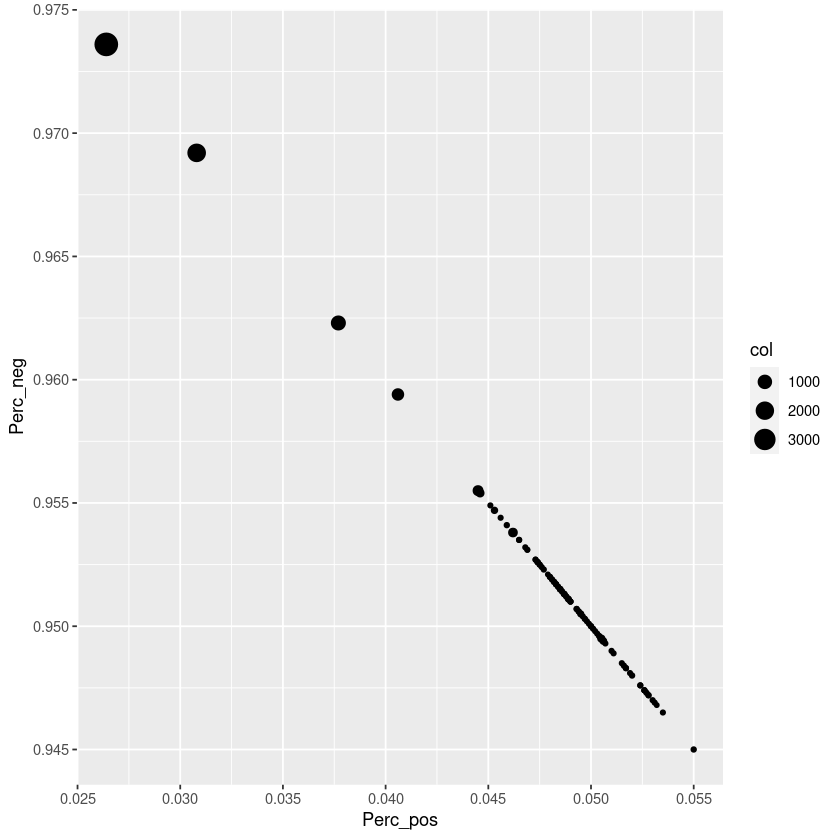

In [35]:
ggplot(Perc, aes(Perc_pos, Perc_neg))+ geom_point(aes(size=col))

## Show the change in fraction by Pie Charts

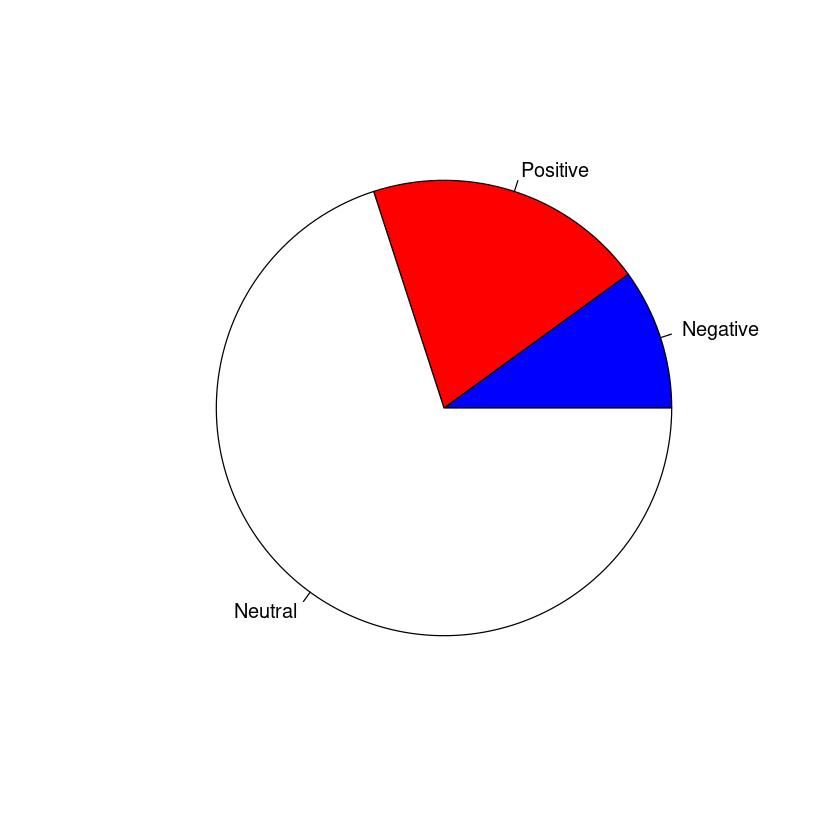

In [92]:
# Create data for the graph.

fractions<- c(0.1, 0.2, 0.7)
labels <- c("Negative", "Positive", "Neutral")
 
# Plot the chart.
pie(fractions, labels, col = c("blue", "red", "white"))

In [119]:
Perc_pos=Perc_neg=Perc_neu=rep(NA, num.iterations)

for (i in 1:num.iterations-1){
    
    Spec=Ns_calc_EC50(R_before = chain.states[i,], R_after = chain.states[i+1,], N = 1e7)
    
    Perc_pos[i]=length(which(Spec > 0))/length(Spec)
    Perc_neg[i]=length(which(Spec < 0))/length(Spec)
    Perc_neu[i]=length(which((Spec == 0)))/length(Spec)
   

  }  

In [120]:
library("plotrix")

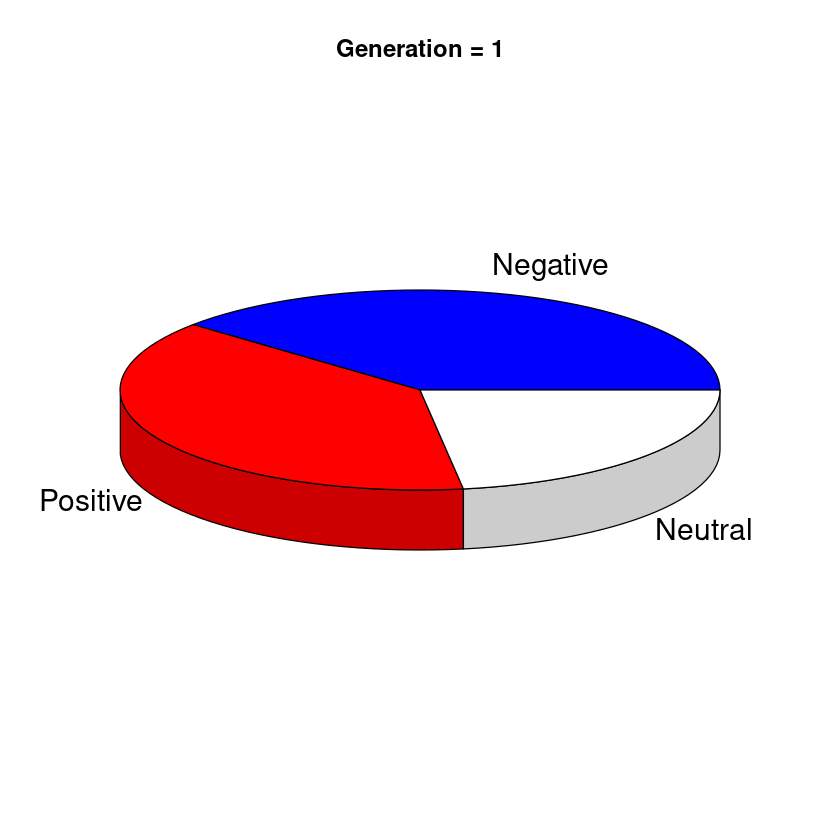

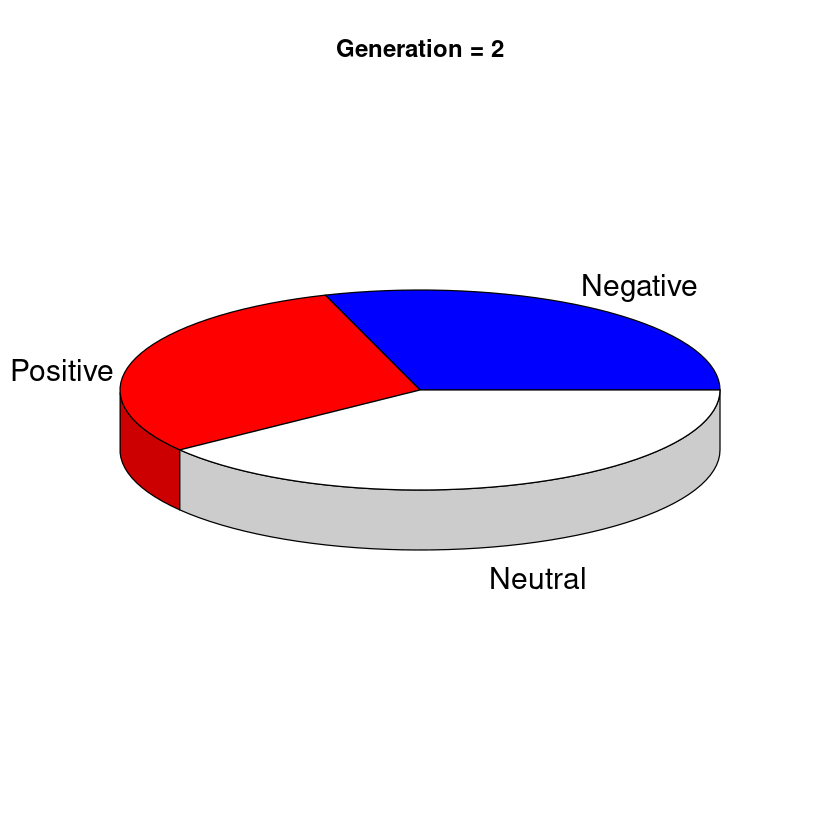

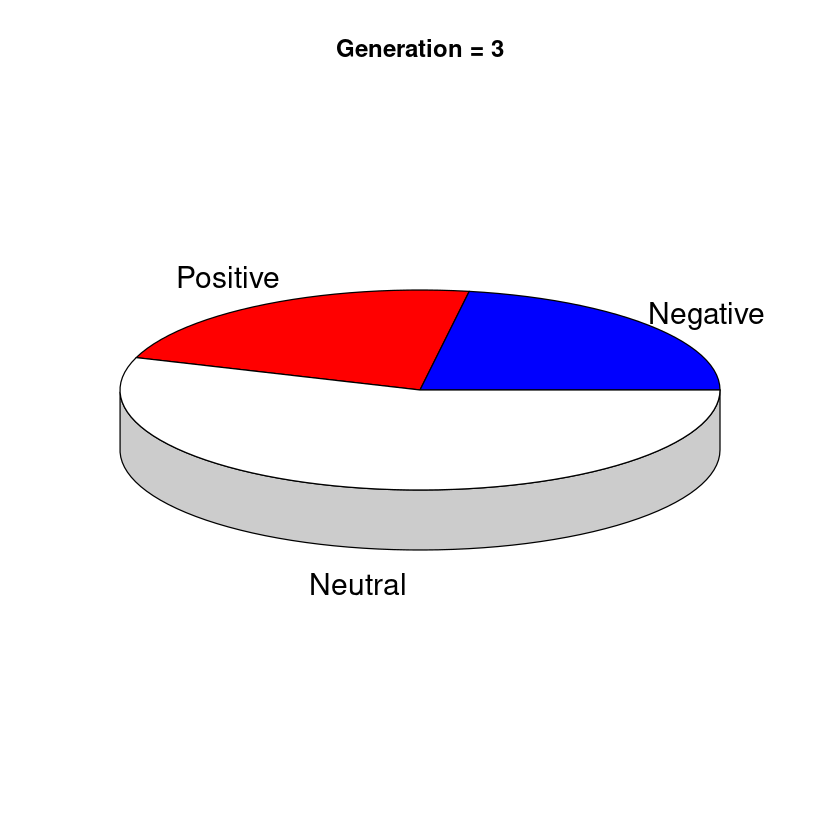

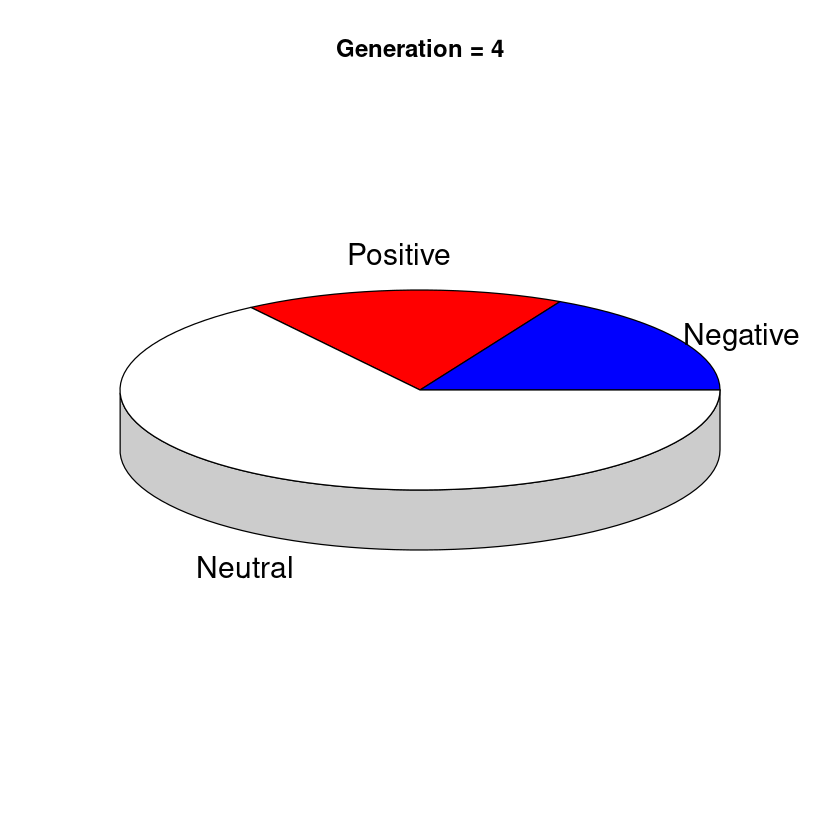

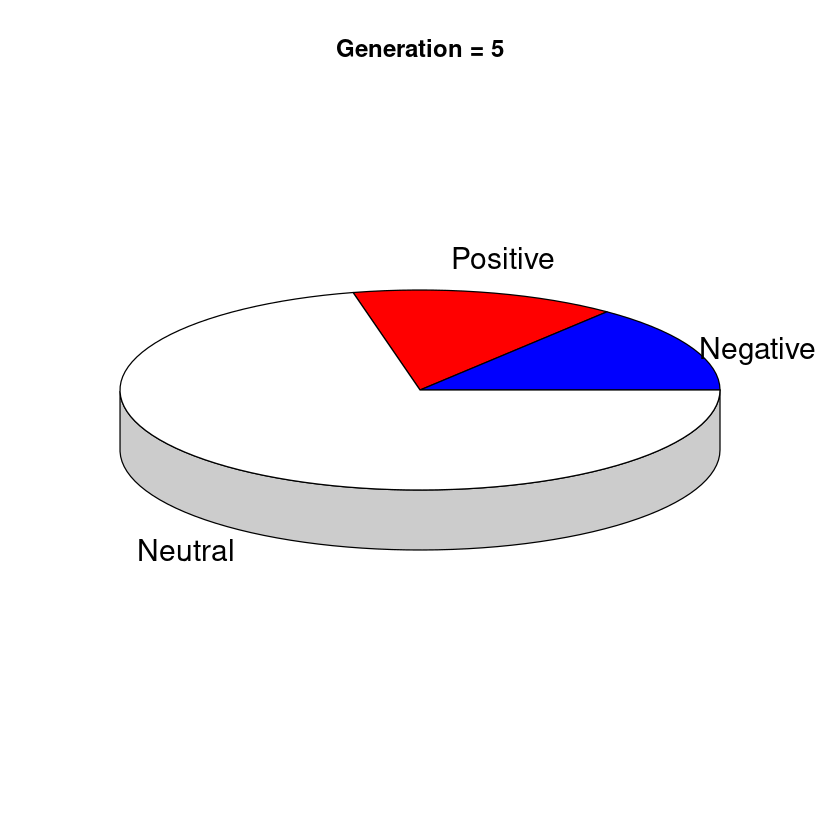

...

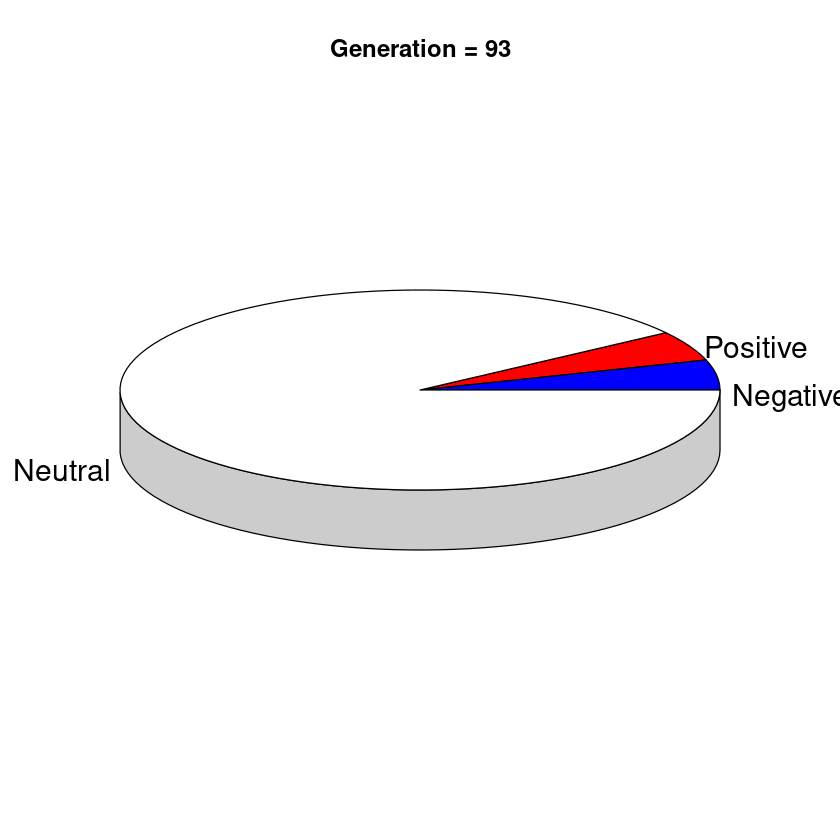

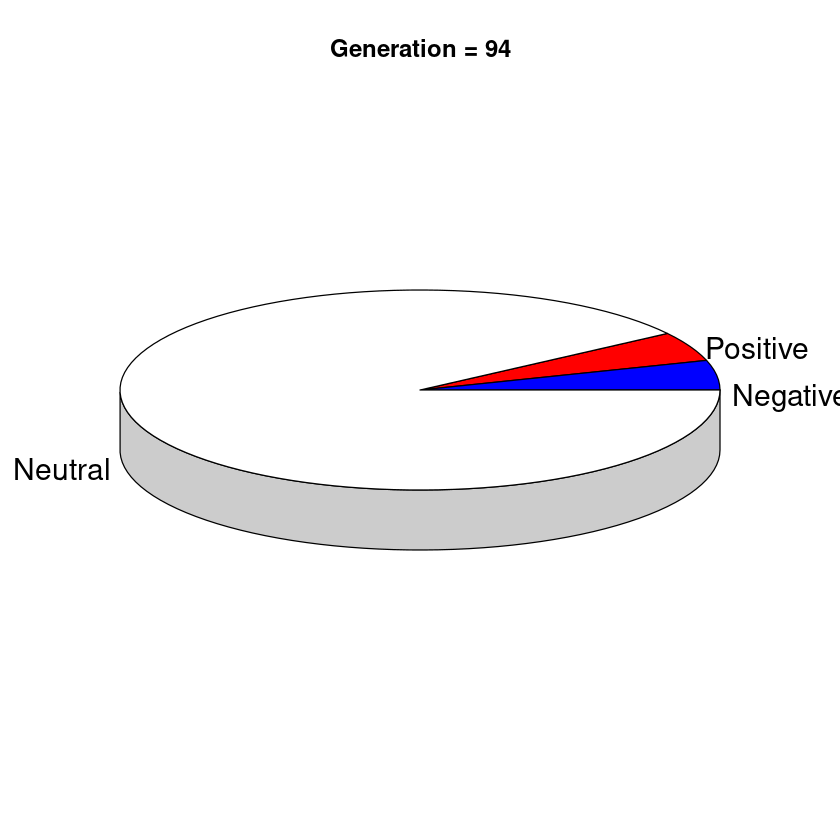

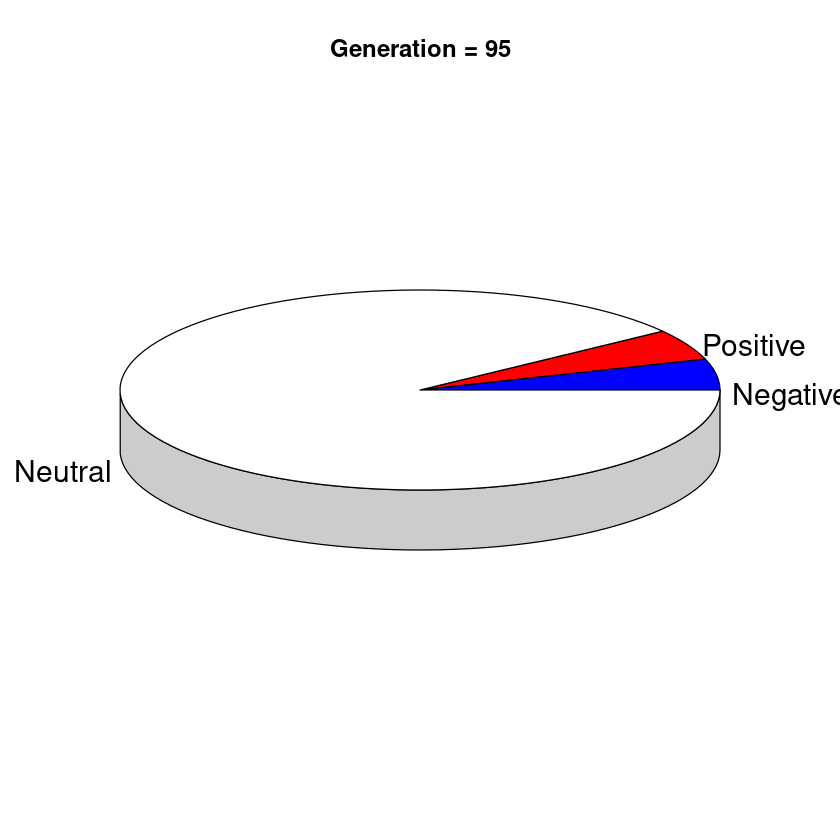

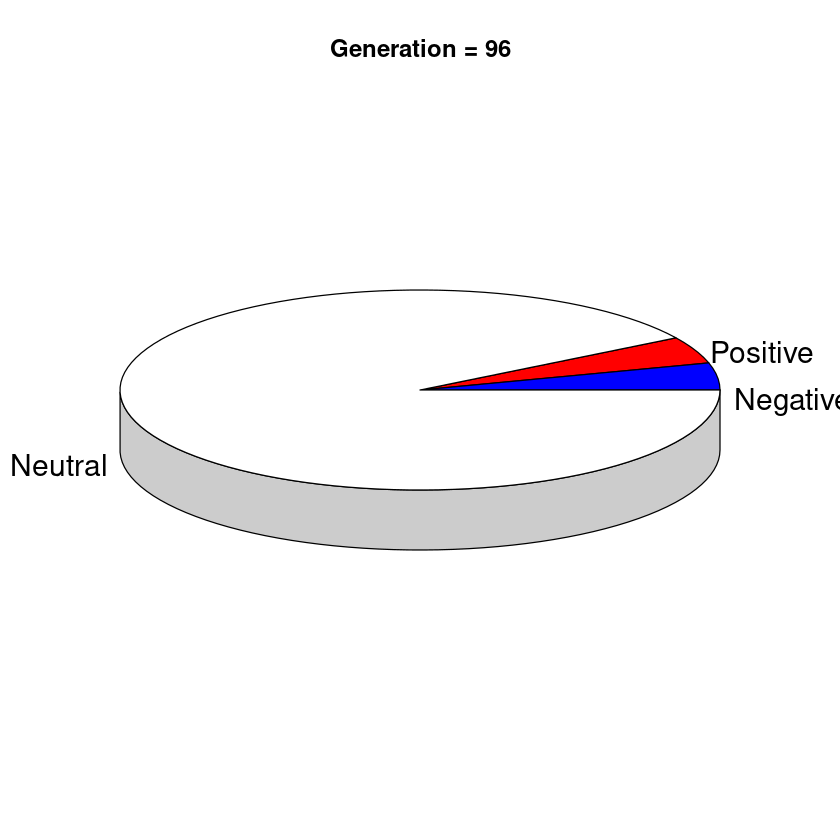

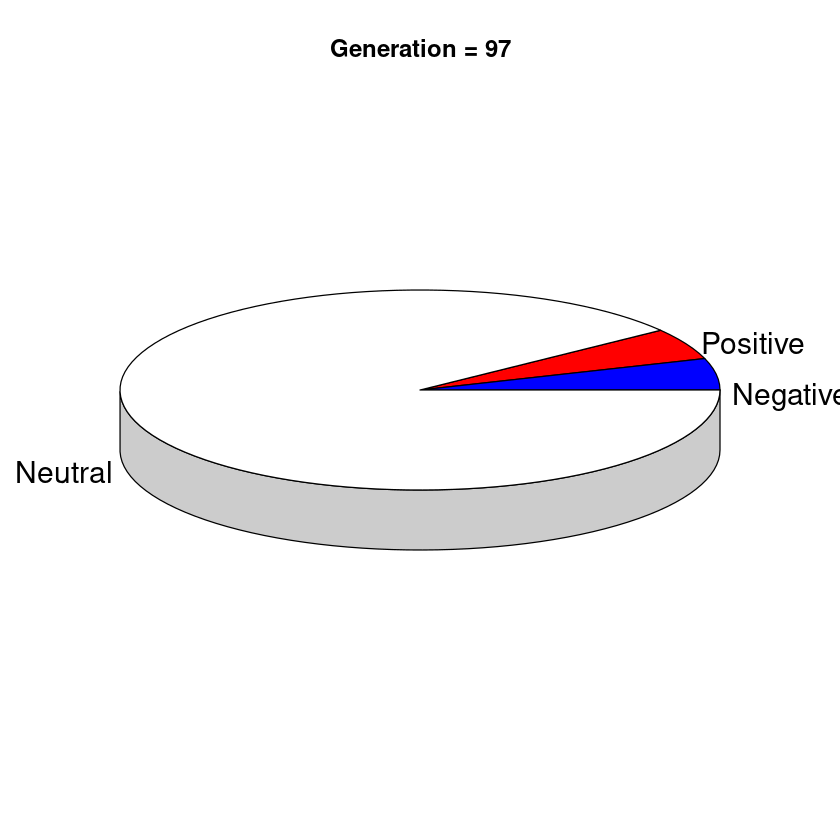

ERROR: Error in if (!is.numeric(x) || any(x < 0)) stop("pie3D: x values must be positive numbers"): missing value where TRUE/FALSE needed


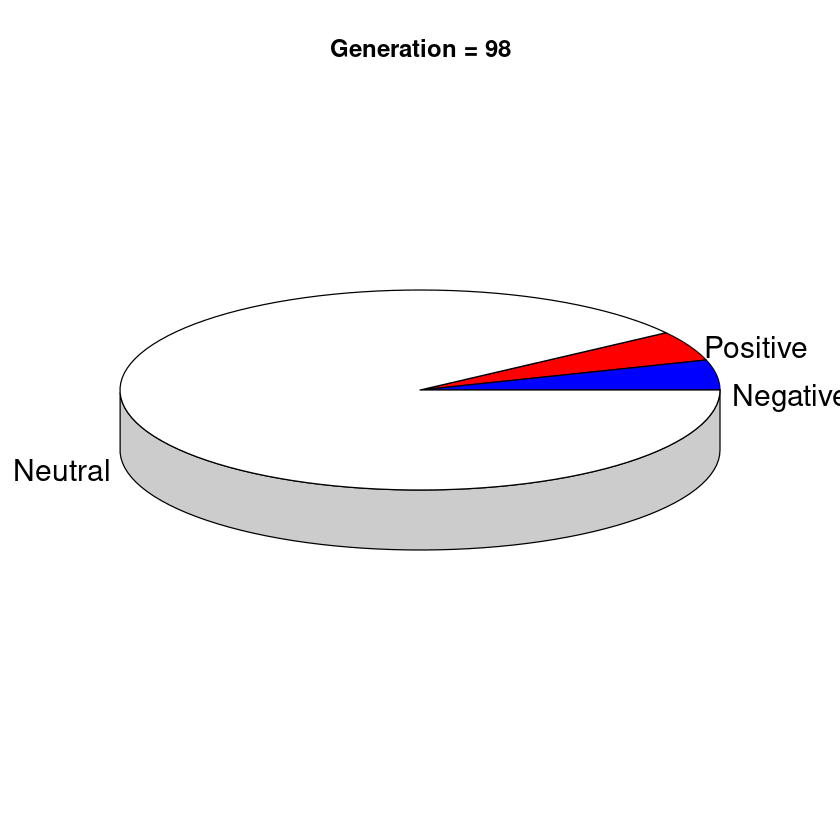

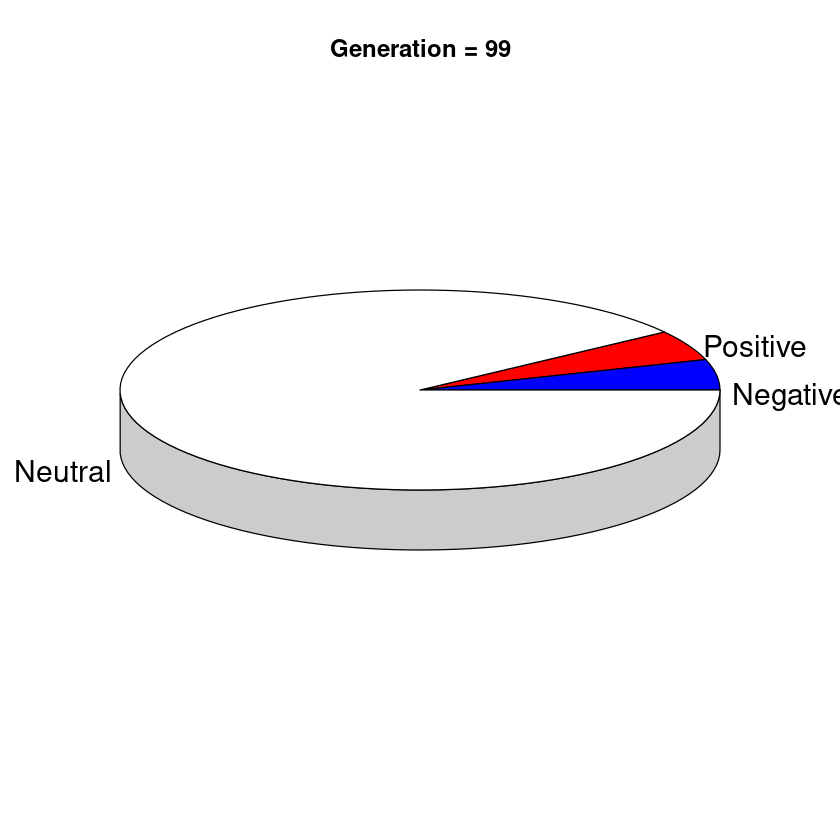

In [142]:
for (i in 1:length(Perc_neg)){
     
    fractions<- c(Perc_neg[i], Perc_neg[i], Perc_neu[i])
    lab <- c("Negative", "Positive", "Neutral")
 
    # Plot the chart.
    pie3D(x = fractions, col = c("blue", "red", "white"), labels = lab, main=paste("Generation =", as.character(i)), cex.lab=1.5 )
      
}

In [144]:
jpeg("./Theory_figures/Fractions_pichart_movie/foo%02d.jpg")
for (i in 1:99) {
    
    fractions<- c(Perc_neg[i], Perc_pos[i], Perc_neu[i])
    lab <- c("Negative", "Positive", "Neutral")
 
    # Plot the chart.
    pie3D(x = fractions, col = c("blue", "red", "white"), labels = lab, , main=paste("Generation =", as.character(i)), cex.lab=1.5)
      
}
dev.off()

png 
  2

### Tracking single trajectories

In [10]:
library("ggplot2")

In [11]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [12]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [13]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [14]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [15]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

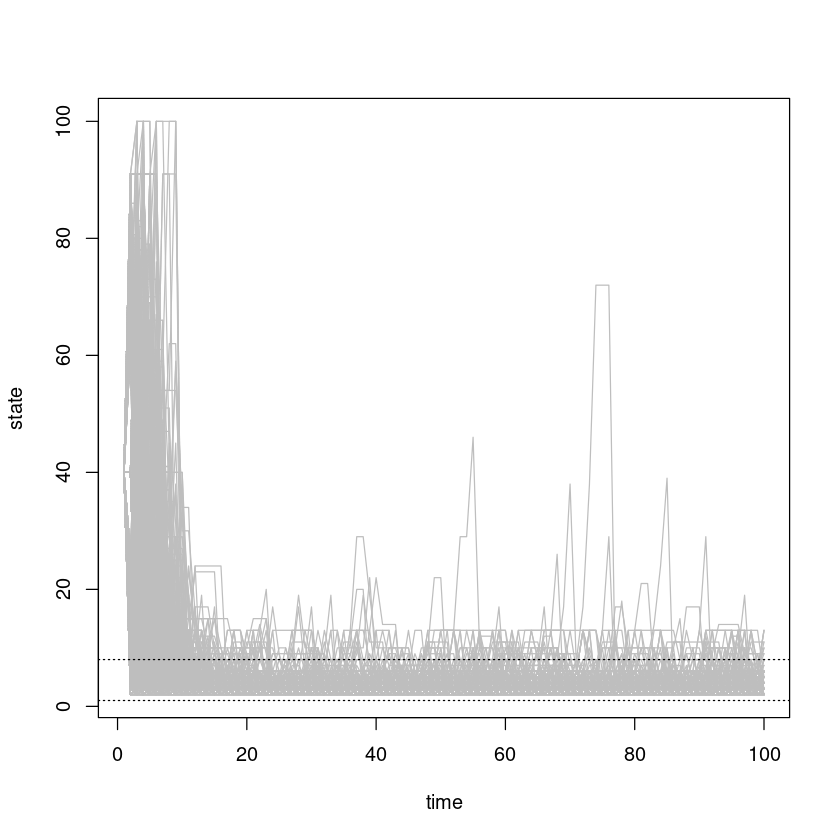

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


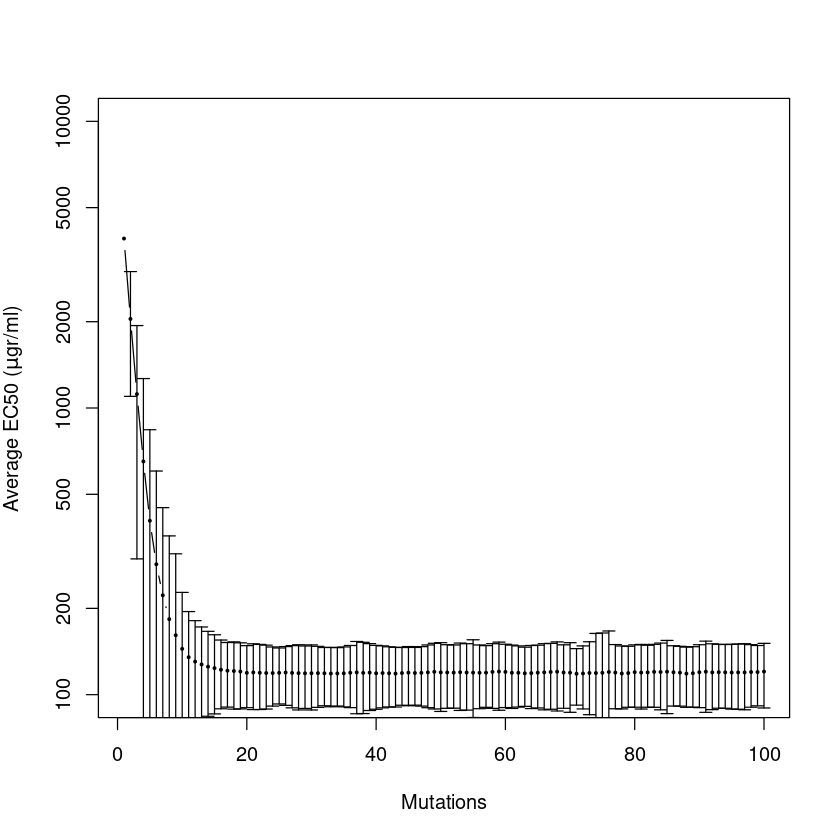

In [16]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [17]:
State2Res = function (a){
    R=seq(1,10000, 100) 
    return(R[a])
    }

In [18]:
chain.states_R=apply(chain.states, 2, FUN = State2Res)


pdf("./Theory_figures_for_Ayse_SvgFormat/EC50_individual_log.pdf")
matplot(chain.states_R, type='l', col="gray", lty=1, ylab=expression(paste("EC50 (", mu,"gr/ml)", sep="")), xlab='Generation', cex.lab=1.5, cex.axis=1.5, log="y")
dev.off()


pdf("./Theory_figures_for_Ayse_SvgFormat/EC50_individual_linear.pdf")
matplot(chain.states_R, type='l', col="gray", lty=1, ylab=expression(paste("EC50 (", mu,"gr/ml)", sep="")), xlab='Generation', cex.lab=1.5, cex.axis=1.5)
dev.off()



png 
  2

png 
  2

In [19]:
colnames(chain.states_R)=paste("variant_", as.character(seq(1,10000)), sep="")
rownames(chain.states_R)=paste("generation_", as.character(seq(1,100)), sep="")

In [21]:
log2(chain.states_R)

,variant_1,variant_2,variant_3,variant_4,variant_5,variant_6,variant_7,variant_8,variant_9,variant_10,⋯,variant_9991,variant_9992,variant_9993,variant_9994,variant_9995,variant_9996,variant_9997,variant_9998,variant_9999,variant_10000
generation_1,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,⋯,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628,11.929628
generation_2,11.929628,6.658211,11.929628,11.929628,11.929628,6.658211,6.658211,6.658211,8.647458,10.966505,⋯,11.929628,6.658211,11.929628,9.815383,10.230020,7.651052,8.968667,11.929628,6.658211,11.036860
generation_3,6.658211,6.658211,11.929628,11.929628,6.658211,6.658211,6.658211,6.658211,8.647458,6.658211,⋯,11.929628,6.658211,11.929628,6.658211,10.230020,7.651052,8.233620,11.929628,6.658211,11.036860
generation_4,6.658211,6.658211,11.929628,10.345405,6.658211,6.658211,7.651052,6.658211,8.647458,6.658211,⋯,10.966505,6.658211,7.651052,6.658211,10.230020,7.651052,8.233620,6.658211,6.658211,11.036860
generation_5,6.658211,6.658211,11.929628,9.453271,6.658211,6.658211,6.658211,6.658211,8.647458,6.658211,⋯,10.230020,7.651052,7.651052,6.658211,10.230020,6.658211,8.233620,6.658211,6.658211,9.967226
generation_6,6.658211,6.658211,9.645658,9.453271,6.658211,6.658211,6.658211,6.658211,6.658211,6.658211,⋯,10.230020,6.658211,6.658211,6.658211,7.651052,6.658211,7.651052,7.651052,7.651052,9.967226
generation_7,6.658211,6.658211,10.814582,9.453271,6.658211,7.651052,6.658211,6.658211,6.658211,6.658211,⋯,10.230020,6.658211,6.658211,6.658211,6.658211,6.658211,7.651052,8.233620,6.658211,9.967226
generation_8,6.658211,7.651052,10.104599,9.453271,6.658211,7.651052,6.658211,6.658211,7.651052,6.658211,⋯,10.230020,6.658211,6.658211,6.658211,6.658211,6.658211,8.233620,7.651052,6.658211,9.967226
generation_9,6.658211,7.651052,10.104599,7.651052,6.658211,7.651052,6.658211,6.658211,7.651052,6.658211,⋯,9.231221,6.658211,6.658211,6.658211,6.658211,6.658211,8.233620,6.658211,6.658211,9.967226
generation_10,6.658211,7.651052,10.104599,7.651052,6.658211,6.658211,6.658211,6.658211,7.651052,6.658211,⋯,9.231221,6.658211,6.658211,6.658211,6.658211,6.658211,9.231221,6.658211,6.658211,11.168045


In [22]:
saveRDS(log2(chain.states_R), "./Theory_figures_for_Ayse_SvgFormat/EC50_values_individuals_T10_log2.RDS")
write.csv(log2(chain.states_R[,1:1000]), "./Theory_figures_for_Ayse_SvgFormat/EC50_values_individuals_T10_1000variants_log2.csv")

## Modeling the adaptive trajectory

In [215]:
EC50_adaptive=c(100, 4900, 8200, 14000, 11000)
n_adaptive=c(0, 3, 6, 9, 18)
SD_adaptive=c(0, 600, 0, 1000, 800)

Adaptive_walk=cbind(n_adaptive, EC50_adaptive, SD_adaptive)
colnames(Adaptive_walk)=c("mutations", "EC50", "SD")
Adaptive_walk=as.data.frame(Adaptive_walk)

In [233]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(0,15000, 100) 
States=seq(1, length(R));

In [234]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [235]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [236]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=2000 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e5

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [237]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, y - sd/2, x, y + sd/2, length = 0.05, angle = 90, code = 3, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, y - sd/2, x, y + sd/2, length = 0.05, angle = 90, code = 3, :
“zero-length arrow is of indeterminate angle and so skipped”


png 
  2

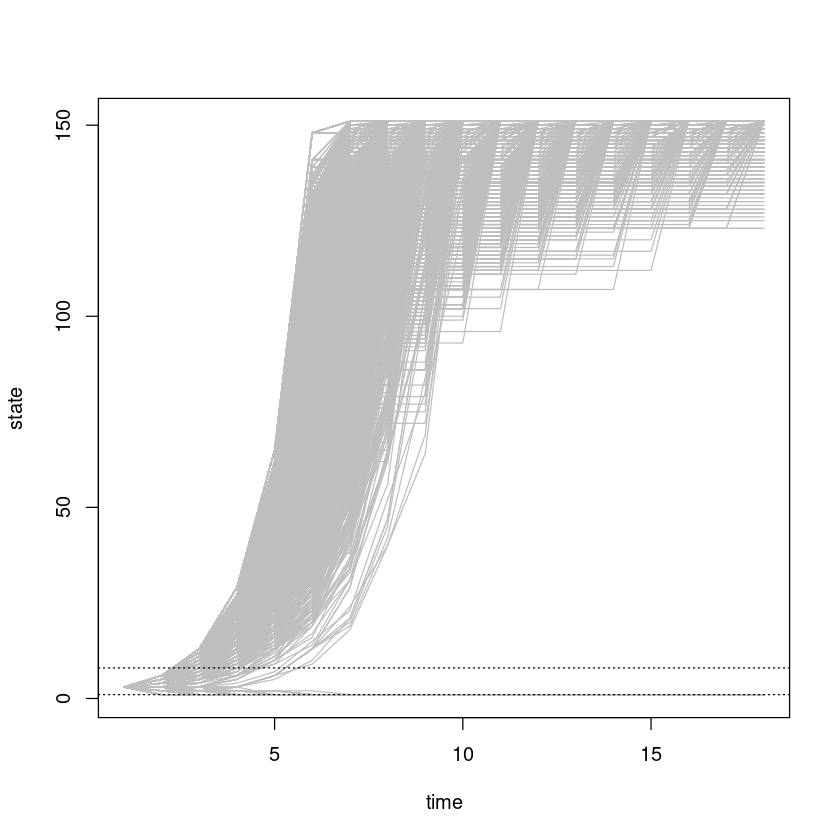

In [243]:
# Initial_point_1
init_EC50=100

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 18

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1
lower_bound=avg-sdev/2
#lower_bound[which(lower_bound <1)]=1

pdf("Adaptive_walk.pdf")
plot(x, avg, type="b", pch=19, cex=0.3, ylim=c(0,15000), xlab="Mutations",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()

x=Adaptive_walk$mutations
y=Adaptive_walk$EC50
sd=Adaptive_walk$SD


lines(Adaptive_walk$mutations, Adaptive_walk$EC50, type="b", lwd=2, col="red")
arrows(x, y-sd/2, x, y+sd/2, length=0.05, angle=90, code=3, col="red", lwd=4)
legend(10, 5000, legend=c("Experiment", "Theory"),   col=c("red", "black"), lty=1, cex=1.3, lwd=2)   

dev.off()



### Plot the fitness landscape with different [AMP]

In [10]:
X=seq(1,10000)

AMP_c=c(10,1000, 4000)
cols=c("gray","cyan", "#00BE67") 
pdf("./For_Ayse_SvgFormat/November_4th/point_1_Suppl-Fig5.pdf")

for (i in 1:3) {
    
AMP=AMP_c[i] ## Ampicillin Concentration
# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness=  1/(1+(X50/X)^5)


if (i==1){
    plot(X, Fitness, type="l", col=cols[i], lwd=4, xlab=expression(paste("[Amp] (", mu,"gr/ml)", sep="")))
    #abline( v=AMP_c[i])
    } else {
    lines(X, Fitness, col=cols[i], lwd=4)
     #abline( v=AMP_c[i])
    } 
}
dev.off()

png 
  2

### Linear function rather a threshold-like relationship

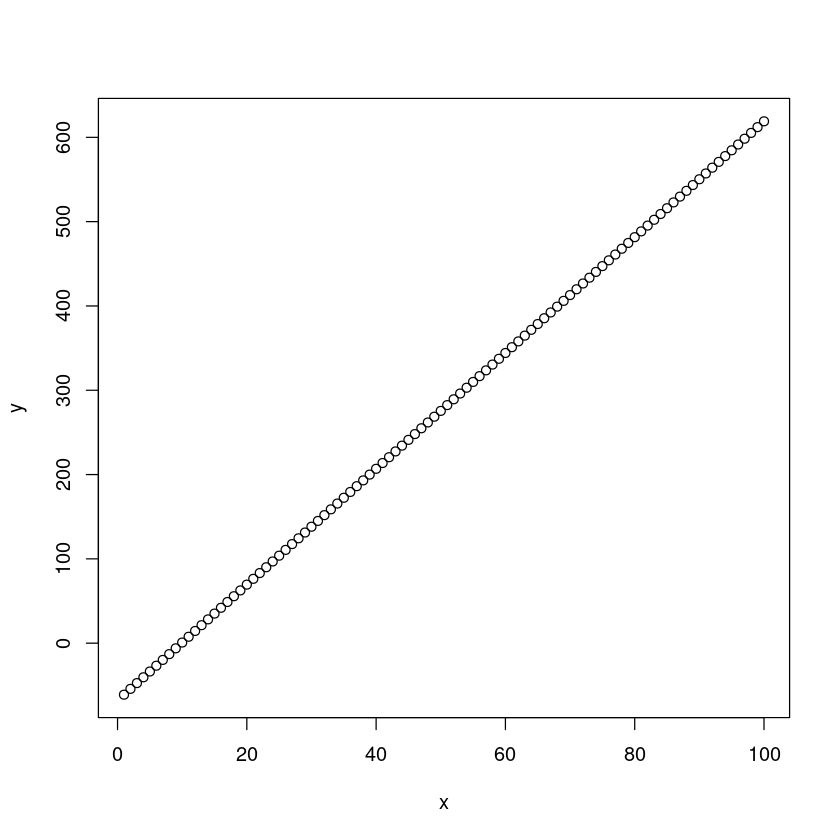

In [1]:
AMP=10
X=10
X50=0.93*AMP-1.29
n_hill=5

dfdx=(n_hill*(X/X50)^(n_hill-1))/(1+(X50/X)^n_hill)^2

x=seq(1,100)
y= (1/(1+(X50/X)^n_hill)) + (x-X)*dfdx

plot(x,y)

In [2]:
library("ggplot2")

In [3]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(100,10000, 100) 
States=seq(1, length(R));

In [4]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [5]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [6]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
 
dfdx_WT=(5*(AMP/X50)^(4))/(1+(X50/AMP)^5)^2
dfdx_mut=(5*(AMP/X50)^(4))/(1+(X50/AMP)^5)^2
    
Fitness_WT= (1/(1+(X50/AMP)^5)) + (X_WT-AMP)*dfdx_WT 
Fitness_mut= (1/(1+(X50/AMP)^5)) + (X_mut-AMP)*dfdx_mut 
#Fitness_mut[which(is.na(Fitness_mut))]=-4   

Fitness_WT=Fitness_WT/68624.8189016024  
Fitness_mut=Fitness_mut/68624.8189016024
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
#Fitness_WT=  1/(1+(X50/X_WT)^5)
#Fitness_mut= 1/(1+(X50/X_mut)^5) 
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [7]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

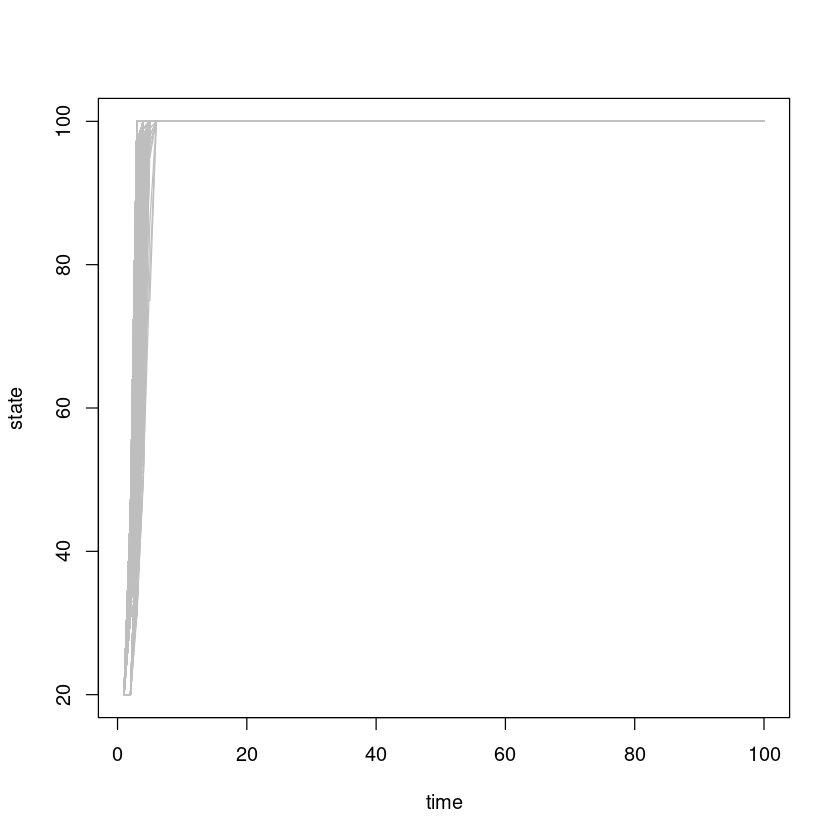

In [8]:
# Initial_point_1
init_EC50=2000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)

for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}

matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    
    }

x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1

lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1



In [9]:
pdf("./For_Ayse_SvgFormat/November_4th/point_2_linear_relationship_no_threshold-like.pdf")

plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="yx",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)

dev.off()


Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”
Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow

png 
  2

### Variation of population size

In [68]:
library("ggplot2")

In [69]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [70]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [71]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [72]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=90

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= (Fitness_mut - Fitness_WT)/(Fitness_WT)
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [73]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

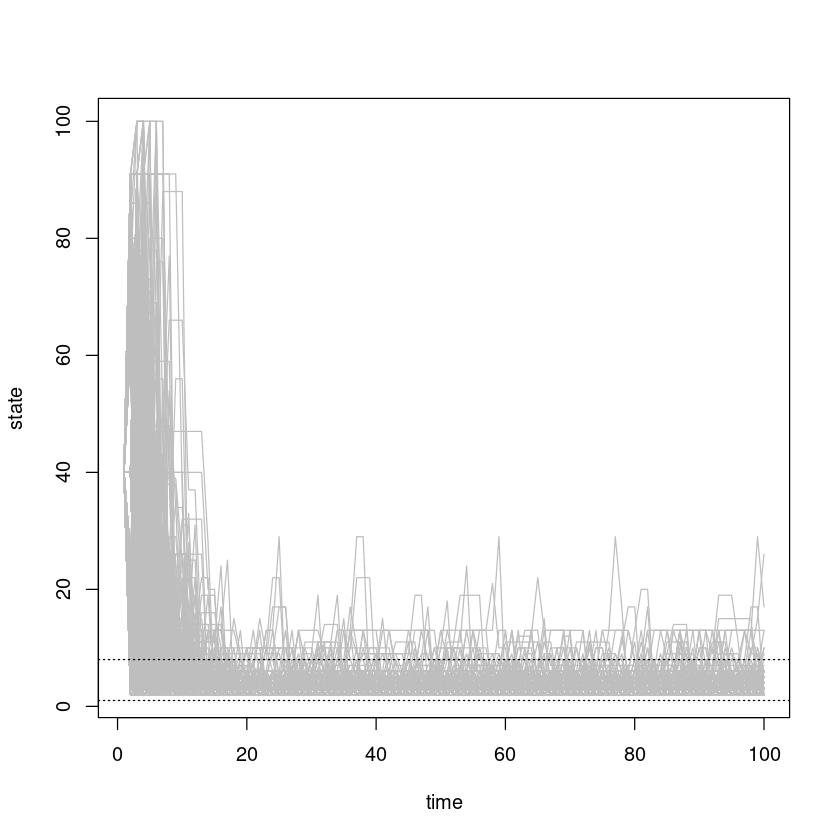

Warning message in arrows(x, lower_bound, x, avg + sdev/2, length = 0.05, angle = 90, :
“zero-length arrow is of indeterminate angle and so skipped”


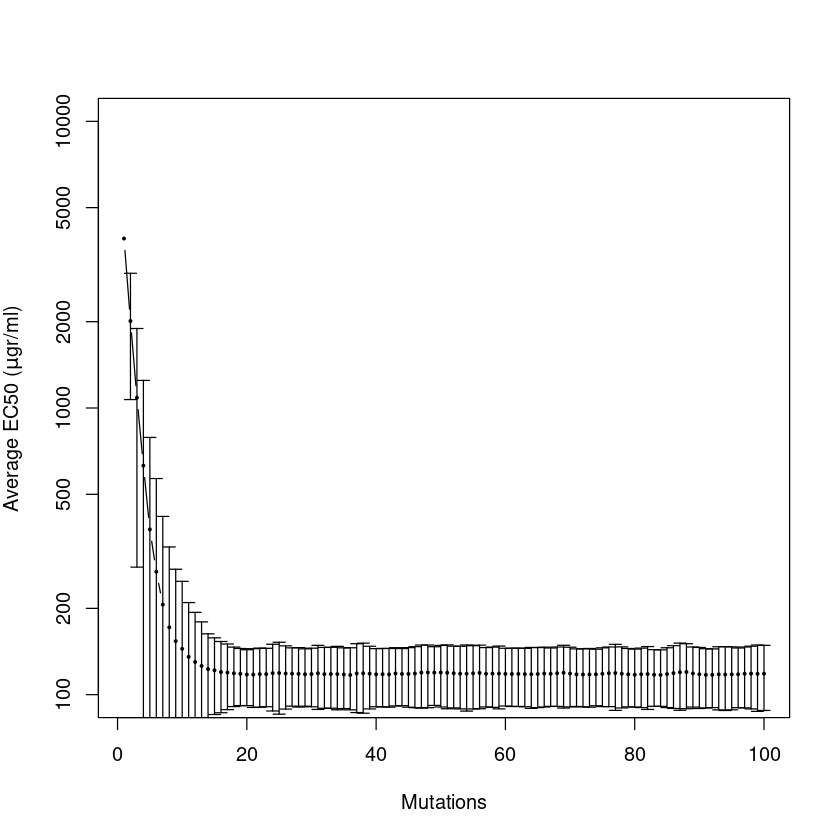

In [74]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [156]:
EC50_T10=cbind(seq(1,100), avg, sdev, log2(avg), log2(sdev))
colnames(EC50_T10)=c("Generation", "EC50_avg", "EC50_sd", "EC50_avg_log2", "EC50_sd_log2")
write.csv(EC50_T10, "EC50_T10_Ne_90.csv", row.names=FALSE)

### Start 1000 variants with different EC50s in T10

In [31]:
rm(list=ls())

In [32]:
library("ggplot2")

In [33]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [34]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [35]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [36]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
      
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [37]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

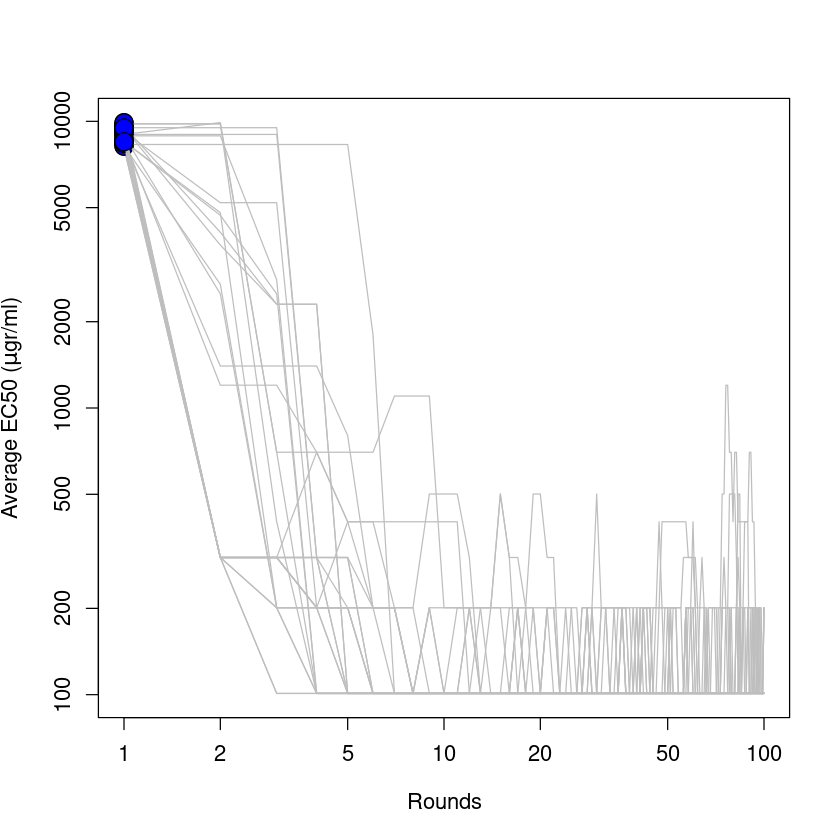

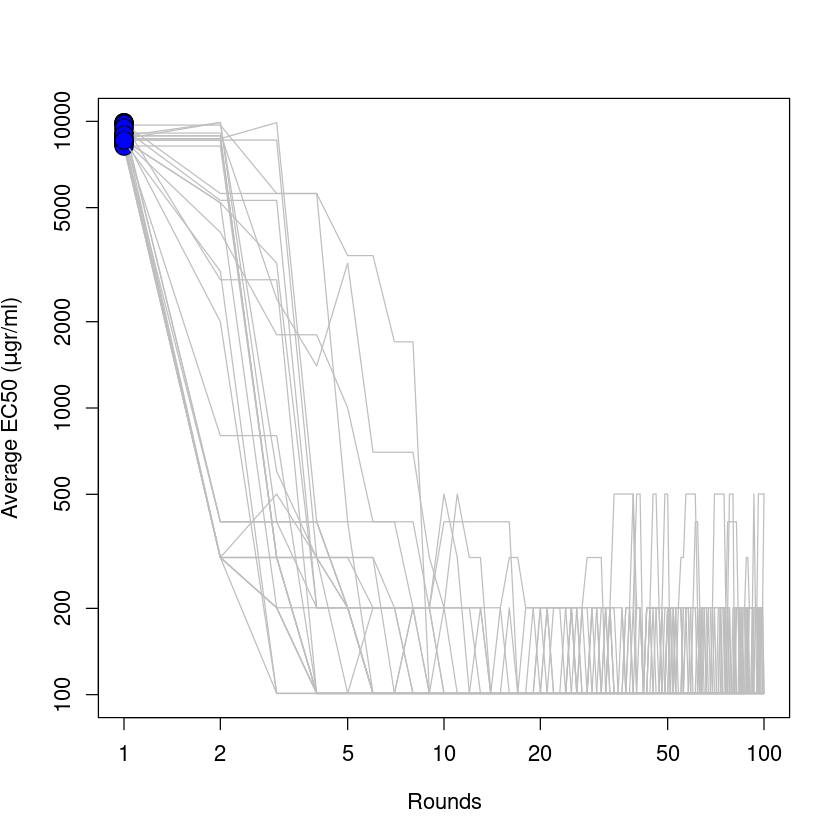

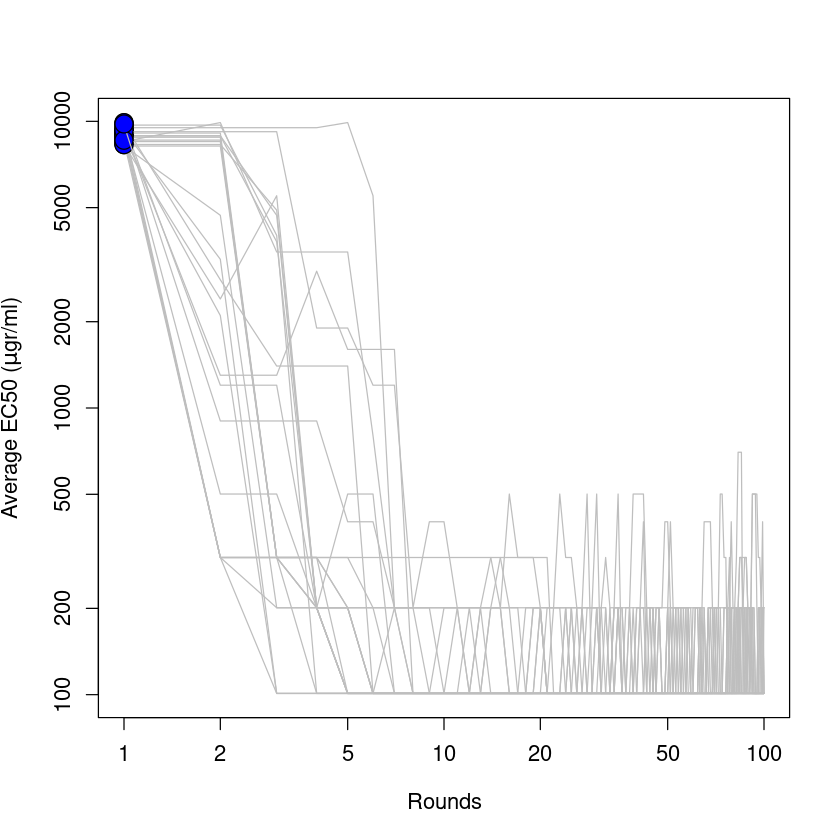

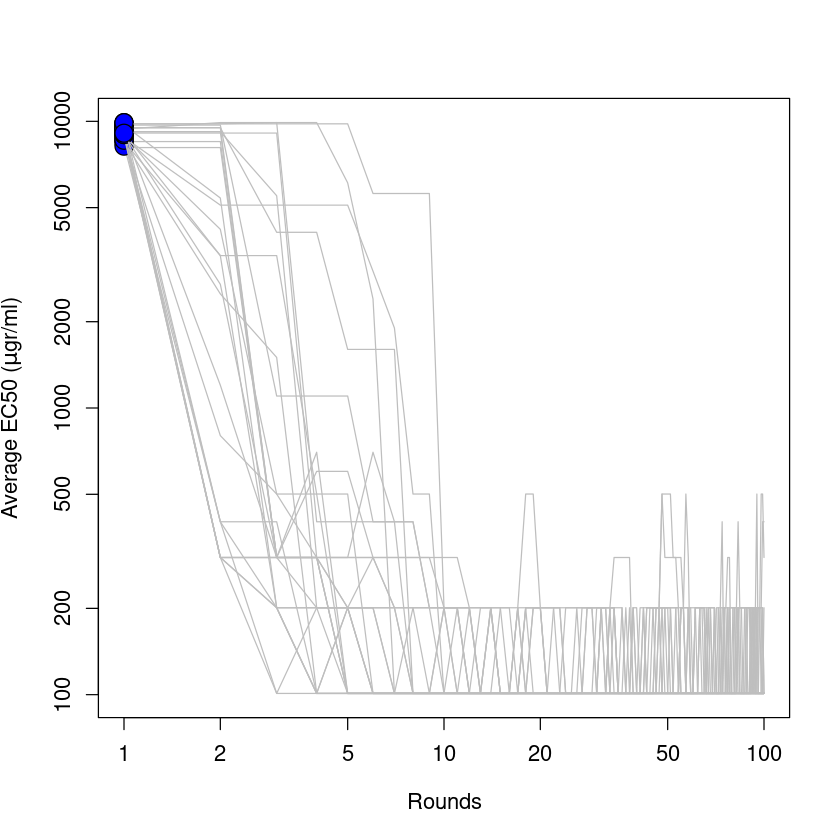

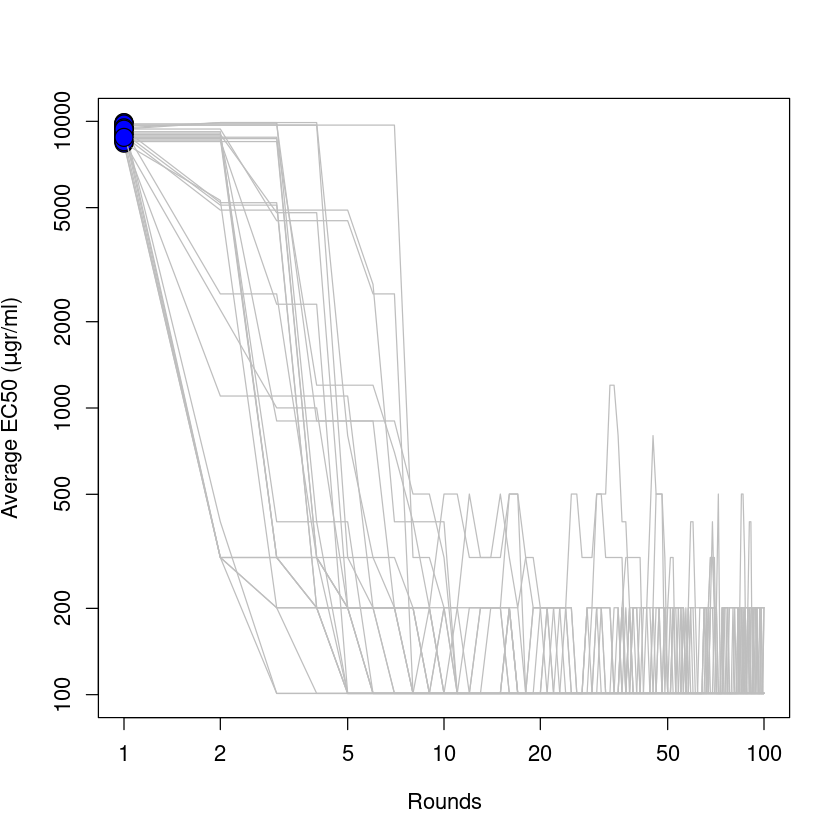

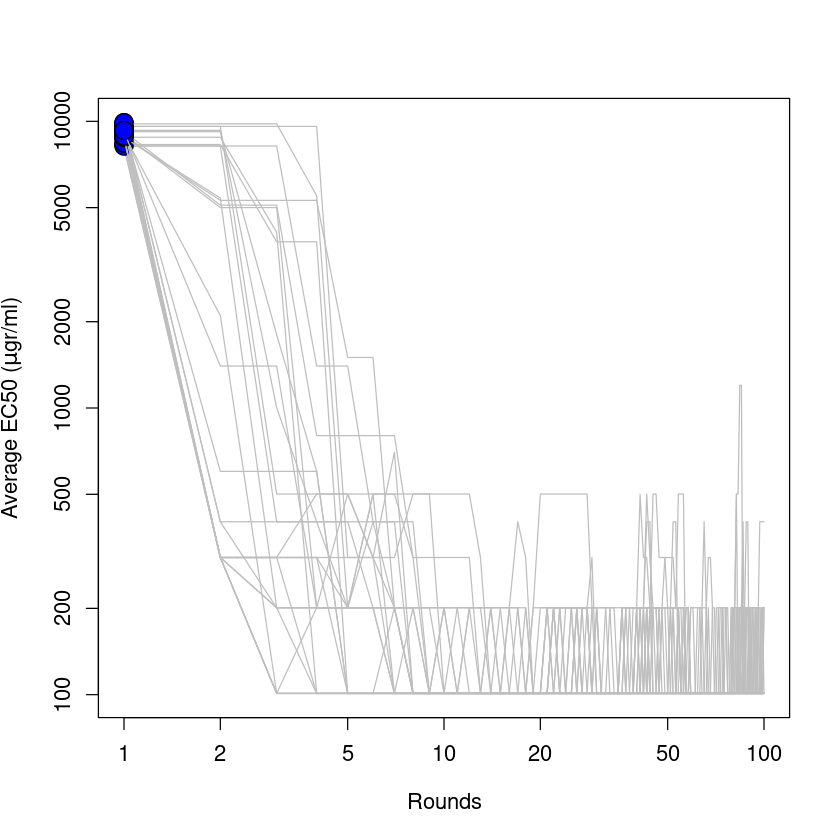

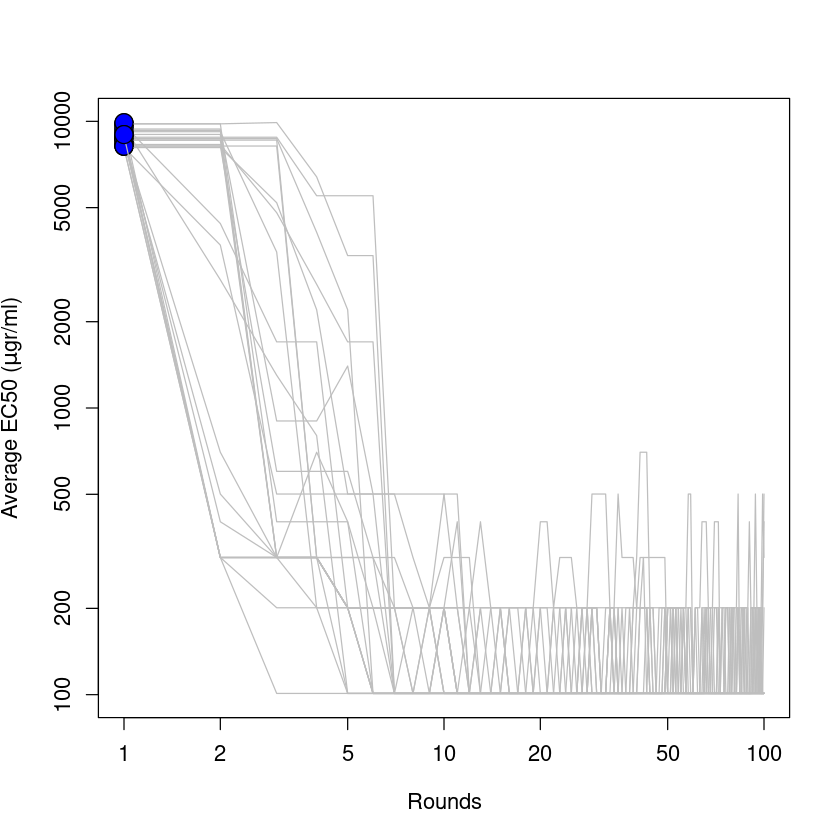

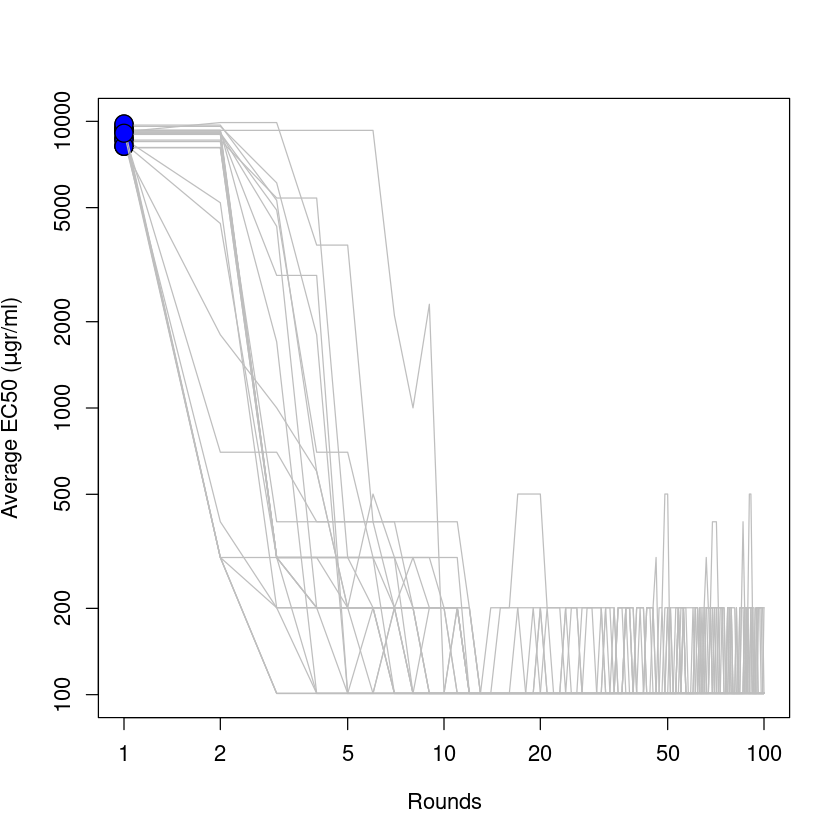

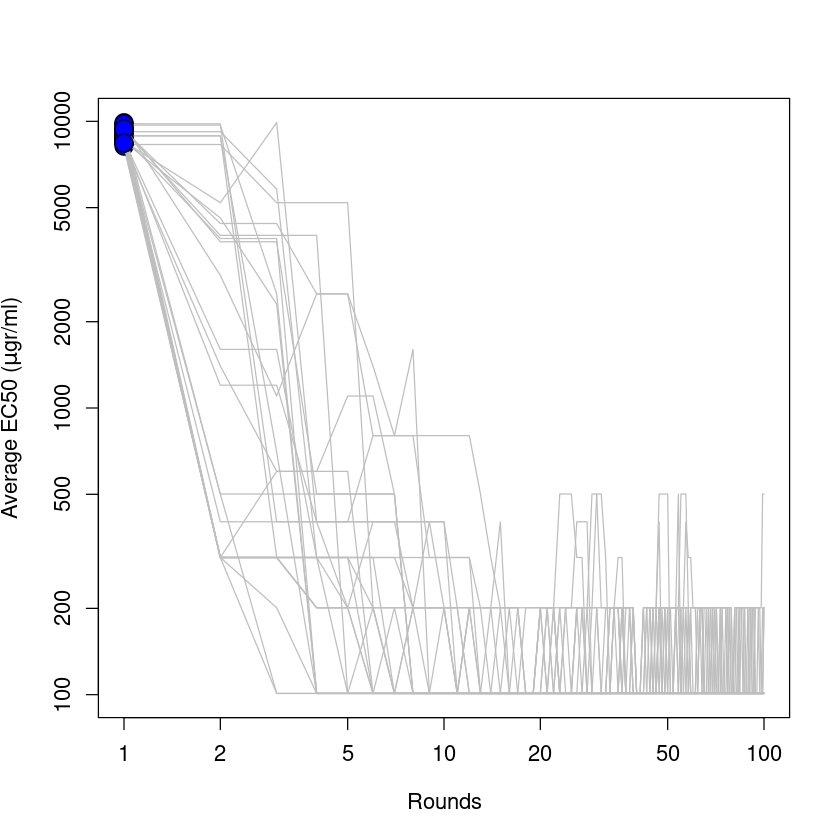

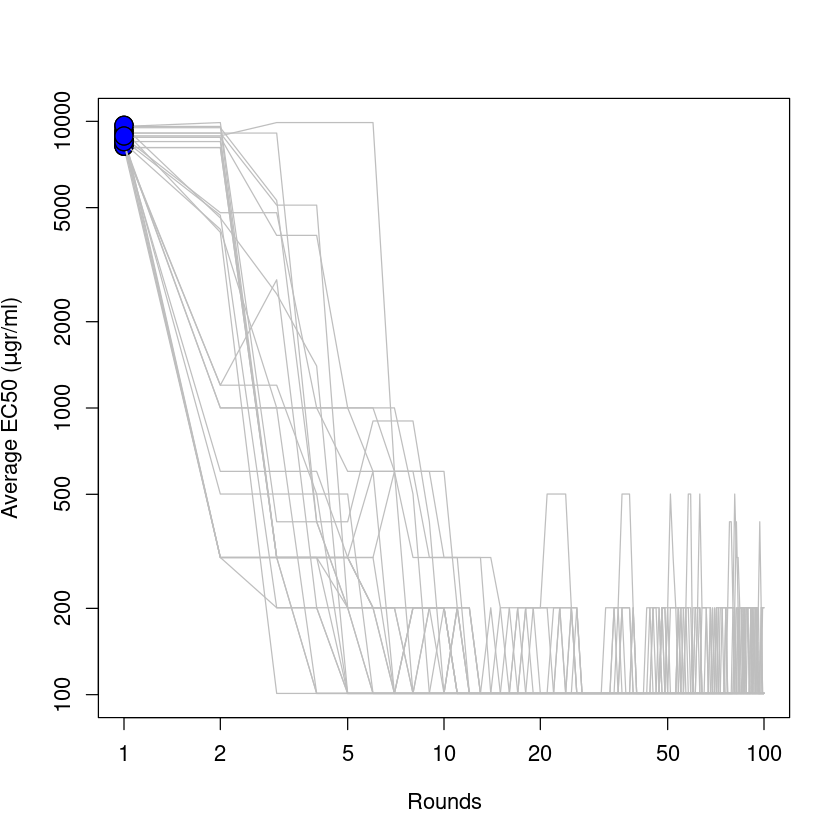

In [51]:
for (random in 1:10){
    
n_variants=30
R_init=seq(8190,10000, 100)

EC50_matrix=matrix(NA, nrow = 100, ncol = n_variants)

#pdf("./For_Ayse_SvgFormat/November_4th/point_5_T10_different_initial_EC50s.pdf")
for (i in 1:n_variants){

# Initial_point_1
init_EC50=sample(R_init, 1)

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


if (i==1){
    plot(R[chain.states], type="l", log="xy", ylim=c(100,10000),
        cex.lab=1.1, col="gray", cex.axis=1.1, xlab="Rounds",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")) )
    lines(init_EC50, cex=2, type="p", pch=21, bg="blue")
} else {
    lines(R[chain.states], col="gray")
    lines(init_EC50, cex=2,  type="p", pch=21, bg="blue")
}
 
    
    
}
    
    
EC50_matrix[,i]=t(R[chain.states])
    
}

colnames(EC50_matrix)=paste("variant_", as.character(seq(1,n_variants)), sep="")
rownames(EC50_matrix)=paste("Round_",as.character(seq(1,100)), sep="")

file_address=paste("./For_Ayse_SvgFormat/November_4th/", "30_variants_diff_init_EC50s_T10_trajectory_trial_", as.character(random), ".csv", sep="")
write.csv(EC50_matrix, file_address)

}
#dev.off()
#abline(h=10, lty=2)

### Probability of selection of different mutations

In [173]:
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4
    
X_WT=seq(100, 1000, 10) # Resistance level of WT
DeltaX=-10
X_mut=X_WT - DeltaX   # Resistance level of mutants
      
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
 
# Selection coefficient
s= (Fitness_mut - Fitness_WT)
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix_benef=(1-exp(-2*s))/(1-exp(-2*s*N)) 
    


X_WT=seq(100, 1000, 10) # Resistance level of WT
DeltaX=10
X_mut=X_WT - DeltaX   # Resistance level of mutants
      
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
 
# Selection coefficient
s= (Fitness_mut - Fitness_WT)
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix_delet=(1-exp(-2*s))/(1-exp(-2*s*N)) 


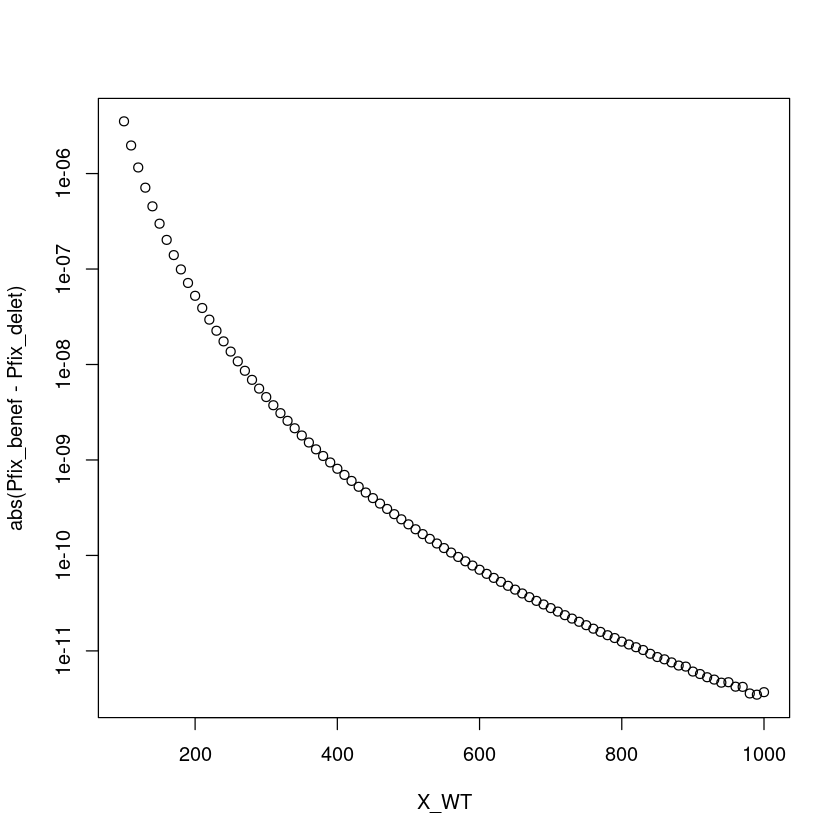

In [179]:
plot(X_WT, abs(Pfix_benef-Pfix_delet), log="y")

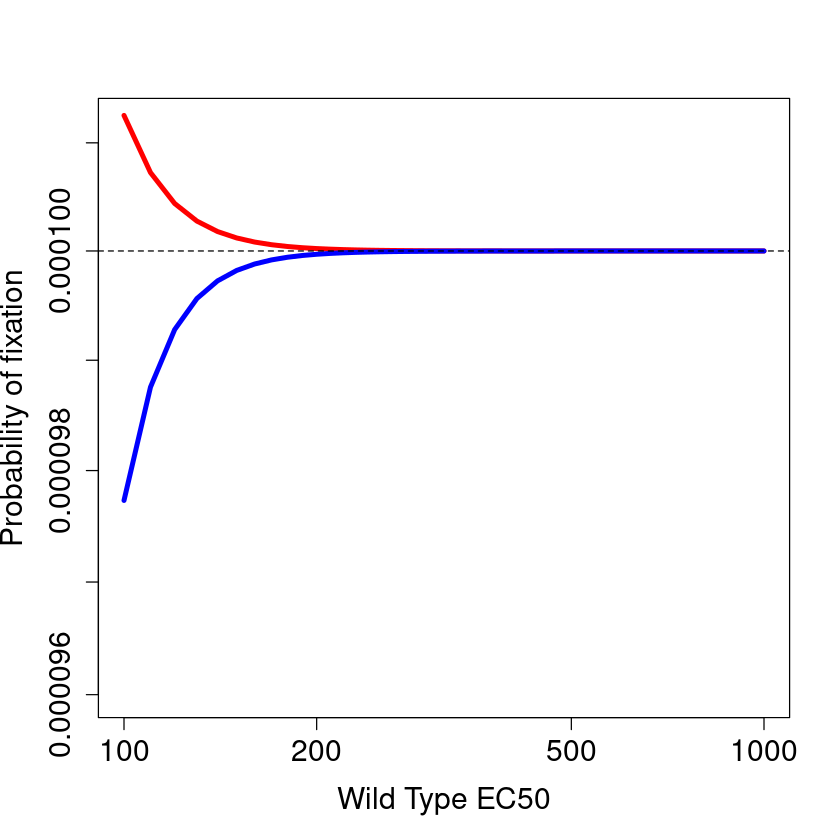

In [177]:
#pdf("./For_Ayse_SvgFormat/November_4th/Pfix_beneficial_deleterious.pdf")
plot(X_WT, Pfix_benef, col="red", type="l", lwd=4, log="xy", cex.lab=1.5, cex.axis=1.5,
    xlab="Wild Type EC50", ylab="Probability of fixation", ylim=c(9.6e-5, 0.0001012))
lines(X_WT, Pfix_delet, col="blue", type="l", lwd=4)
abline(h=1e-4, lty=2)
#dev.off()

### Fraction of all mutations in the same plot

In [65]:
library("ggplot2")
library("ggnewscale")
library("patchwork")

In [66]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 100) 
States=seq(1, length(R));

In [67]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [68]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [69]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [70]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

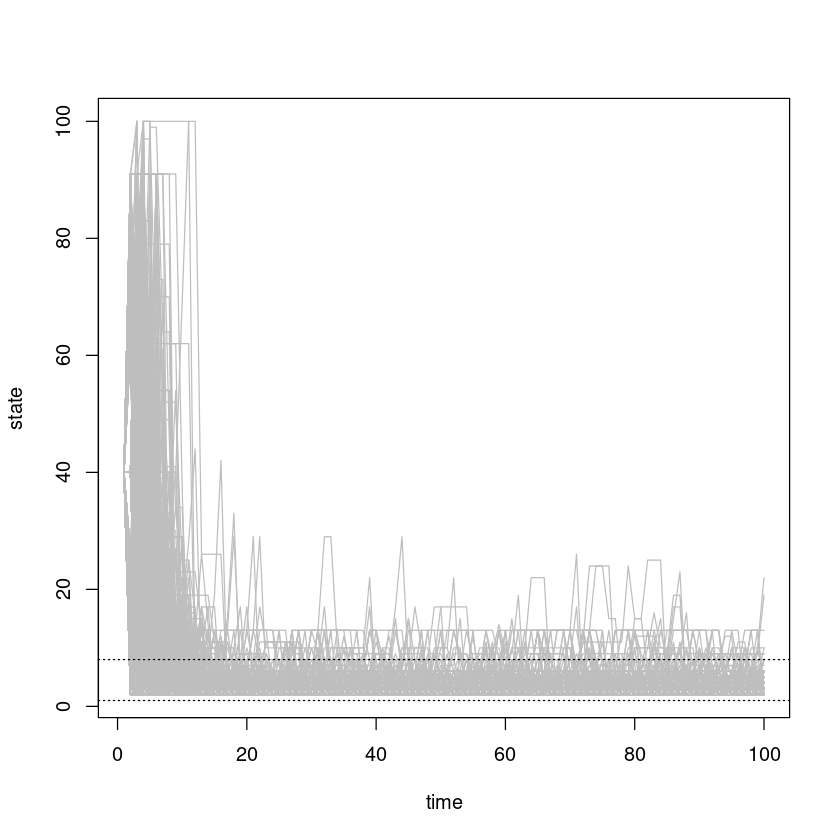

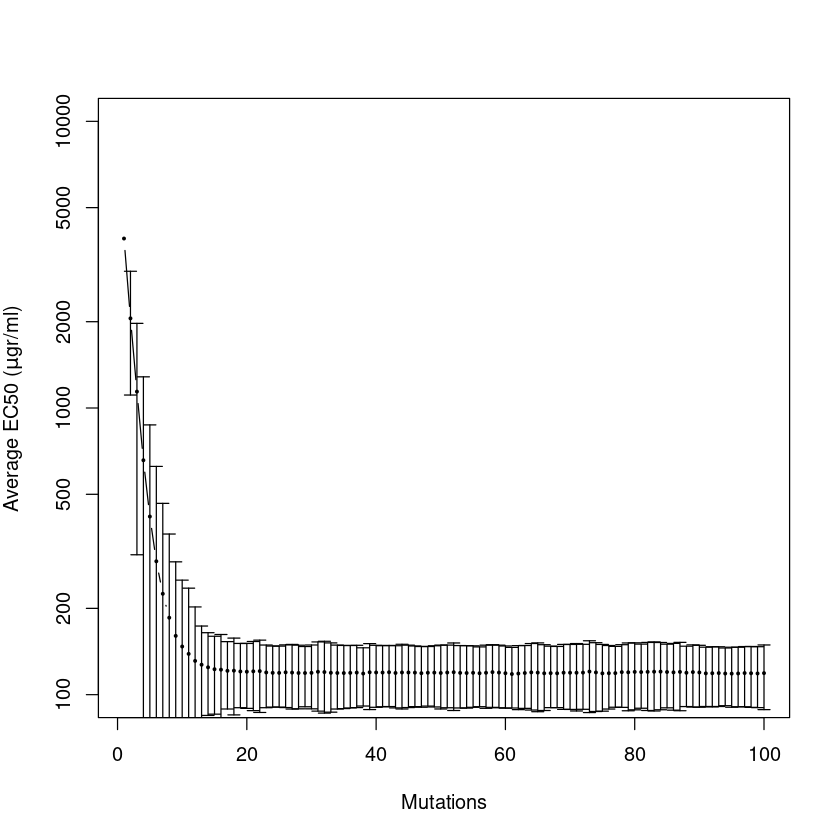

In [71]:
# Initial_point_1
init_EC50=4000

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 10000
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


matplot(chain.states, type='l', col="gray", lty=1, ylab='state', xlab='time')
abline(h=1, lty=3)
abline(h=8, lty=3)
    
EC50_avg_1=rep(NA, num.iterations)
EC50_sd_1=rep(NA, num.iterations)
EC50_median_1=rep(NA, num.iterations)

for (i in 1:num.iterations){
    
 EC50_avg_1[i]=mean(R[chain.states[i,]])
 EC50_sd_1[i]=sd(R[chain.states[i,]])  
 EC50_median_1[i]=median(R[chain.states[i,]])
    
    }

} else {
    
    message("Initial Value is Greater than the Concentration Range Provided")
    }


x=seq(1,num.iterations)
avg=EC50_avg_1
sdev=EC50_sd_1


lower_bound=avg-sdev/2
lower_bound[which(lower_bound <1)]=1

#pdf("T10_n_100_EC50.pdf")
plot(x, avg, type="b", pch=19, ylim=c(100, 10000), cex=0.3, xlab="Mutations",  log="y",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")))
arrows(x, lower_bound, x, avg+sdev/2, length=0.05, angle=90, code=3)
abline(h=0)
#dev.off()


In [72]:
 Ns_calc_EC50 <- function(R_before, R_after, N){
    
  
     
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4
    
X_WT=R_before # Resistance level of WT
X_mut=R_after   # Resistance level of mutants
    
    
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
  
# Selection coefficient
s= (Fitness_mut - Fitness_WT)/Fitness_WT
    return(N*s)
     
    
    }

In [73]:
Perc_pos=Perc_neg=Perc_neu=rep(NA, num.iterations)

for (i in 1:num.iterations-1){
    
    Spec=Ns_calc_EC50(R_before = chain.states[i,], R_after = chain.states[i+1,], N = 1e7)
    
    Perc_pos[i]=length(which(Spec > 1))/length(Spec)
    Perc_neg[i]=length(which(Spec < -1))/length(Spec)
    Perc_neu[i]=length(which((abs(Spec) <= 1)))/length(Spec)
   

  }  

In [126]:
options(warn = -1)

pdf("./For_Ayse_SvgFormat/November_4th/EC50_fractions_all_in_one.pdf")
### Fraction of beneficial mutations

Perc <- data.frame(Perc_pos, avg, col=round(avg));
colnames(Perc)=c("Percentage", "EC50", "col")
Perc=as.data.frame(Perc)

b <- ggplot(Perc, aes(Percentage, EC50))+ geom_point(aes(size=col), color = "red", stroke = 3)+
       scale_x_continuous(trans='log10')+
  scale_colour_gradientn(colours = c("#1874CD", "darkblue"))+
    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_pos[i], x2 = Perc_pos[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.0,"cm")),);

}

### Fraction of deleterious mutations

Perc_2 <- data.frame(Perc_neg, avg, col=round(avg));
colnames(Perc_2)=c("Percentage", "EC50", "col")


b <- b + geom_point(data=Perc_2, aes(size=col), color = "blue", stroke = 3)  

limit=length(Perc_pos)-1;
for (j in 1:limit){

df <- data.frame(col=j, x1 = Perc_neg[j], x2 = Perc_neg[j+1], y1 = avg[j], y2 = avg[j+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.20,"cm")),);

}

### Fraction of neutral mutations

Perc_3 <- data.frame(Perc_neu, avg, col=round(avg));
colnames(Perc_3)=c("Percentage", "EC50", "col")


b <- b + geom_point(data=Perc_3, aes(size=col), color = "green", stroke = 3)  

limit=length(Perc_neu)-1;
for (j in 1:limit){

df <- data.frame(col=j, x1 = Perc_neu[j], x2 = Perc_neu[j+1], y1 = avg[j], y2 = avg[j+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.20,"cm")),);

}

print(b)

dev.off()

png 
  2

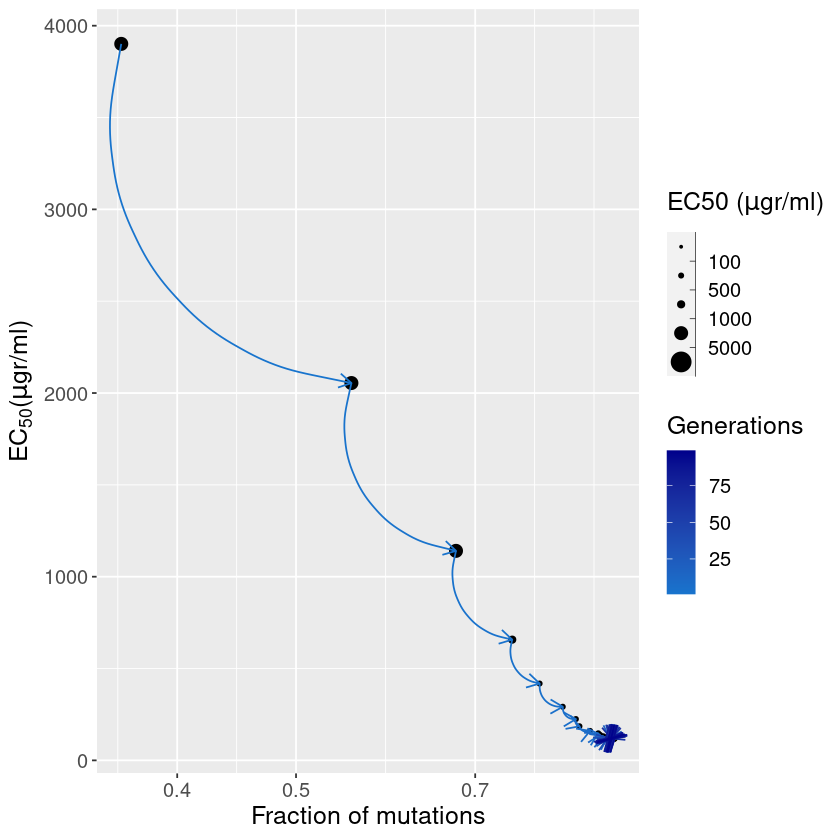

In [127]:
options(warn = -1)

#pdf("./For_Ayse_SvgFormat/November_4th/neutral.pdf")
### Fraction of beneficial mutations

Perc <- data.frame(Perc_neu, avg, col=round(avg));
colnames(Perc)=c("Percentage", "EC50", "col")
Perc=as.data.frame(Perc)

b <- ggplot(Perc, aes(Percentage, EC50))+ geom_point(aes(size=col))+
      scale_x_continuous(trans='log10')+
  scale_colour_gradientn(colours = c("#1874CD", "darkblue"))+
    labs(size= expression(paste("EC50 (", mu, "gr/ml)")), 
       col="Generations", x ="Fraction of mutations", y =expression(paste("EC"[50], "(", mu, "gr/ml)") ) )+
    theme(text = element_text(size = 15))+
     
scale_size_binned_area(
    limits = c(0, 10000),
    breaks = c(0, 100, 500, 1000, 5000, 10000),
  )

limit=length(Perc_neg)-1;
for (i in 1:limit){

df <- data.frame(col=i, x1 = Perc_neu[i], x2 = Perc_neu[i+1], y1 = avg[i], y2 = avg[i+1]);

b <- b + geom_curve(aes(x = x1, y = y1, xend = x2, yend = y2, colour=col), data = df, arrow = arrow(length=unit(0.30,"cm")),);

}

print(b)

#dev.off()

## Fish out "selectively neutral" mutations

In [1]:
rm(list=ls())

In [2]:
library("ggplot2")

In [3]:
# Phenotypic space; R refers to the resistance level and varies from the minimum value of 2 to 10000 (ug/ml)
R=seq(1,10000, 10) 
States=seq(1, length(R));

In [4]:
DME=readRDS(file = "~/Dropbox/Wagner_Lab/Projects/Polyclonal_evolution/DME.RDS")

In [5]:
drift_MIC=function(X_WT, DME, R){
    
MIC_WT=X_WT
new_MIC=MIC_WT*DME
R_cap=rep(0, length(R))
    
for (i in 1:length(new_MIC)){
    index=which.min(abs(new_MIC[i] - R)) 
    R_cap[index]=R_cap[index] +1
}  
    P_drift=R_cap/length(new_MIC)
    return(P_drift)    
}

In [6]:
# Defining the transition probability matrix

P=matrix(0, nrow = length(States), ncol = length(States))

# The concentration of Ampicillin in experimenst and simulations
AMP=10 ## Ampicillin Concentration

# Relating resistance levels to fitness
X50=0.93*AMP-1.29

# Population size
N=1e4

for (i in 1:length(P[,1])){  # We fill by rows
    
X_WT=R[i] # Resistance level of WT
X_mut=R   # Resistance level of mutants
      
# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
Fitness_mut[which(is.na(Fitness_mut))]=-4   
 
# Selection coefficient
s= Fitness_mut - Fitness_WT
 
#s=log(Fitness_mut/Fitness_WT)
# Probability of fixation for haploid populations; Kimura's Formula
Pfix=(1-exp(-2*s))/(1-exp(-2*s*N)) 

# Accounting for singularity when s=0; Strictly neutral mutations
Pfix[which(s==0)]=1/N

# The drift component of transition probability
Pdrift=drift_MIC(X_WT, DME, X_mut)

# The transition probability in our Markov Chain simulations is equal to the product of a drift component 
# and a selection component.
    
P[i,]=Pfix*Pdrift
P[i,]=P[i,]/sum(P[i,])
    
}

In [7]:
# The core of Markov chains simulstions
# Here, we simulate discrete Markov chains according to transition matrix P

run.mc.sim <- function(P, num.iters, init_state) {
  
  # number of possible states
  num.states <- nrow(P)
  
  # stores the states X_t through time
  states     <- numeric(num.iters)

  # initialize variable for first state 
  states[1]    <- init_state

  for(t in 2:num.iters) {
    
    # probability vector to simulate next state X_{t+1}
    p  <- P[states[t-1], ]
    
    ## draw from multinomial and determine state
    states[t] <-  which(rmultinom(1, 1, p) == 1)
  }
  return(states)
}

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a multiple of shorter object length”
Warning message in X_WT + diff(R[chain.states]):
“longer object length is not a 

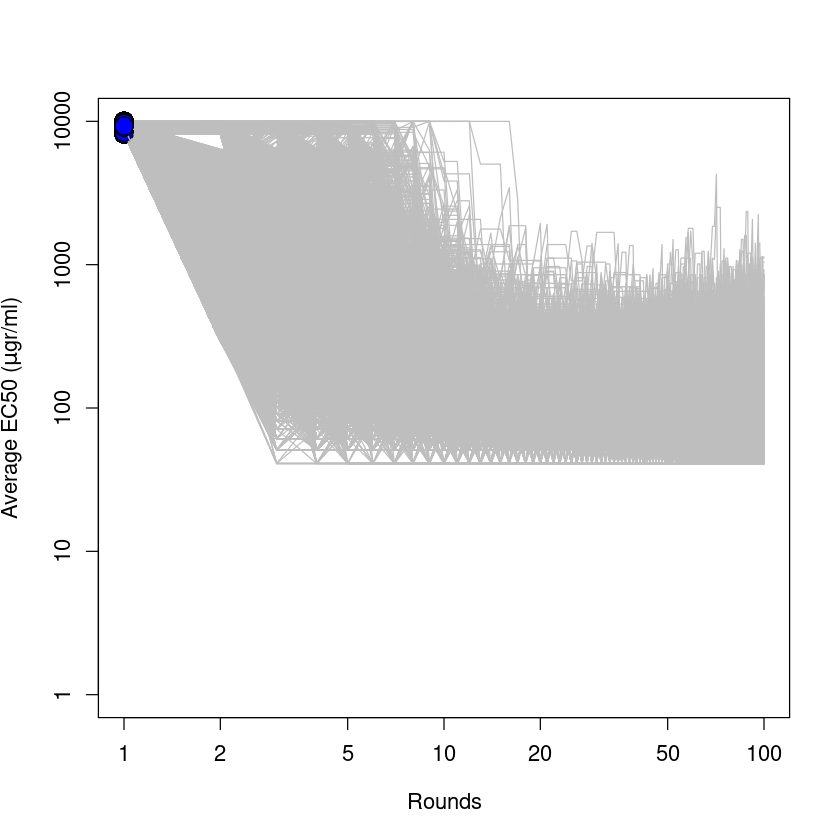

In [8]:
#pdf("./For_Ayse_SvgFormat/November_4th/T10_trajectory_random_initials.pdf")
dF_list=list()
dEC50_list=list()

n_variants=10000
R_init=seq(8190,10000, 100)
dF_dEC50_matrix=vector()


dF_mat=matrix(NA, nrow = n_variants, ncol = 99)

dEC50_matrix_fold=matrix(NA, nrow = n_variants, ncol = 99)
dEC50_mat=matrix(NA, nrow = n_variants, ncol = 99)

EC50_matrix=matrix(NA, nrow = 100, ncol = n_variants)
fish=0
#pdf("./For_Ayse_SvgFormat/November_4th/point_5_T10_different_initial_EC50s.pdf")
for (i in 1:n_variants){

# Initial_point_1
init_EC50=sample(R_init, 1)

# Here, we make sure the initial resistance value is not
# higher than our maximum resistance in the phenotype space
check_init=length(which(R>init_EC50))

if (check_init > 0) {
    
# We determine the phenotypic state that corresponds to the initial resistance level
init_state=which(R>init_EC50)[1]-1

    
# Number of Markov Chains (and not states!): These corresponds to different proteins
# that can evolve (or transition) from their state to other states    
num.chains     <- 1
    
# Number of iterations that we advance our Markov chains
# This corresponds to the rounds of evolution
num.iterations <- 100

chain.states <- matrix(NA, ncol=num.chains, nrow=num.iterations)
for(c in seq_len(num.chains)){
  chain.states[,c] <- run.mc.sim(P, num.iters = num.iterations, init_state = init_state)
}


if (i==1){
    plot(R[chain.states], type="l", log="xy", ylim=c(1,10000),
        cex.lab=1.1, col="gray", cex.axis=1.1, xlab="Rounds",ylab=expression(paste("Average EC50 (", mu,"gr/ml)", sep="")) )
    lines(init_EC50, cex=2, type="p", pch=21, bg="blue")
} else {
    lines(R[chain.states], col="gray")
    lines(init_EC50, cex=2,  type="p", pch=21, bg="blue")
}
 
    
    
}
    
    
EC50_matrix[,i]=t(R[chain.states])

    
    
fish=fish+1    
### Calculate the percentage of mutations    
dEC50=diff(R[chain.states])    

X_WT=R[chain.states]
X_mut=X_WT+diff(R[chain.states])

# Fitness equation is coming from previous experiments by John Chen and colleagues in Tokuriki Lab
Fitness_WT=  1/(1+(X50/X_WT)^5)
Fitness_mut= 1/(1+(X50/X_mut)^5) 
 
# Selection coefficient
s= (Fitness_mut - Fitness_WT)
dF=N*s

    
dF_list[[i]]=dF[1:99]
dEC50_list[[i]]=dEC50[1:99]
 
dF_dEC50_matrix=rbind(dF_dEC50_matrix, cbind(dF[1:99], dEC50[1:99]))    

dF_mat[i,]=dF[1:99]
dEC50_mat[i,]= dEC50[1:99]   

    

dEC50_matrix_fold[i,]=(R[chain.states][2:100]-R[chain.states][1:99])/R[chain.states][1:99]

    
}
#dev.off()


In [10]:
library("vioplot")

pdf("./For_Ayse_SvgFormat/November_4th/violin_plots.pdf")

Round_to_plot=c(1,5,20,50,80,99)

par(mfrow = c(2,3), pty="s")

for (i in 1:6){
    
index=Round_to_plot[i]
    
plot(dF_mat[,index], dEC50_matrix_fold[,index]*100, 
     xlim=c(-2,2), ylim=c(-2, 2)*100, main=paste("Round=", as.character(Round_to_plot[i])),
     xlab="Fitness Effects", ylab="Fold Change (relative to initial EC50)", 
     pch=21, col="blue", bg="gray")     
     
     abline(h=0, v=0)
     abline(v=c(-1,1), lty=2)

    
    par(new = TRUE)

vioplot(dEC50_matrix_fold[,index]*100, yaxt = "n", axes = FALSE,
       col = rgb(0, 1, 1, alpha = 0.15))


    
}


dev.off()

png 
  2

In [14]:
library("vioplot")

pdf("./For_Ayse_SvgFormat/November_4th/just_bar_plots.pdf")

Round_to_plot=c(1,5,20,50,80,99)

par(mfrow = c(2,3), pty="s")

for (i in 1:6){
    
index=Round_to_plot[i]
    
plot(dF_mat[,index], dEC50_matrix_fold[,index]*100, 
     xlim=c(-2,2), ylim=c(-2, 2)*100, main=paste("Round=", as.character(Round_to_plot[i])),
     xlab="Fitness Effects", ylab="Fold Change (relative to initial EC50)", 
     pch=21, col="blue", bg="gray")     
     
     abline(h=0, v=0)
     abline(v=c(-1,1), lty=2)

    
    #par(new = TRUE)

#vioplot(dEC50_matrix_fold[,index]*100, yaxt = "n", axes = FALSE,
#       col = rgb(0, 1, 1, alpha = 0.15))


    
}


dev.off()

png 
  2

In [23]:
colnames(dF_mat)=paste("Round_", as.character(seq(2,100)), sep="")
rownames(dF_mat)=paste("Trajectory_", as.character(seq(1,10000)), sep="")

In [24]:
colnames(dEC50_matrix_fold)=paste("Round_", as.character(seq(2,100)), sep="")
rownames(dEC50_matrix_fold)=paste("Trajectory_", as.character(seq(1,10000)), sep="")

In [27]:
write.csv(dF_mat, "./For_Ayse_SvgFormat/November_4th/dFitness_matrix_fold.csv")
write.csv(dEC50_matrix_fold*100, "./For_Ayse_SvgFormat/November_4th/dEC50_matrix_fold.csv")

In [9]:
### Count the fraction from 20 to 90
Ratio_matrix=matrix(NA, nrow = 10000, ncol = 70)

for (i in 1:70){

init=19+i
finit=20+i

Ratio_matrix[,i]=dEC50_matrix_fold[,init]/dEC50_matrix_fold[,finit]   
    
}


In [10]:
Ratio_vector=as.vector(Ratio_matrix)
Ratio_vector_nonONE=Ratio_vector[which(Ratio_vector !=1)]

length(which(Ratio_vector_nonONE > 2))/length(Ratio_vector_nonONE)

[1] 0.09238391

In [11]:
Ratio=dEC50_matrix_fold[,20]/dEC50_matrix_fold[,19]
length(which(Ratio > 1))/length(Ratio)

[1] 0.0737

In [12]:
rownames(dEC50_mat)=paste("Trajectory_", as.character(seq(1,n_variants)), sep="")
colnames(dEC50_mat)=paste("Round_", as.character(seq(2,100)), sep="")

rownames(dEC50_matrix_fold)=paste("Trajectory_", as.character(seq(1,n_variants)), sep="")
colnames(dEC50_matrix_fold)=paste("Round_", as.character(seq(2,100)), sep="")

rownames(dF_mat)=paste("Trajectory_", as.character(seq(1,n_variants)), sep="")
colnames(dF_mat)=paste("Round_", as.character(seq(2,100)), sep="")

In [13]:
write.csv(dEC50_matrix_fold, "./For_Ayse_SvgFormat/November_4th/dEC50_fold.csv")

In [11]:
write.csv(dEC50_mat, "./For_Ayse_SvgFormat/November_4th/dEC50_matrix.csv")

write.csv(dF_mat, "./For_Ayse_SvgFormat/November_4th/dF_matrix.csv")


In [144]:
f_neutral=matrix(NA, nrow = 99, ncol = 2)
f_selective=matrix(NA, nrow = 99, ncol = 2)

for (i in 1:99){

# Count the non-Zero fraction
nonZero=length(which(dEC50_mat[,i]!=0)) 

f_neutral[i,1]=length(which( (abs(dF_mat[,i]) <= 1) & (dEC50_mat[,i])> 0) )/nonZero
f_neutral[i,2]=length(which( (abs(dF_mat[,i])<= 1) & (dEC50_mat[,i]) < 0) )/nonZero 
  
f_selective[i,1]=length(which( (abs(dF_mat[,i])>1) & (dEC50_mat[,i])> 0) )/nonZero 
f_selective[i,2]=length(which( (abs(dF_mat[,i])>1) & (dEC50_mat[,i]) < 0) )/nonZero 
  
    
}

colnames(f_neutral)=c("Positive","Negative")
f_neutral=as.data.frame(f_neutral)

colnames(f_selective)=c("Positive","Negative")
f_selective=as.data.frame(f_selective)

In [145]:
f_selective

Positive,Negative
<dbl>,<dbl>
0.000000000,0.0000000000
0.000000000,0.0003554924
0.000000000,0.0010526316
0.000000000,0.0014873575
0.001121076,0.0028026906
0.001972387,0.0052596976
0.004961021,0.0060240964
0.003963535,0.0043598890
0.003909644,0.0091225022


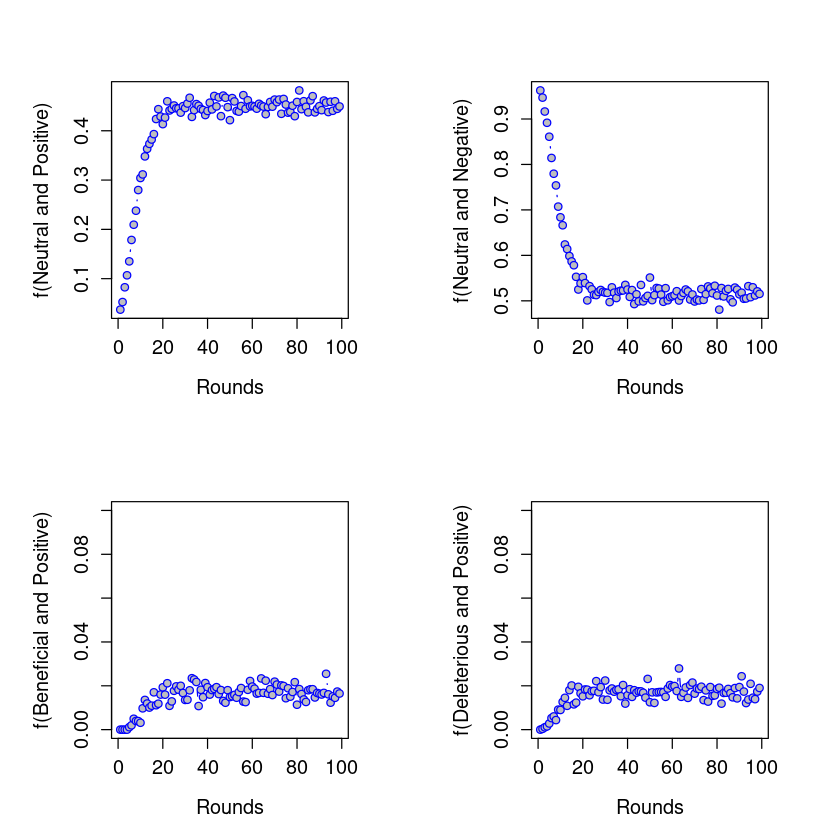

In [146]:
#pdf("./For_Ayse_SvgFormat/November_4th/Fractions_per_round.pdf")
par(mfrow = c(2,2), pty="s")
plot(f_neutral$Positive, type="b", xlab="Rounds",  ylab="f(Neutral and Positive)", pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)
plot(f_neutral$Negative, type="b", xlab="Rounds",  ylab="f(Neutral and Negative)", pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)


plot(f_selective$Positive, type="b", ylim=c(0,0.1), ylab="f(Beneficial and Positive)", xlab="Rounds",  pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)
plot(f_selective$Negative, type="b", ylim=c(0,0.1), ylab="f(Deleterious and Positive)", xlab="Rounds",  pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)

#dev.off()

In [147]:
f_neutral=matrix(NA, nrow = 99, ncol = 2)
f_selective=matrix(NA, nrow = 99, ncol = 2)

for (i in 1:20){


# Count the non-Zero fraction
nonZero=dim(dEC50_mat)[1] 

f_neutral[i,1]=length(which( (abs(dF_mat[,i]) <= 1) & (dEC50_mat[,i])> 0) )/nonZero
f_neutral[i,2]=length(which( (abs(dF_mat[,i])<= 1) & (dEC50_mat[,i]) < 0) )/nonZero 
  
f_selective[i,1]=length(which( (abs(dF_mat[,i])>1) & (dEC50_mat[,i])> 0) )/nonZero 
f_selective[i,2]=length(which( (abs(dF_mat[,i])>1) & (dEC50_mat[,i]) < 0) )/nonZero 
  
    
}

colnames(f_neutral)=c("Positive","Negative")
f_neutral=as.data.frame(f_neutral)

colnames(f_selective)=c("Positive","Negative")
f_selective=as.data.frame(f_selective)

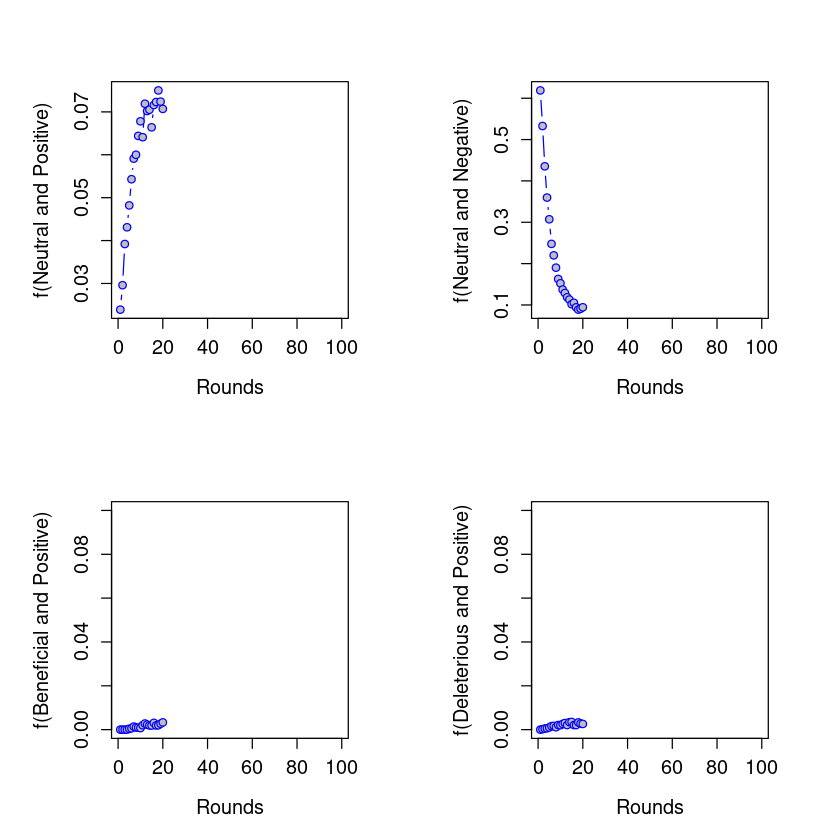

In [148]:
#pdf("./For_Ayse_SvgFormat/November_4th/Fractions_per_round_all.pdf")
par(mfrow = c(2,2), pty="s")
plot(f_neutral$Positive, type="b", xlab="Rounds",  ylab="f(Neutral and Positive)", pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)
plot(f_neutral$Negative, type="b", xlab="Rounds",  ylab="f(Neutral and Negative)", pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)


plot(f_selective$Positive, type="b", ylim=c(0,0.1), ylab="f(Beneficial and Positive)", xlab="Rounds",  pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)
plot(f_selective$Negative, type="b", ylim=c(0,0.1), ylab="f(Deleterious and Positive)", xlab="Rounds",  pch=21, col="blue", bg="gray", cex.lab=1.2, cex.axis=1.2)

#dev.off()

In [15]:
dF_mat

,Round_2,Round_3,Round_4,Round_5,Round_6,Round_7,Round_8,Round_9,Round_10,Round_11,⋯,Round_91,Round_92,Round_93,Round_94,Round_95,Round_96,Round_97,Round_98,Round_99,Round_100
Trajectory_1,-1.133341e-04,0.000000e+00,0.000000e+00,-1.259929e-02,0.000000e+00,0.0125244343,0.000000e+00,0.000000e+00,-0.002066979,0.000000e+00,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Trajectory_2,-1.865175e-10,-3.048127e-03,0.000000e+00,-4.979073e-02,-9.027528e-01,0.0000000000,0.000000e+00,0.000000e+00,0.000000000,9.429644e-01,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Trajectory_3,-3.774758e-11,-6.217249e-10,0.000000e+00,-1.271262e-02,0.000000e+00,0.0000000000,-1.700399e-01,-7.728487e-01,0.000000000,0.000000e+00,⋯,0.000000000,0.000000000,0.94296441,0.01230706,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,-0.05243327
Trajectory_4,-8.298939e-05,-1.614354e-03,0.000000e+00,-2.967554e-02,2.832484e-02,-0.0497907341,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,⋯,0.942964407,-0.170039913,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Trajectory_5,-9.999934e-07,0.000000e+00,0.000000e+00,-4.591298e-05,-4.543927e-04,0.0000000000,0.000000e+00,0.000000e+00,-0.005415220,0.000000e+00,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Trajectory_6,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.334535e-04,0.0000000000,-1.563890e-03,0.000000e+00,-0.029675539,0.000000e+00,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Trajectory_7,0.000000e+00,0.000000e+00,-6.439294e-11,-1.133340e-04,1.110828e-04,0.0000000000,0.000000e+00,-3.137063e-02,0.000000000,0.000000e+00,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.35902913,0.00000000,0.00000000,0.00000000,-0.35901624
Trajectory_8,-1.731948e-10,0.000000e+00,-3.048127e-03,-1.797042e-01,0.000000e+00,0.0000000000,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,⋯,0.000000000,0.000000000,0.00000000,0.00000000,-2.75070565,0.00000000,2.79320117,0.00000000,0.00000000,0.00000000
Trajectory_9,-1.354472e-10,0.000000e+00,-2.255184e-03,0.000000e+00,-9.231048e-02,0.0000000000,0.000000e+00,0.000000e+00,0.000000000,-8.610294e-01,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.17004280,0.00000000,-0.17003991
Trajectory_10,-1.074696e-09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0000000000,0.000000e+00,-1.290852e-06,0.000000000,0.000000e+00,⋯,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000


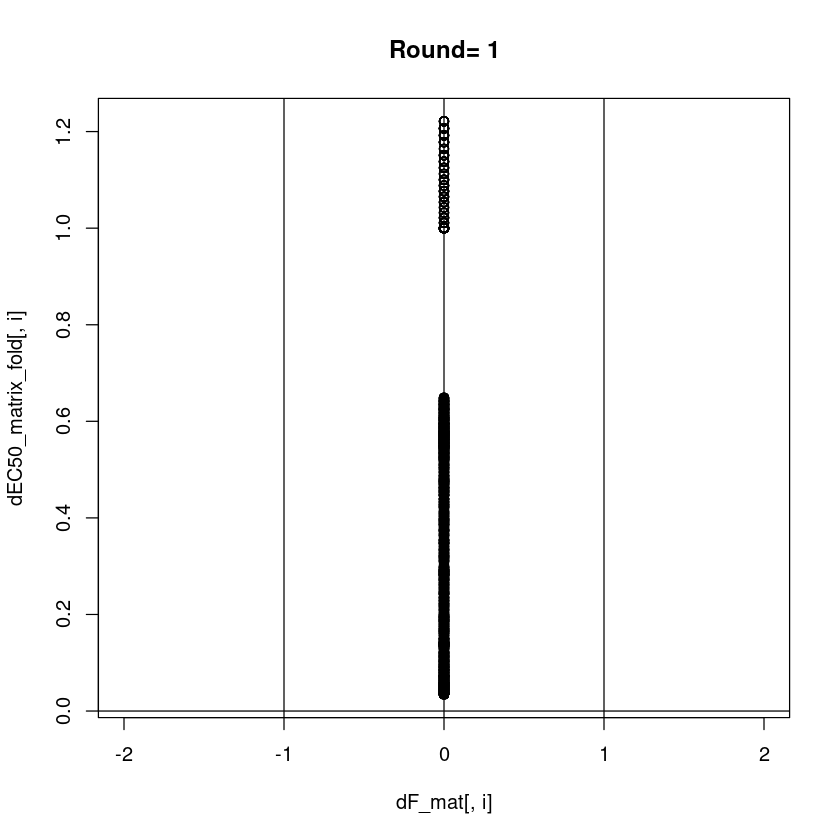

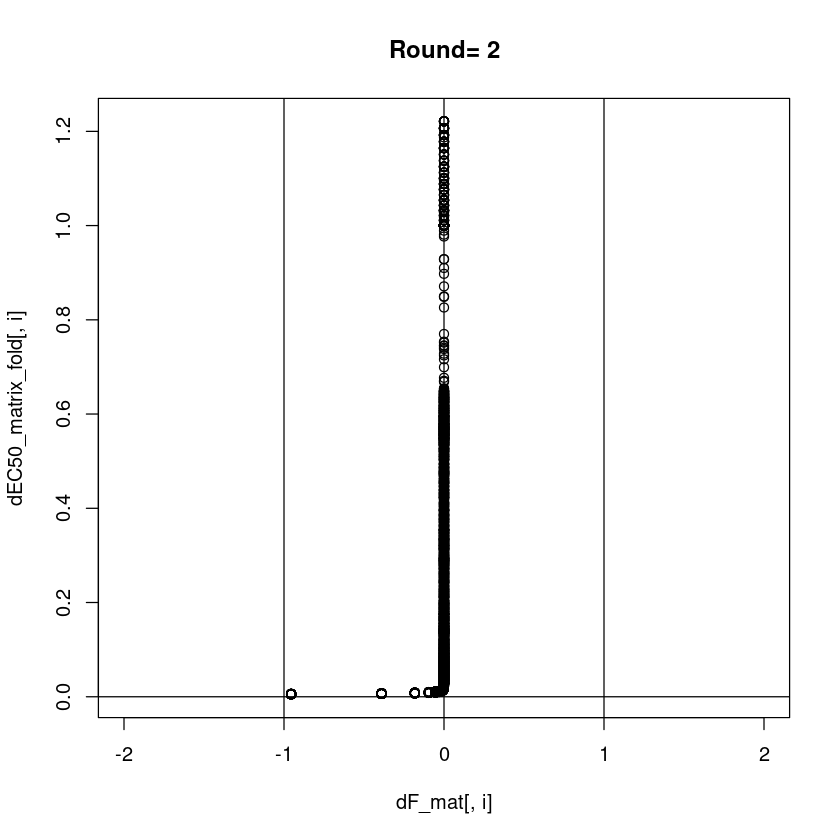

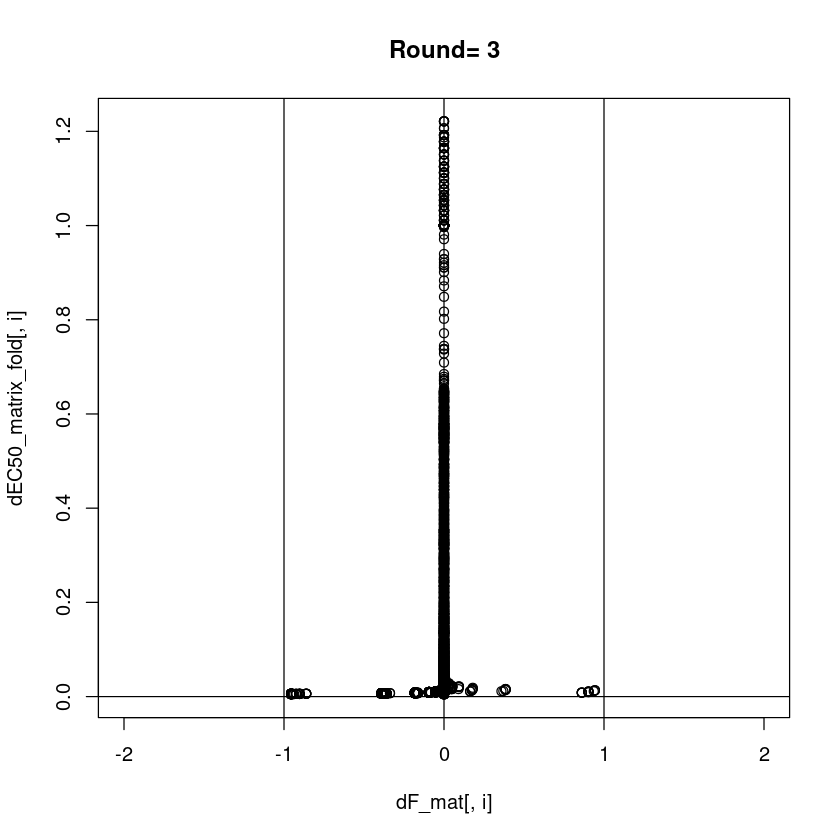

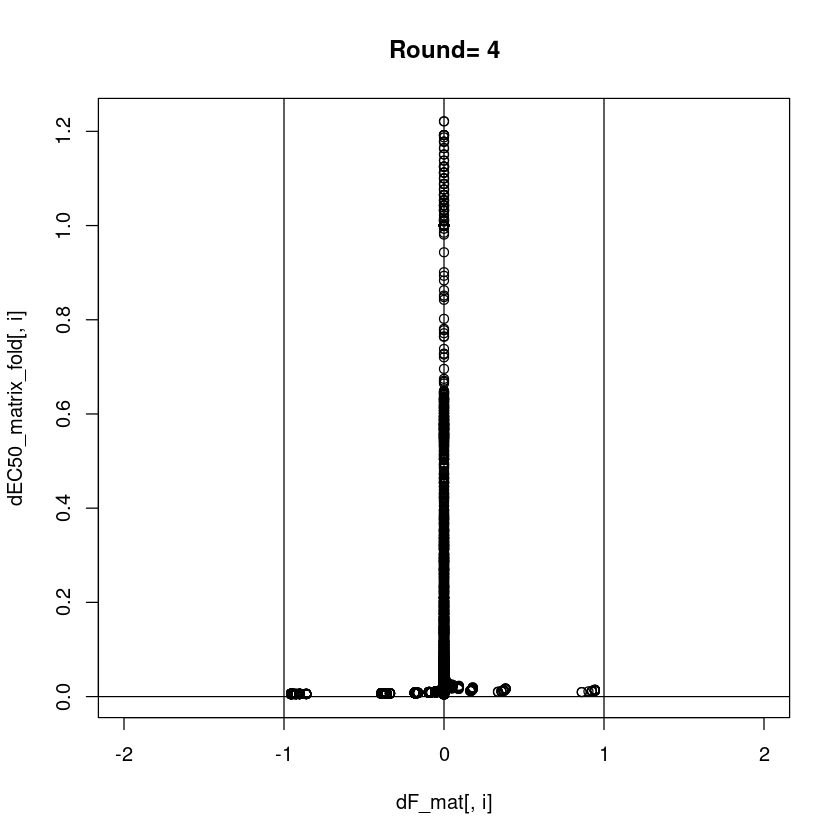

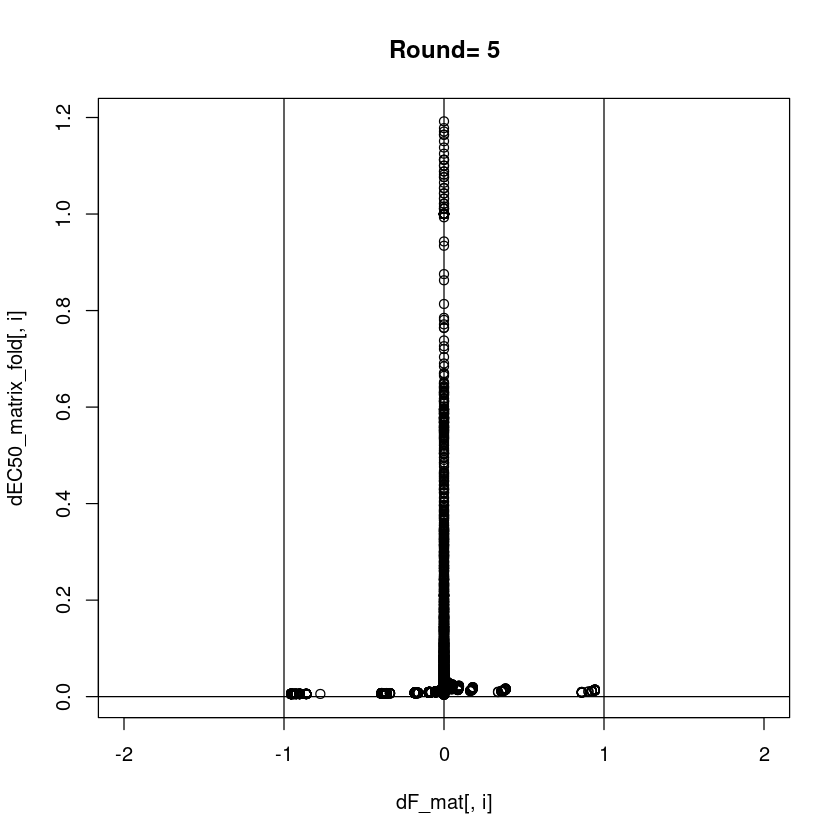

...

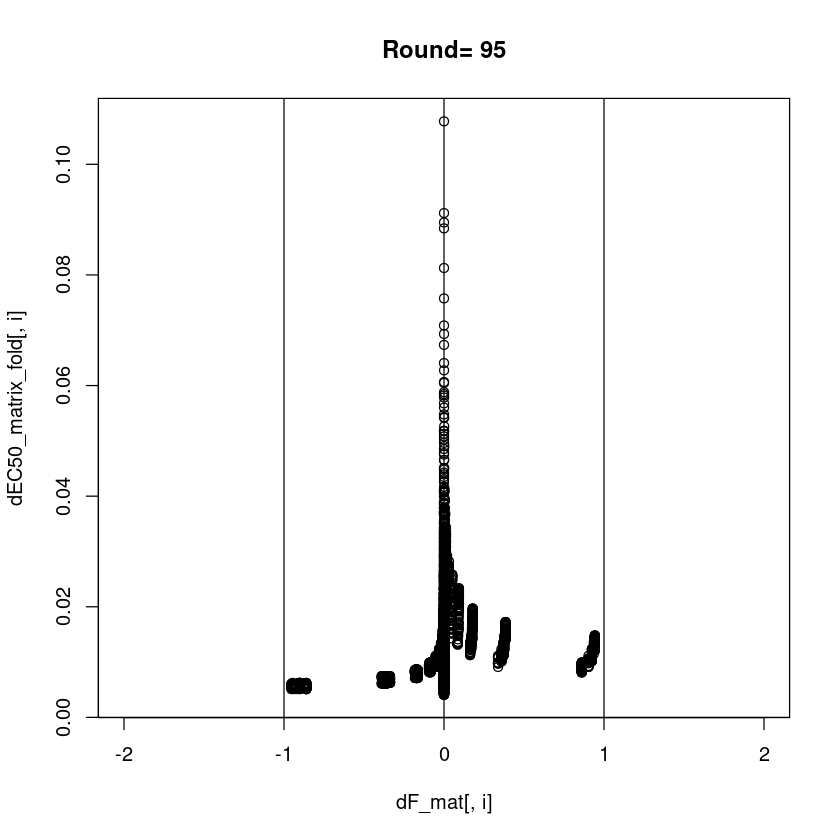

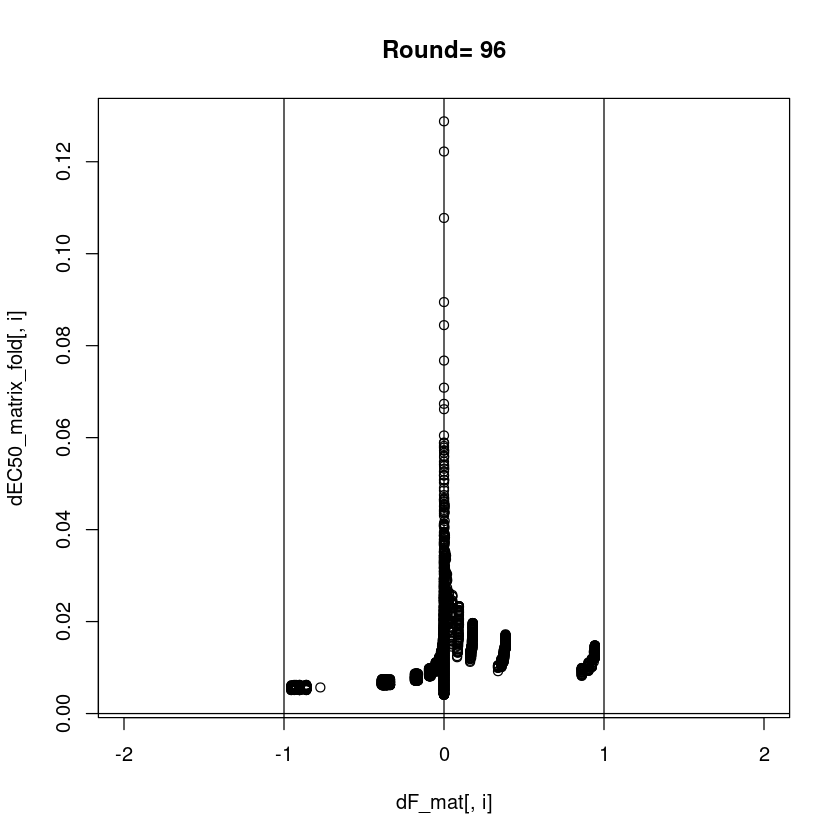

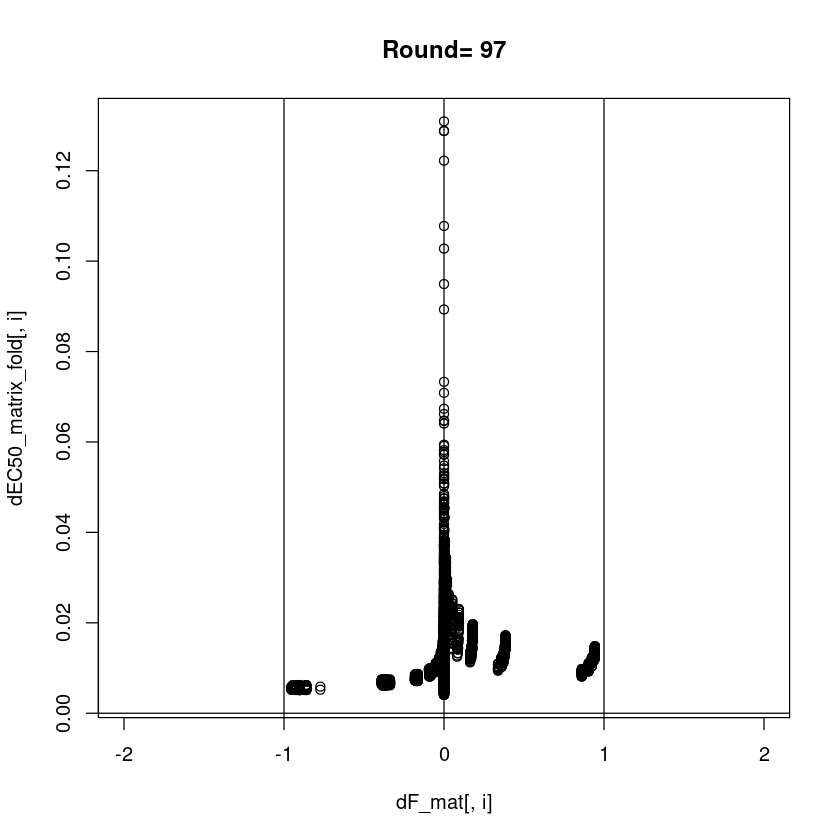

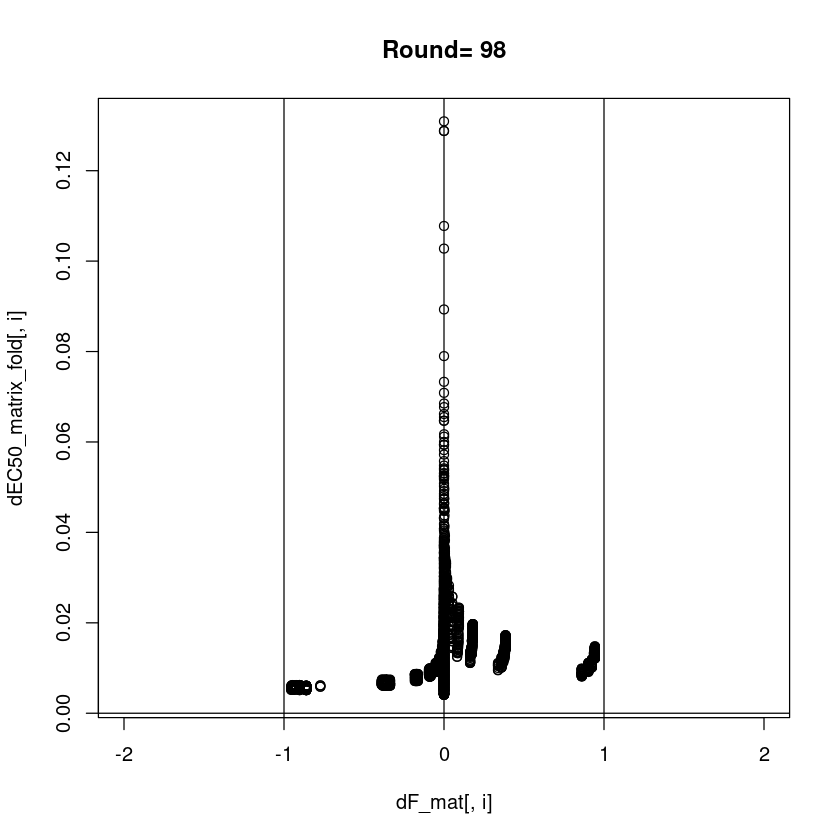

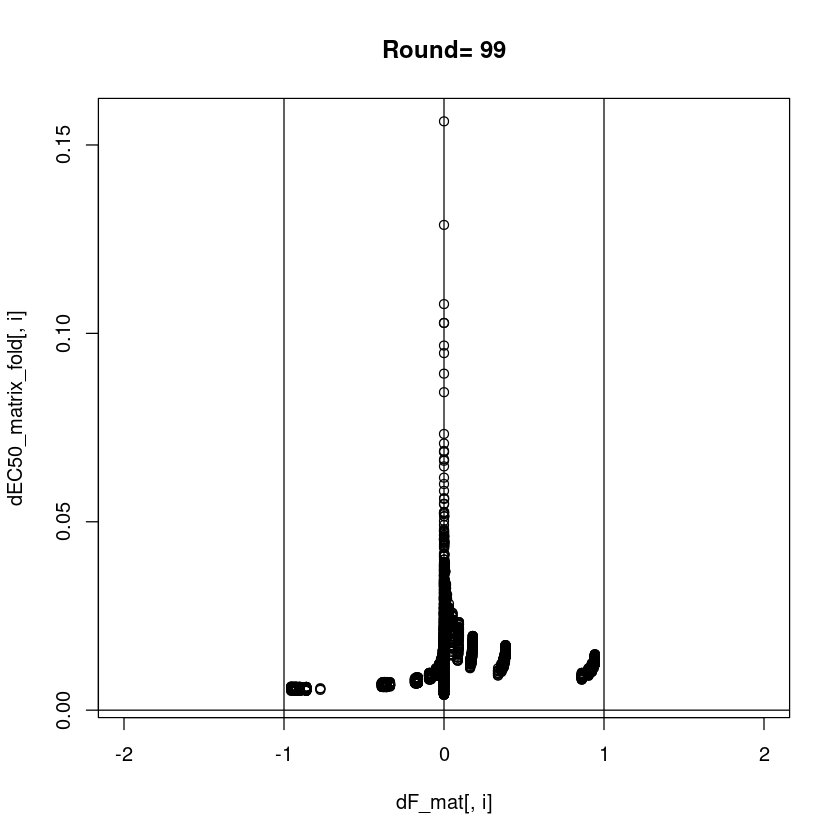

In [16]:
for (i in 1:99){
    
plot(dF_mat[,i],dEC50_matrix_fold[,i], 
     xlim=c(-2,2),main=paste("Round=", as.character(i)))     
     abline(h=0, v=0)
     abline(v=c(-1,1))

}




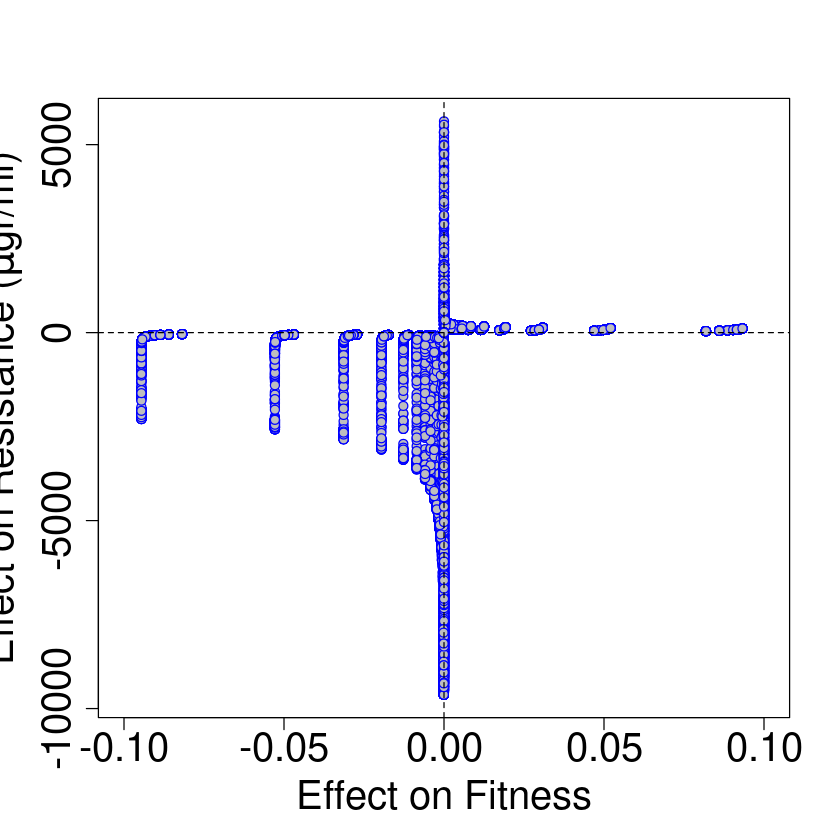

In [150]:
#pdf("./For_Ayse_SvgFormat/November_4th/Fitness_Resistance.pdf")
plot(dF_dEC50_matrix[,1], dF_dEC50_matrix[,2], 
     pch=21, col="blue", bg="gray",
    xlab="Effect on Fitness", 
    cex.lab=2, cex.axis=2,
    xlim=c(-0.1,0.1),
    ylab=expression(paste("Effect on Resistance (", mu,"gr/ml)", sep=""))
    
    )

abline(v=0, lty=2)
abline(h=0, lty=2)

#dev.off()

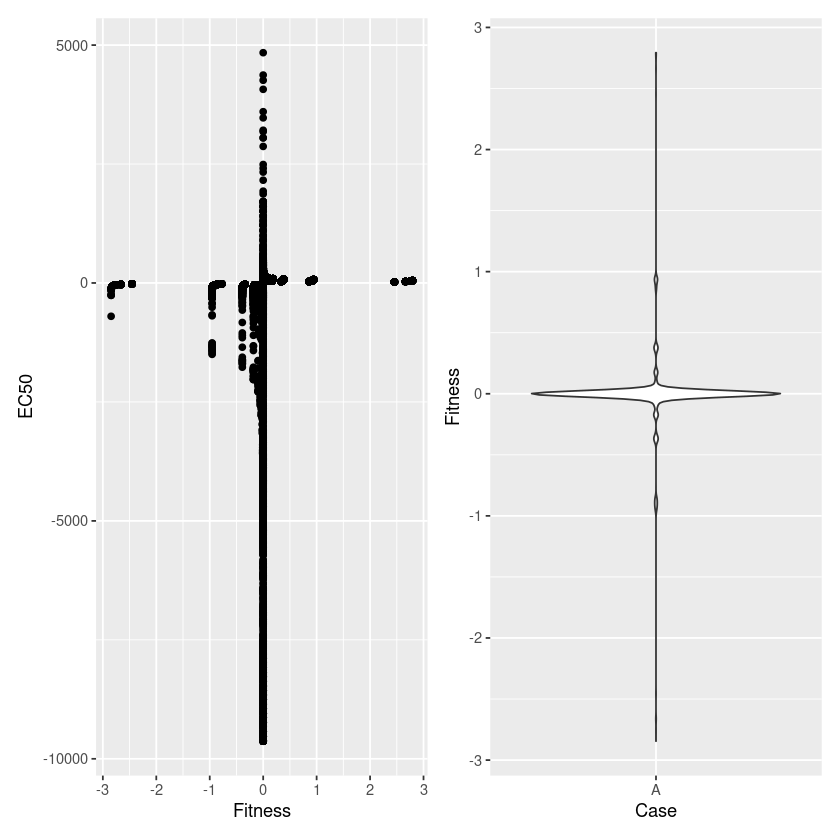

In [33]:

dF=cbind(rep("A", dim(dF_dEC50_matrix)[1]), dF_dEC50_matrix)

colnames(dF)=c("Case", "Fitness", "EC50")

dF=as.data.frame(dF)

p <- ggplot(dF, aes(x=Fitness, y=EC50)) + geom_point()

p <- p + ggplot(dF, aes(x=Case, Fitness)) + 
  geom_violin()
p

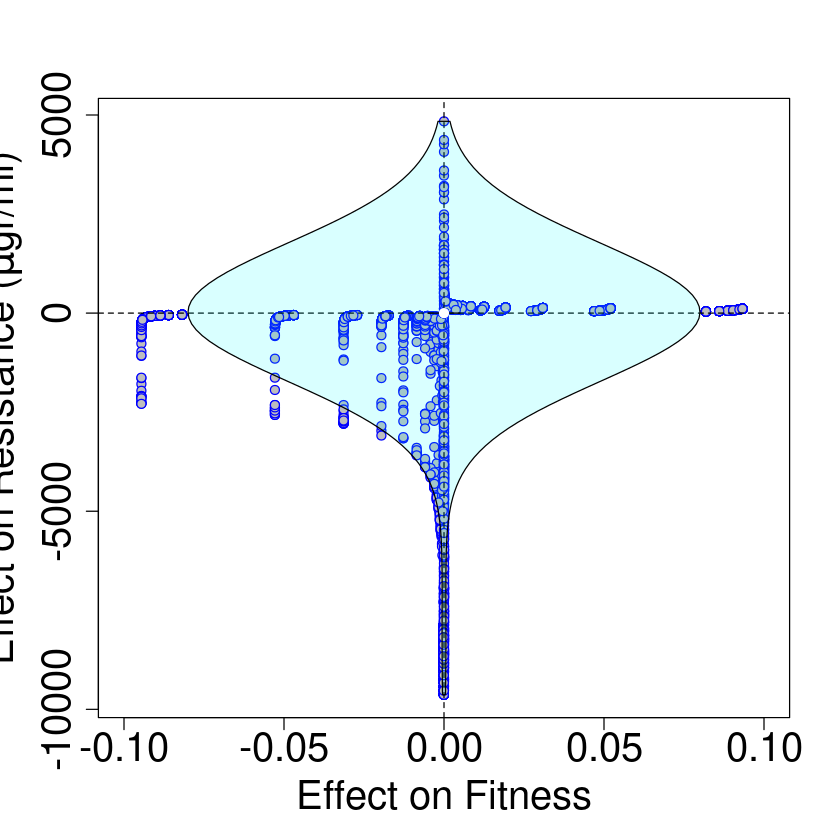

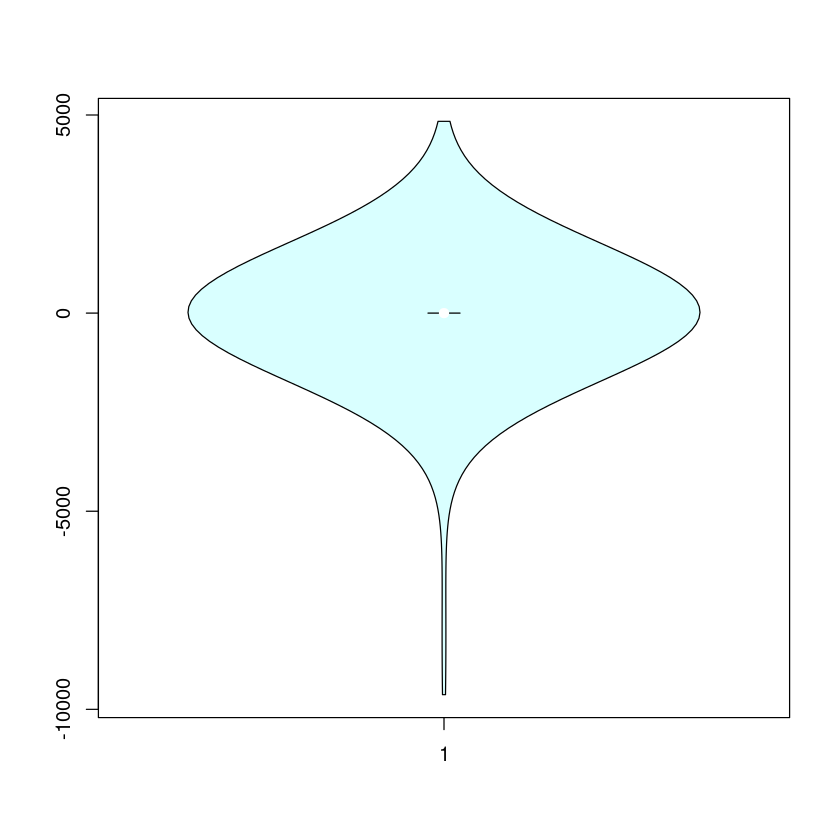

In [75]:
library("vioplot")


### Scatter plot
#pdf("./For_Ayse_SvgFormat/November_4th/Fitness_Resistance.pdf")
plot(dF_dEC50_matrix[,1], dF_dEC50_matrix[,2], 
     pch=21, col="blue", bg="gray",
    xlab="Effect on Fitness", 
    cex.lab=2, cex.axis=2,
    xlim=c(-0.1,0.1),
    ylab=expression(paste("Effect on Resistance (", mu,"gr/ml)", sep=""))
    
    )

abline(v=0, lty=2)
abline(h=0, lty=2)

#dev.off()


par(new = TRUE)

vioplot(dF$EC50, yaxt = "n", axes = FALSE,
       col = rgb(0, 1, 1, alpha = 0.15))



vioplot(dF$EC50, 
       col = rgb(0, 1, 1, alpha = 0.15))

#bline(h=median(dF$EC50), lwd=4)
#bline(h=quantile(dF$EC50,.25), lwd=4)
#boxplot(dF$EC50)

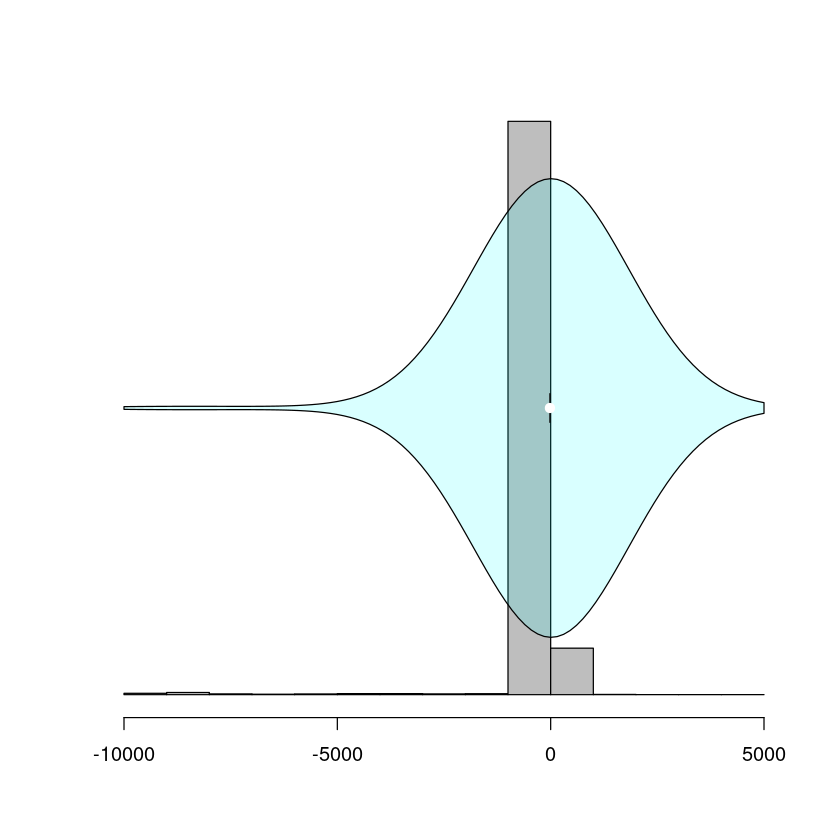

In [52]:
data=dF$EC50

# Histogram
hist(data, probability = TRUE, col = "grey", axes = FALSE,
     main = "", xlab = "",  ylab = "")

# X-axis
axis(1)


# Add violin plot
par(new = TRUE)
vioplot(data, horizontal = TRUE, yaxt = "n", axes = FALSE,
        col = rgb(0, 1, 1, alpha = 0.15))

In [143]:
colnames(dF_dEC50_matrix)=c("Fitness", "EC50")
dF_dEC50_matrix=as.data.frame(dF_dEC50_matrix)

In [152]:
length(which( (abs(dF_dEC50_matrix$Fitness) > 1) & (dF_dEC50_matrix$EC50 < 0) ))/ dim(dF_dEC50_matrix)[1]

[1] 0.002720202

In [155]:
MAT=dF_dEC50_matrix[which(dF_dEC50_matrix$EC50 !=0),]

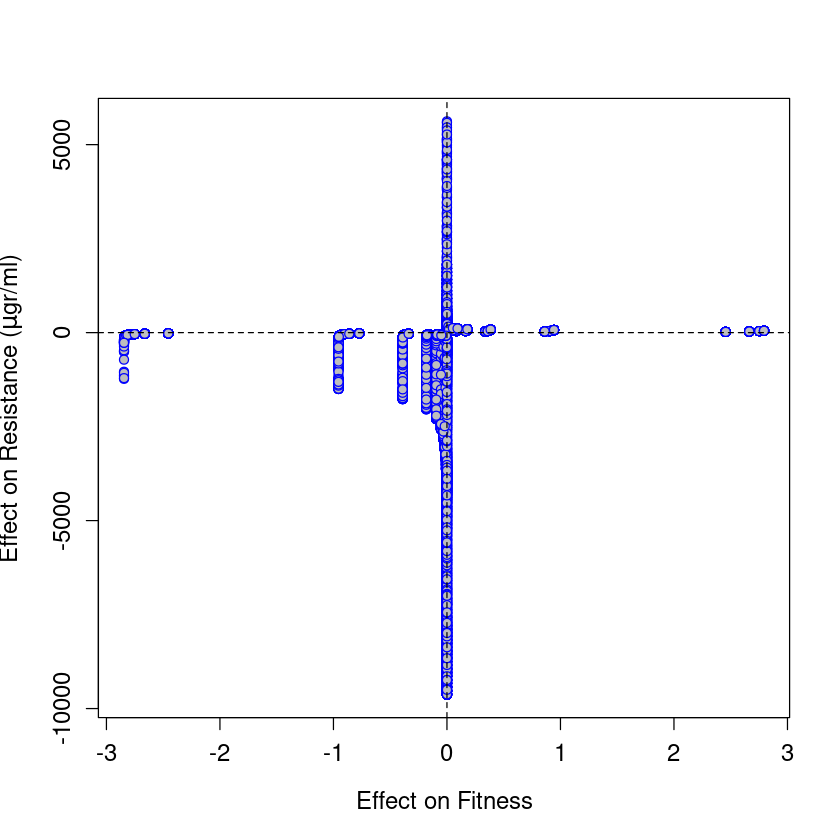

In [159]:
plot(MAT[,1], MAT[,2], 
     pch=21, col="blue", bg="gray",
    xlab="Effect on Fitness", 
    cex.lab=1.2, cex.axis=1.2,
    ylab=expression(paste("Effect on Resistance (", mu,"gr/ml)", sep=""))
    
    )

abline(v=0, lty=2)
abline(h=0, lty=2)


In [162]:
p <- ggplot(ToothGrowth, aes(x=dose, y=len)) + 
  geom_violin()
p


[1] 0.5931932

In [18]:
ToothGrowth$dose <- as.factor(ToothGrowth$dose)

In [19]:
ToothGrowth

len,supp,dose
<dbl>,<fct>,<fct>
4.2,VC,0.5
11.5,VC,0.5
7.3,VC,0.5
5.8,VC,0.5
6.4,VC,0.5
10.0,VC,0.5
11.2,VC,0.5
11.2,VC,0.5
5.2,VC,0.5
